In [ ]:
import zipfile

with zipfile.ZipFile("/content/drive/MyDrive/class40.zip", "r") as zip_ref:
    zip_ref.extractall("./")

# Nadam batch size 64

80134624/80134624 [==============================] - 3s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 80, 80, 3)]          0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 80, 80, 64)           1792      ['input_2[0][0]']             
                                                                                                  
 block1_conv2 (Conv2D)       (None, 80, 80, 64)           36928     ['block1_conv1[0][0]']        
                                                                                                  
 block1_pool (MaxPooling2D)  (None, 40, 40, 64)           0         ['block1_conv2[0][0]']        
                             

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


210/210 [==============================] - 25s 79ms/step - loss: 6.5334 - accuracy: 0.8191 - val_loss: 0.0578 - val_accuracy: 0.9892
Epoch 2/10
209/210 [============================>.] - ETA: 0s - loss: 0.0245 - accuracy: 0.9959
Epoch 2: val_accuracy improved from 0.98924 to 0.98954, saving model to best_model.h5
210/210 [==============================] - 14s 69ms/step - loss: 0.0245 - accuracy: 0.9959 - val_loss: 0.0494 - val_accuracy: 0.9895
Epoch 3/10
209/210 [============================>.] - ETA: 0s - loss: 0.0149 - accuracy: 0.9977
Epoch 3: val_accuracy improved from 0.98954 to 0.99014, saving model to best_model.h5
210/210 [==============================] - 15s 69ms/step - loss: 0.0149 - accuracy: 0.9977 - val_loss: 0.0494 - val_accuracy: 0.9901
Epoch 4/10
209/210 [============================>.] - ETA: 0s - loss: 0.0166 - accuracy: 0.9981
Epoch 4: val_accuracy improved from 0.99014 to 0.99074, saving model to best_model.h5
210/210 [==============================] - 15s 71ms/ste

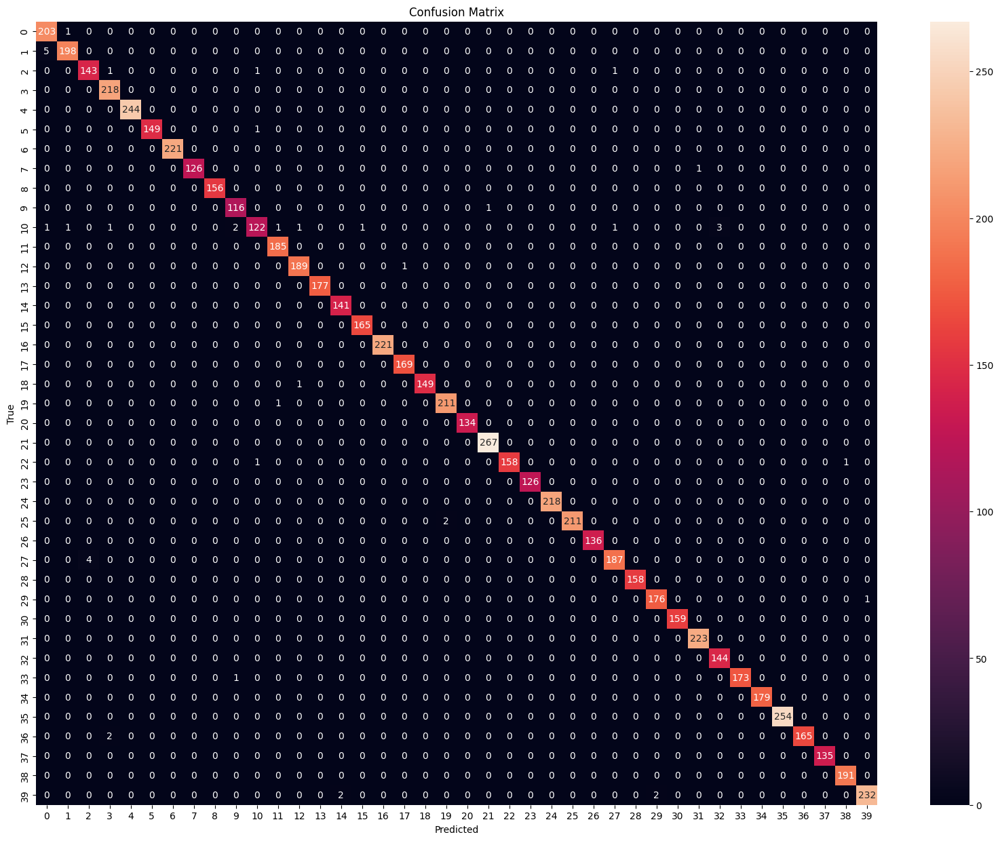

Classification Report:
              precision    recall  f1-score   support

           1       0.97      1.00      0.98       204
           2       0.99      0.98      0.98       203
           3       0.97      0.98      0.98       146
           4       0.98      1.00      0.99       218
           5       1.00      1.00      1.00       244
           6       1.00      0.99      1.00       150
           7       1.00      1.00      1.00       221
           8       1.00      0.99      1.00       127
           9       1.00      1.00      1.00       156
          10       0.97      0.99      0.98       117
          11       0.98      0.91      0.94       134
          12       0.99      1.00      0.99       185
          13       0.99      0.99      0.99       190
          14       1.00      1.00      1.00       177
          15       0.99      1.00      0.99       141
          16       0.99      1.00      1.00       165
          17       1.00      1.00      1.00       221
    

In [ ]:
import zipfile
import os
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D
from keras.optimizers import Nadam
from keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.layers import Input, concatenate


def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=1)

num_classes = 41
y_train_encoded = to_categorical(y_train, num_classes)
y_test_encoded = to_categorical(y_test, num_classes)

cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu')(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu')(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu')(cnn_layer5)

base_model = VGG19(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu')(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  
vgg_output = Dense(num_classes, activation='softmax')(vgg_output)

merged_model = concatenate([cnn_output, vgg_output])

output_layer = Dense(num_classes, activation='softmax')(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer=Nadam(), loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()


checkpoint = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

history = model.fit([x_train, x_train], y_train_encoded,
                    batch_size=64,
                    epochs=10,
                    validation_split=0.2,
                    callbacks=[checkpoint, early_stopping])

test_loss, test_accuracy = model.evaluate([x_test, x_test], y_test_encoded)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

predictions = model.predict([x_test, x_test])
predicted_classes = np.argmax(predictions, axis=1)

f1 = f1_score(y_test, predicted_classes, average='macro')
print("F1 Score:", f1)


cm = confusion_matrix(y_test, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d")
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


report = classification_report(y_test, predicted_classes)
print("Classification Report:")
print(report)


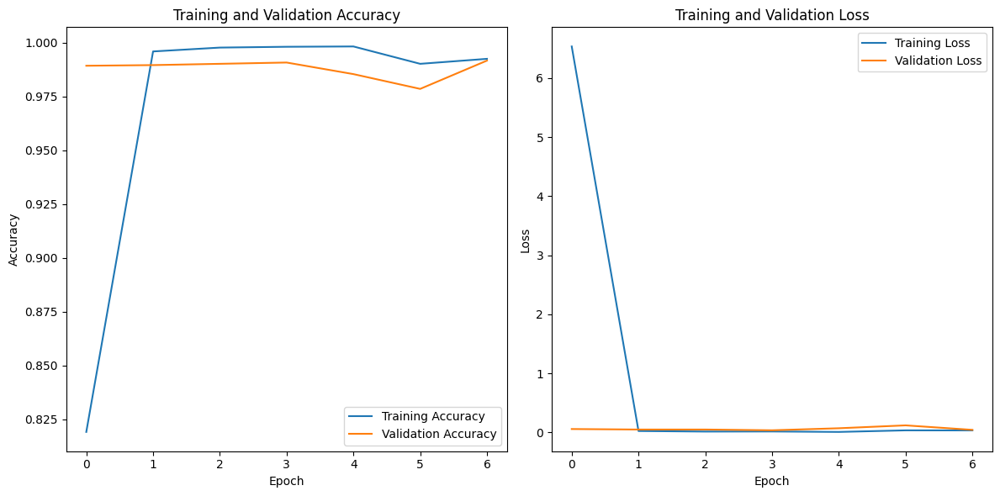

In [ ]:
                                            # Plot training and validation accuracy 
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

                                        # Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


##  Nadam epoch 15 batch size 64


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 80, 80, 3)]          0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 80, 80, 64)           1792      ['input_4[0][0]']             
                                                                                                  
 block1_conv2 (Conv2D)       (None, 80, 80, 64)           36928     ['block1_conv1[0][0]']        
                                                                                                  
 block1_pool (MaxPooling2D)  (None, 40, 40, 64)           0         ['block1_conv2[0][0]']        
                                                                                            

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


210/210 [==============================] - 19s 78ms/step - loss: 9.0887 - accuracy: 0.8129 - val_loss: 0.4840 - val_accuracy: 0.9848
Epoch 2/20
209/210 [============================>.] - ETA: 0s - loss: 0.3724 - accuracy: 0.9954
Epoch 2: val_accuracy improved from 0.98476 to 0.99223, saving model to best_model.h5
210/210 [==============================] - 16s 78ms/step - loss: 0.3723 - accuracy: 0.9954 - val_loss: 0.3590 - val_accuracy: 0.9922
Epoch 3/20
209/210 [============================>.] - ETA: 0s - loss: 0.3117 - accuracy: 0.9981
Epoch 3: val_accuracy did not improve from 0.99223
210/210 [==============================] - 16s 75ms/step - loss: 0.3117 - accuracy: 0.9981 - val_loss: 0.3458 - val_accuracy: 0.9910
Epoch 4/20
209/210 [============================>.] - ETA: 0s - loss: 0.3104 - accuracy: 0.9942
Epoch 4: val_accuracy did not improve from 0.99223
210/210 [==============================] - 16s 74ms/step - loss: 0.3104 - accuracy: 0.9942 - val_loss: 0.3257 - val_accuracy:

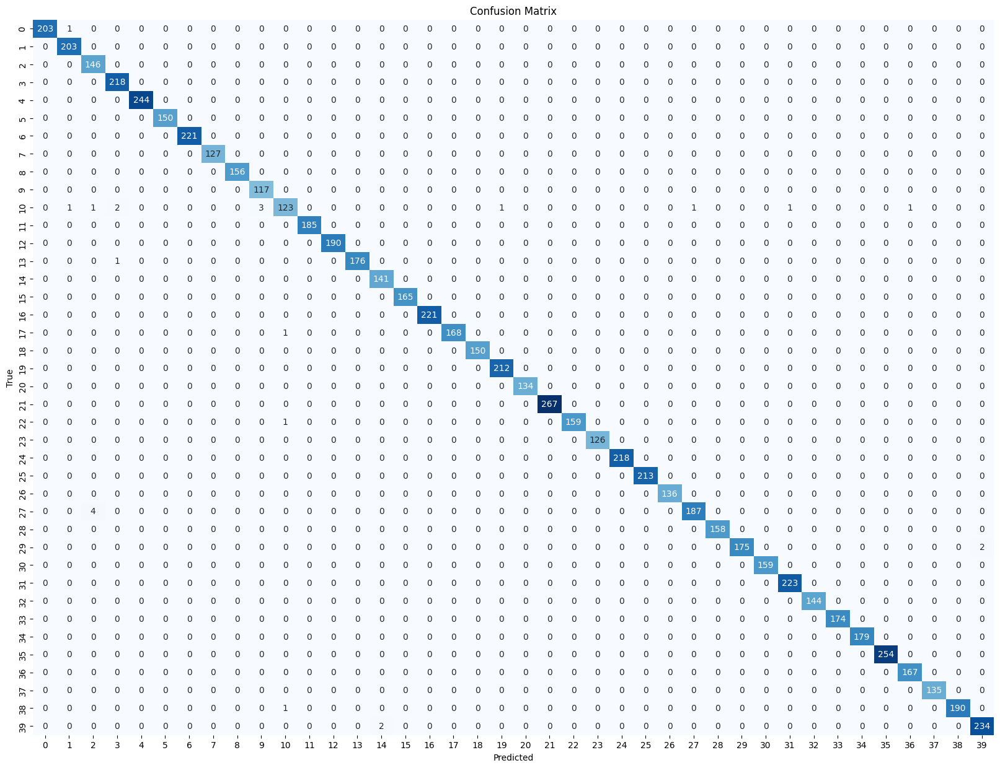

Classification Report:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00       204
           2       0.99      1.00      1.00       203
           3       0.97      1.00      0.98       146
           4       0.99      1.00      0.99       218
           5       1.00      1.00      1.00       244
           6       1.00      1.00      1.00       150
           7       1.00      1.00      1.00       221
           8       1.00      1.00      1.00       127
           9       1.00      1.00      1.00       156
          10       0.97      1.00      0.99       117
          11       0.98      0.92      0.95       134
          12       1.00      1.00      1.00       185
          13       1.00      1.00      1.00       190
          14       1.00      0.99      1.00       177
          15       0.99      1.00      0.99       141
          16       1.00      1.00      1.00       165
          17       1.00      1.00      1.00       221
    

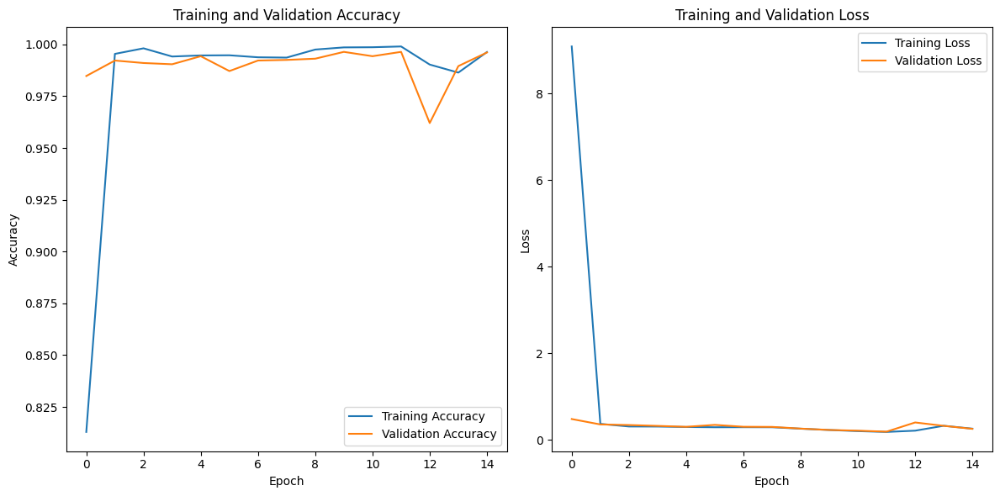

In [ ]:
import zipfile
import os
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import Nadam
from keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2


def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=1)

num_classes = 41
y_train_encoded = to_categorical(y_train, num_classes)
y_test_encoded = to_categorical(y_test, num_classes)

cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

base_model = VGG19(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output) 
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

merged_model = concatenate([cnn_output, vgg_output])

output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer=Nadam(), loss='categorical_crossentropy', metrics=['accuracy'])


model.summary()

checkpoint = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

history = model.fit([x_train, x_train], y_train_encoded,
                    batch_size=64,
                    epochs=20, 
                    validation_split=0.2,
                    callbacks=[checkpoint, early_stopping])


test_loss, test_accuracy = model.evaluate([x_test, x_test], y_test_encoded)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

predictions = model.predict([x_test, x_test])
predicted_classes = np.argmax(predictions, axis=1)


f1 = f1_score(y_test, predicted_classes, average='macro')
print("F1 Score:", f1)

cm = confusion_matrix(y_test, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


report = classification_report(y_test, predicted_classes)
print("Classification Report:")
print(report)


plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


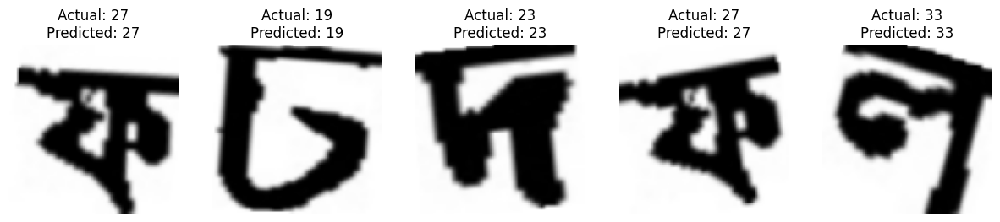

In [ ]:
# Function to display sample images along with actual and predicted classes
def display_sample_images(images, actual_labels, predicted_labels, class_names, num_samples=5):
    plt.figure(figsize=(15, 8))
    for i in range(num_samples):
        plt.subplot(1, num_samples, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.show()


class_names = [str(i) for i in range(41)] 
display_sample_images(x_test, y_test, predicted_classes, class_names)


F1 Score: 0.9962235456117714


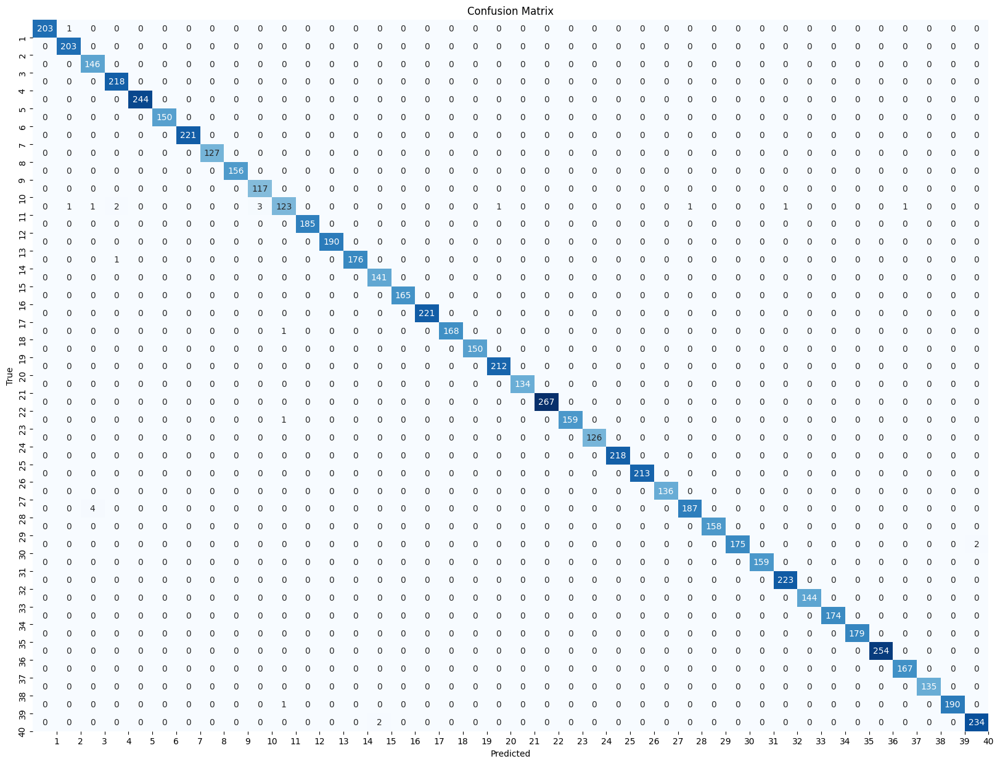

In [ ]:

f1 = f1_score(y_test, predicted_classes, average='macro')
print("F1 Score:", f1)

plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)

plt.xticks(np.arange(1, 41), np.arange(1, 41))
plt.yticks(np.arange(1, 41), np.arange(1, 41))

plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


# Nadam batch size 128

Epoch 1/10
105/105 [==============================] - 26s 178ms/step - loss: 15.3971 - accuracy: 0.7724 - val_loss: 0.4933 - val_accuracy: 0.9901
Epoch 2/10
105/105 [==============================] - 15s 146ms/step - loss: 0.4134 - accuracy: 0.9962 - val_loss: 0.3936 - val_accuracy: 0.9952
Epoch 3/10
105/105 [==============================] - 15s 141ms/step - loss: 0.3426 - accuracy: 0.9984 - val_loss: 0.3439 - val_accuracy: 0.9952
Epoch 4/10
105/105 [==============================] - 14s 138ms/step - loss: 0.3164 - accuracy: 0.9981 - val_loss: 0.3353 - val_accuracy: 0.9940
Epoch 5/10
105/105 [==============================] - 14s 138ms/step - loss: 0.2973 - accuracy: 0.9977 - val_loss: 0.2990 - val_accuracy: 0.9964
Epoch 6/10
105/105 [==============================] - 15s 139ms/step - loss: 0.2703 - accuracy: 0.9986 - val_loss: 0.2867 - val_accuracy: 0.9967
Epoch 7/10
105/105 [==============================] - 15s 141ms/step - loss: 0.2515 - accuracy: 0.9990 - val_loss: 0.2853 - val_a

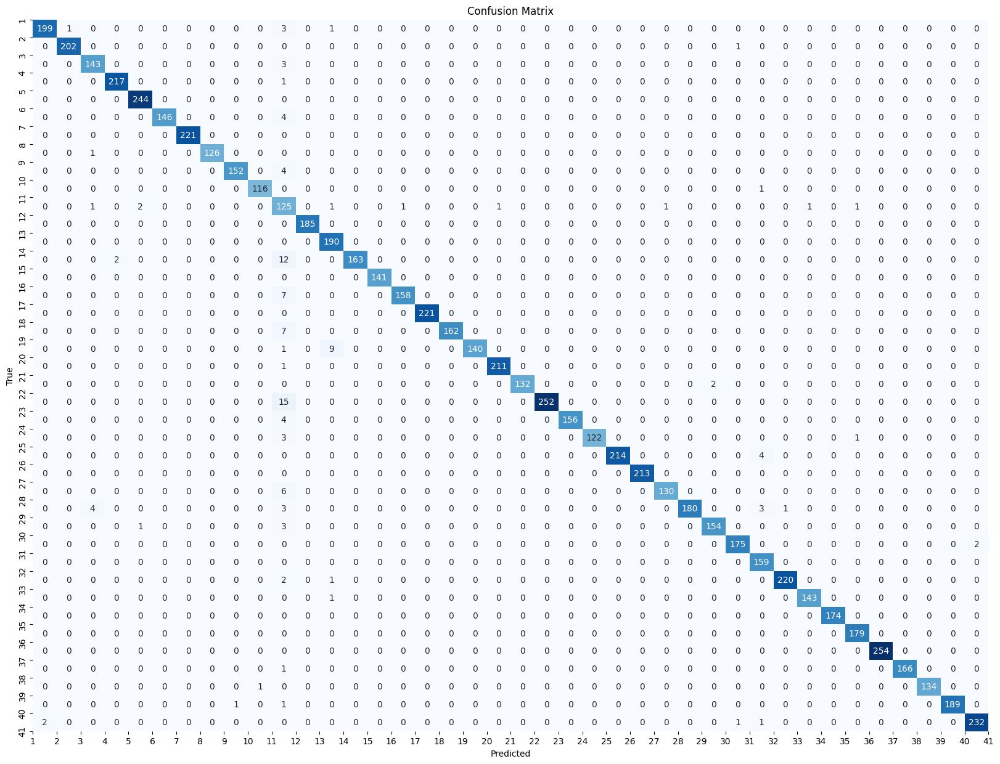

Classification Report:
              precision    recall  f1-score   support

           1       0.99      0.98      0.98       204
           2       1.00      1.00      1.00       203
           3       0.96      0.98      0.97       146
           4       0.99      1.00      0.99       218
           5       0.99      1.00      0.99       244
           6       1.00      0.97      0.99       150
           7       1.00      1.00      1.00       221
           8       1.00      0.99      1.00       127
           9       0.99      0.97      0.98       156
          10       0.99      0.99      0.99       117
          11       0.61      0.93      0.74       134
          12       1.00      1.00      1.00       185
          13       0.94      1.00      0.97       190
          14       1.00      0.92      0.96       177
          15       1.00      1.00      1.00       141
          16       0.99      0.96      0.98       165
          17       1.00      1.00      1.00       221
    

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import Nadam
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2

def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder)
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to VGG-19 input size
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=1)

num_classes = 41
y_train_encoded = to_categorical(y_train, num_classes)
y_test_encoded = to_categorical(y_test, num_classes)

cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

base_model = VGG19(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

merged_model = concatenate([cnn_output, vgg_output])

output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer=Nadam(), loss='categorical_crossentropy', metrics=['accuracy'])

history = model.fit([x_train, x_train], y_train_encoded,
                    batch_size=128,  
                    epochs=10,  
                    validation_split=0.2,
                    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)])

predictions = model.predict([x_test, x_test])
predicted_classes = np.argmax(predictions, axis=1)

f1 = f1_score(y_test, predicted_classes, average='macro')
print("F1 Score:", f1)

cm = confusion_matrix(y_test, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(41), np.arange(1, 42)) 
plt.yticks(np.arange(41), np.arange(1, 42))  
plt.show()

report = classification_report(y_test, predicted_classes)
print("Classification Report:")
print(report)


# NAdam 16

80134624/80134624 [==============================] - 4s 0us/step
Epoch 1/10
837/837 [==============================] - 392s 465ms/step - loss: 1.6601 - accuracy: 0.9231 - val_loss: 0.4023 - val_accuracy: 0.9743
Epoch 2/10
837/837 [==============================] - 379s 452ms/step - loss: 0.3222 - accuracy: 0.9900 - val_loss: 0.3538 - val_accuracy: 0.9809
Epoch 3/10
837/837 [==============================] - 378s 451ms/step - loss: 0.3023 - accuracy: 0.9904 - val_loss: 0.3232 - val_accuracy: 0.9889
Epoch 4/10
837/837 [==============================] - 375s 448ms/step - loss: 0.2942 - accuracy: 0.9898 - val_loss: 0.3244 - val_accuracy: 0.9824
Epoch 5/10
837/837 [==============================] - 357s 426ms/step - loss: 0.2591 - accuracy: 0.9897 - val_loss: 0.3029 - val_accuracy: 0.9845
Epoch 6/10
837/837 [==============================] - 354s 424ms/step - loss: 0.3083 - accuracy: 0.9880 - val_loss: 0.2846 - val_accuracy: 0.9889
Epoch 7/10
837/837 [==============================] - 351s 

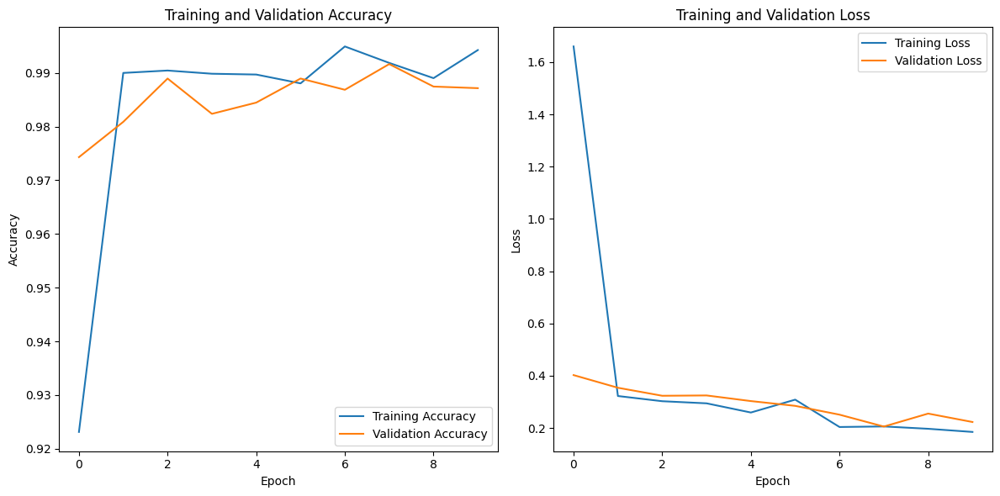

225/225 [==============================] - 129s 573ms/step
F1 Score: 0.9842349119051381


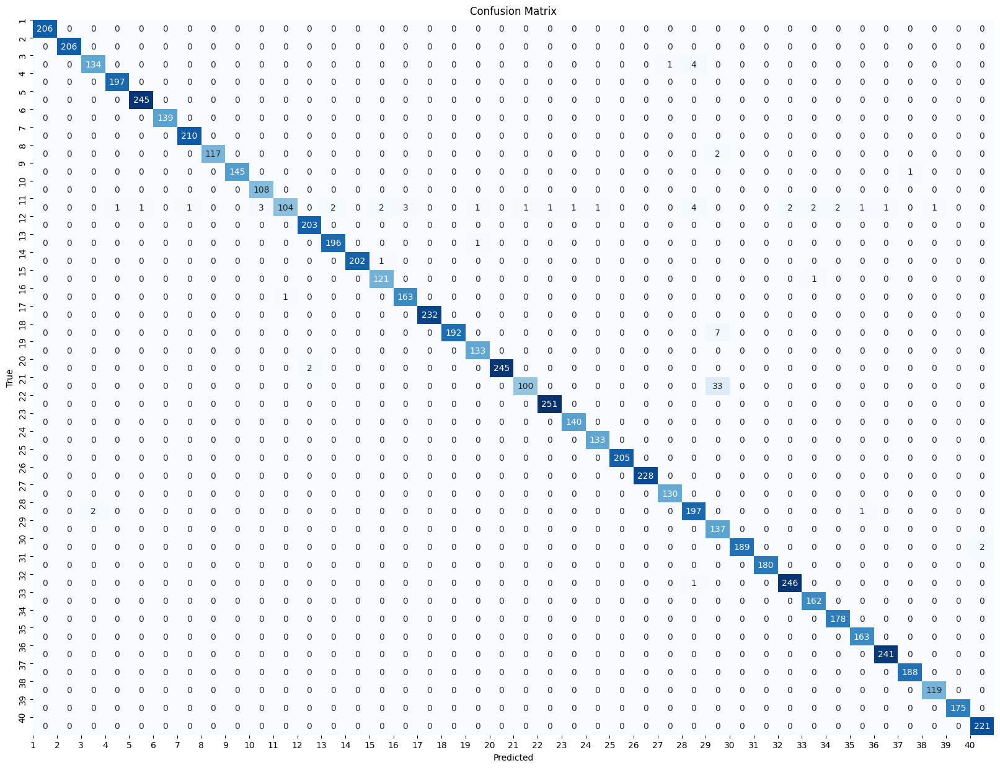

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       206
           1       1.00      1.00      1.00       206
           2       0.99      0.96      0.97       139
           3       0.99      1.00      1.00       197
           4       1.00      1.00      1.00       245
           5       1.00      1.00      1.00       139
           6       1.00      1.00      1.00       210
           7       1.00      0.98      0.99       119
           8       1.00      0.99      1.00       146
           9       0.97      1.00      0.99       108
          10       0.99      0.77      0.87       135
          11       0.99      1.00      1.00       203
          12       0.99      0.99      0.99       197
          13       1.00      1.00      1.00       203
          14       0.98      0.99      0.98       122
          15       0.98      0.99      0.99       164
          16       1.00      1.00      1.00       232
    

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import Nadam
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2

def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder) - 1 
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80)) 
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=1)

num_classes = 40  
y_train_encoded = to_categorical(y_train, num_classes)
y_test_encoded = to_categorical(y_test, num_classes)

cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

base_model = VGG19(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

merged_model = concatenate([cnn_output, vgg_output])

output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer=Nadam(), loss='categorical_crossentropy', metrics=['accuracy'])

history = model.fit([x_train, x_train], y_train_encoded,
                    batch_size=16,  
                    epochs=10,  
                    validation_split=0.2,
                    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)])

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

predictions = model.predict([x_test, x_test])
predicted_classes = np.argmax(predictions, axis=1)

f1 = f1_score(y_test, predicted_classes, average='macro')
print("F1 Score:", f1)

cm = confusion_matrix(y_test, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(num_classes), np.arange(1, num_classes + 1))  # Adjust x-axis labels
plt.yticks(np.arange(num_classes), np.arange(1, num_classes + 1))  # Adjust y-axis labels
plt.show()

report = classification_report(y_test, predicted_classes)
print("Classification Report:")
print(report)


# Nadam 32

Epoch 1/10
419/419 [==============================] - 348s 826ms/step - loss: 3.9400 - accuracy: 0.8891 - val_loss: 0.5066 - val_accuracy: 0.9758
Epoch 2/10
419/419 [==============================] - 340s 811ms/step - loss: 0.3847 - accuracy: 0.9910 - val_loss: 0.4339 - val_accuracy: 0.9836
Epoch 3/10
419/419 [==============================] - 310s 740ms/step - loss: 0.3683 - accuracy: 0.9912 - val_loss: 0.4032 - val_accuracy: 0.9857
Epoch 4/10
419/419 [==============================] - 280s 669ms/step - loss: 0.3776 - accuracy: 0.9888 - val_loss: 0.4527 - val_accuracy: 0.9818
Epoch 5/10
419/419 [==============================] - 280s 669ms/step - loss: 0.3392 - accuracy: 0.9937 - val_loss: 0.3884 - val_accuracy: 0.9821
Epoch 6/10
419/419 [==============================] - 278s 663ms/step - loss: 0.2862 - accuracy: 0.9974 - val_loss: 0.2794 - val_accuracy: 0.9931
Epoch 7/10
419/419 [==============================] - 278s 663ms/step - loss: 0.2339 - accuracy: 0.9969 - val_loss: 0.4158 -

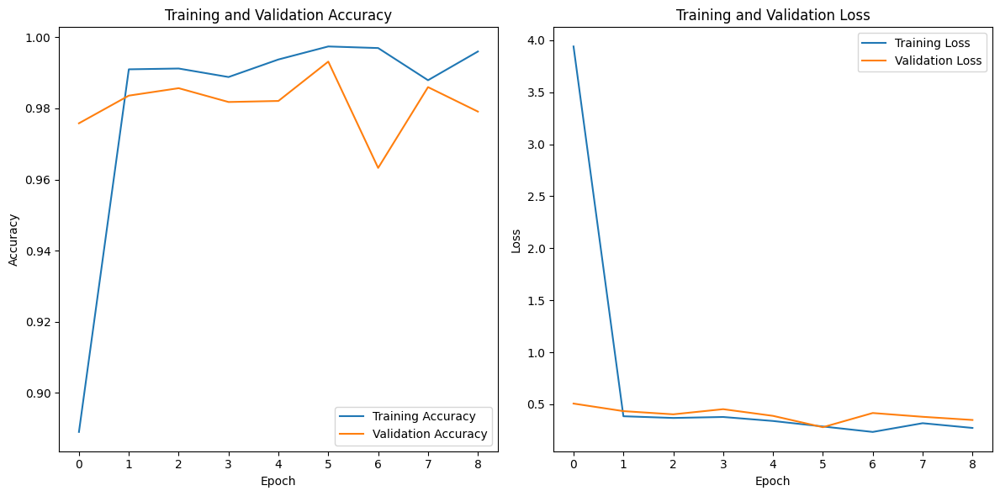

225/225 [==============================] - 111s 495ms/step
F1 Score: 0.9934244972541743


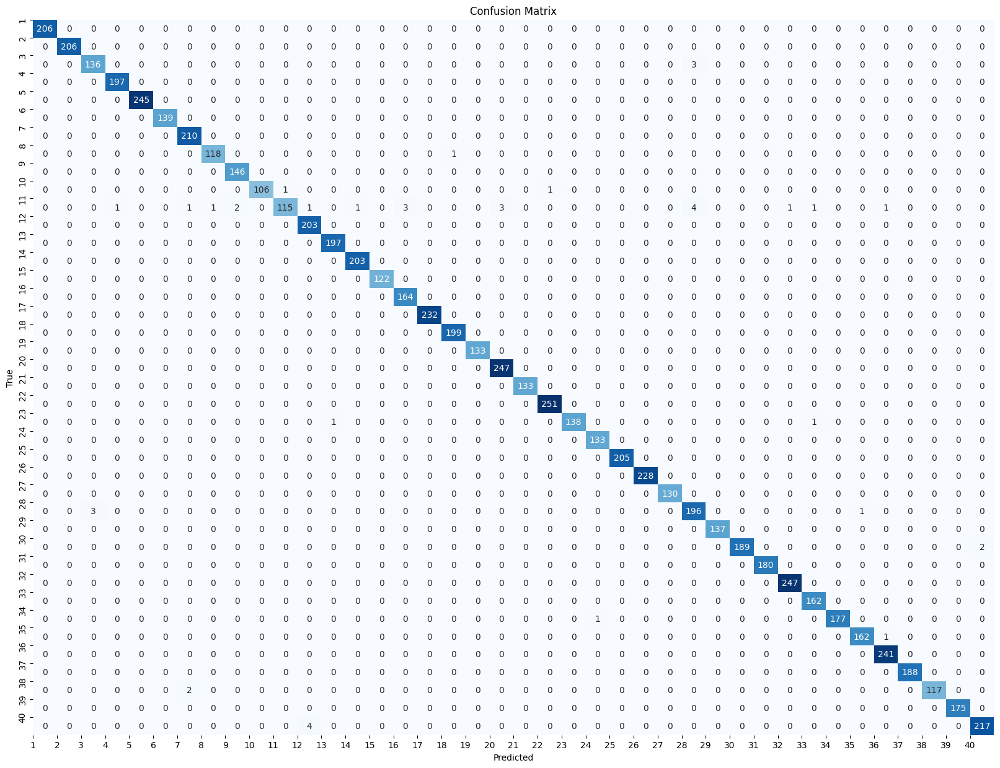

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       206
           1       1.00      1.00      1.00       206
           2       0.98      0.98      0.98       139
           3       0.99      1.00      1.00       197
           4       1.00      1.00      1.00       245
           5       1.00      1.00      1.00       139
           6       0.99      1.00      0.99       210
           7       0.99      0.99      0.99       119
           8       0.99      1.00      0.99       146
           9       1.00      0.98      0.99       108
          10       0.99      0.85      0.92       135
          11       0.98      1.00      0.99       203
          12       0.99      1.00      1.00       197
          13       1.00      1.00      1.00       203
          14       1.00      1.00      1.00       122
          15       0.98      1.00      0.99       164
          16       1.00      1.00      1.00       232
    

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import Nadam
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2

# Function to load and preprocess the dataset
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder) - 1  # Adjust labels to start from 0
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to VGG-19 input size
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

# Load the dataset
dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

# Split the dataset into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=1)

# One-hot encode the labels
num_classes = 40  # Corrected the number of classes
y_train_encoded = to_categorical(y_train, num_classes)
y_test_encoded = to_categorical(y_test, num_classes)

# Define CNN model
cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

# Load pre-trained VGG19 model without fully connected layers
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

# Add custom classification layers with dropout
vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  # Add dropout layer
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

# Merge CNN and VGG19 models
merged_model = concatenate([cnn_output, vgg_output])

# Create the final model
output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

# Freeze the weights of the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model with Nadam optimizer and a batch size of 128
model.compile(optimizer=Nadam(), loss='categorical_crossentropy', metrics=['accuracy'])

 #Train the model for 10 epochs without using checkpoint
history = model.fit([x_train, x_train], y_train_encoded,
                    batch_size=32,  # Batch size 32
                    epochs=10,  # Train for 10 epochs
                    validation_split=0.2,
                    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)])

# Plot training and validation accuracy curves along with training and validation loss curves
plt.figure(figsize=(12, 6))

# Plot training and validation accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Make predictions
predictions = model.predict([x_test, x_test])
predicted_classes = np.argmax(predictions, axis=1)

# Calculate F1 score
f1 = f1_score(y_test, predicted_classes, average='macro')
print("F1 Score:", f1)

# Plot confusion matrix with classes indexed from 0 to 39
cm = confusion_matrix(y_test, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(num_classes), np.arange(1, num_classes + 1))  # Adjust x-axis labels
plt.yticks(np.arange(num_classes), np.arange(1, num_classes + 1))  # Adjust y-axis labels
plt.show()

# Generate classification report
report = classification_report(y_test, predicted_classes)
print("Classification Report:")
print(report)


# Function to display sample images along with actual and predicted classes

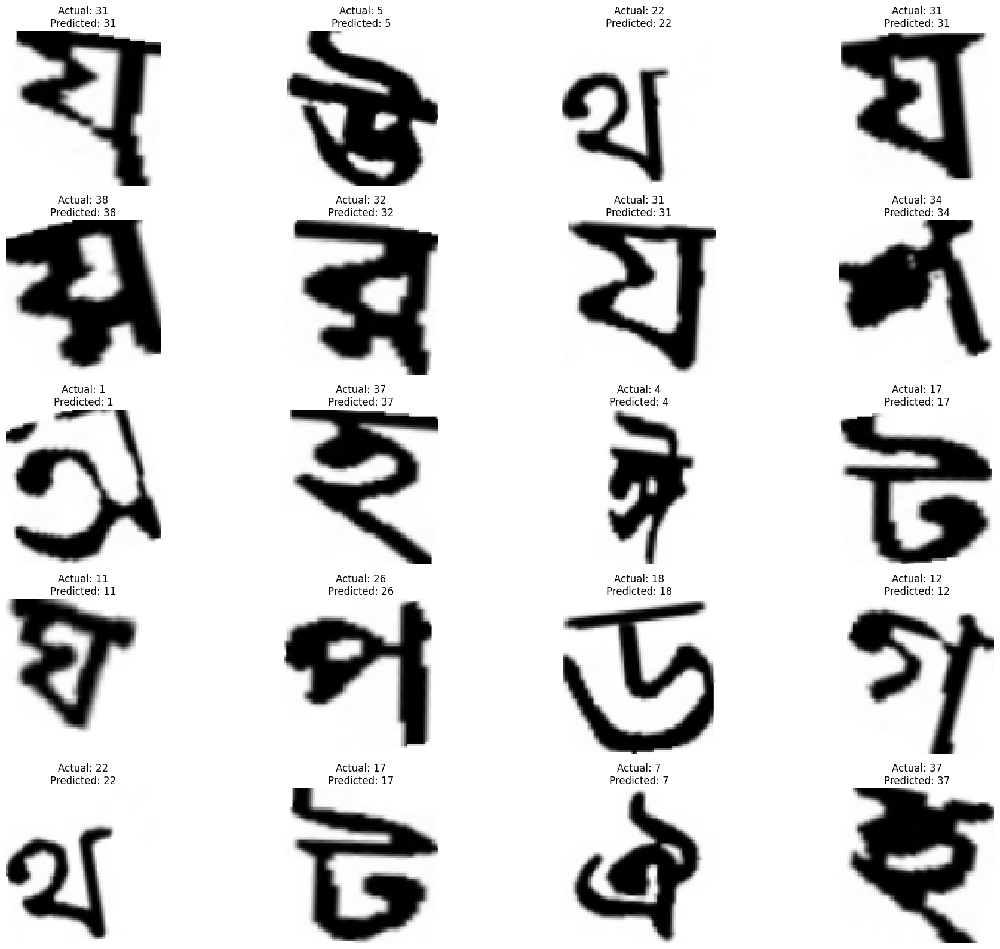

In [ ]:

def display_sample_images_with_predictions(images, actual_labels, predicted_labels, class_names, num_samples=20, num_rows=5):
    plt.figure(figsize=(20, 16))
    for i in range(num_samples):
        plt.subplot(num_rows, num_samples // num_rows, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

class_names = [str(i) for i in range(1, 41)]  
display_sample_images_with_predictions(x_test, y_test, predicted_classes, class_names)



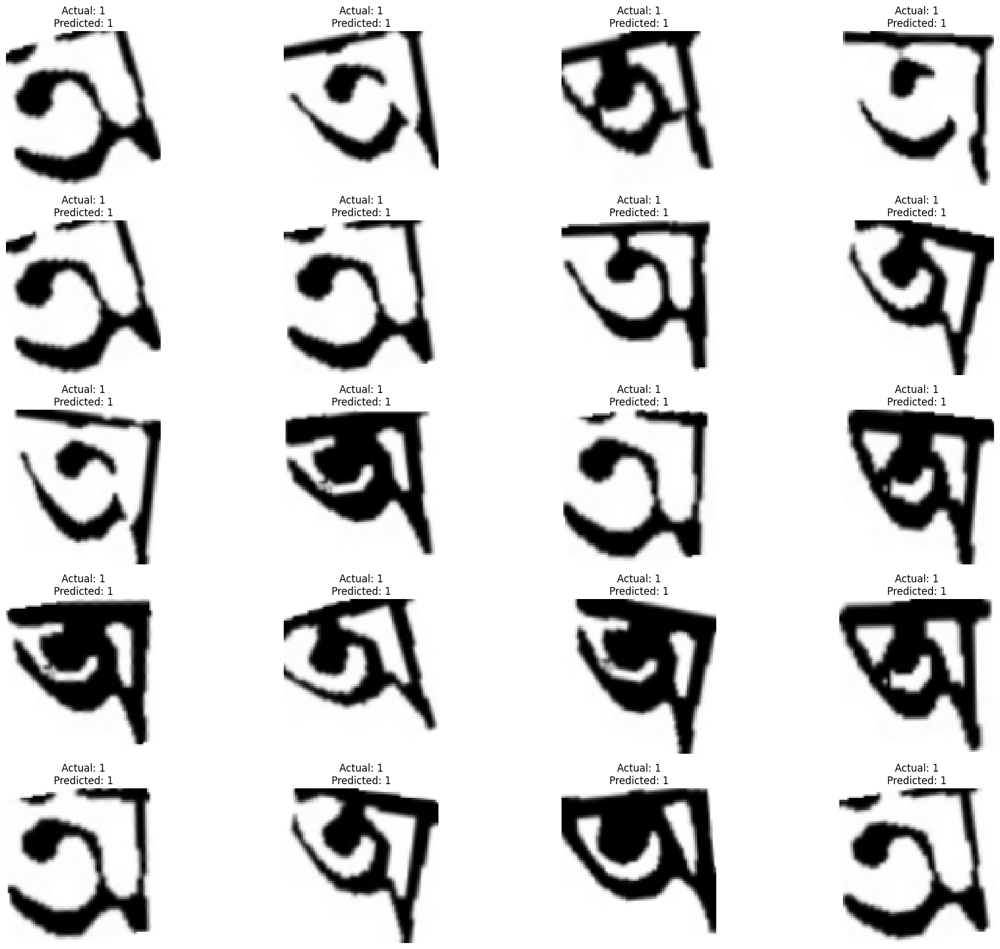

In [ ]:

def display_sample_images_with_predicted_level(images, actual_labels, predicted_labels, class_names, predicted_level, num_samples=20, num_rows=5):
    plt.figure(figsize=(20, 16))
    count = 0
    for i in range(len(images)):
        if class_names[predicted_labels[i]] == predicted_level and count < num_samples:
            plt.subplot(num_rows, num_samples // num_rows, count+1)
            plt.imshow(images[i])
            plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
            plt.axis('off')
            count += 1
    plt.tight_layout()
    plt.show()

predicted_level = '1'  
display_sample_images_with_predicted_level(x_test, y_test, predicted_classes, class_names, predicted_level)


#**adam bt size 16**

Epoch 1/10
893/893 [==============================] - 287s 320ms/step - loss: 2.8473 - accuracy: 0.9201 - val_loss: 0.4851 - val_accuracy: 0.9752
Epoch 2/10
893/893 [==============================] - 285s 319ms/step - loss: 0.4106 - accuracy: 0.9877 - val_loss: 0.4073 - val_accuracy: 0.9872
Epoch 3/10
893/893 [==============================] - 284s 318ms/step - loss: 0.3869 - accuracy: 0.9881 - val_loss: 0.4096 - val_accuracy: 0.9848
Epoch 4/10
893/893 [==============================] - 283s 317ms/step - loss: 0.3571 - accuracy: 0.9886 - val_loss: 0.4108 - val_accuracy: 0.9800
Epoch 5/10
893/893 [==============================] - 283s 317ms/step - loss: 0.3148 - accuracy: 0.9918 - val_loss: 0.3319 - val_accuracy: 0.9898
Epoch 6/10
893/893 [==============================] - 282s 316ms/step - loss: 0.2907 - accuracy: 0.9913 - val_loss: 0.3235 - val_accuracy: 0.9815
Epoch 7/10
893/893 [==============================] - 283s 317ms/step - loss: 0.2433 - accuracy: 0.9929 - val_loss: 0.2414 -

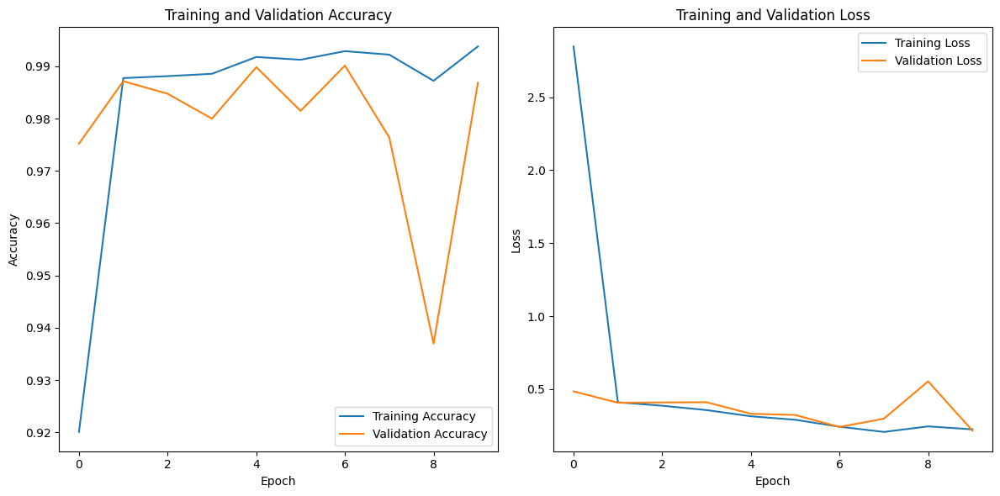

225/225 [==============================] - 111s 491ms/step
F1 Score: 0.9868650247304259


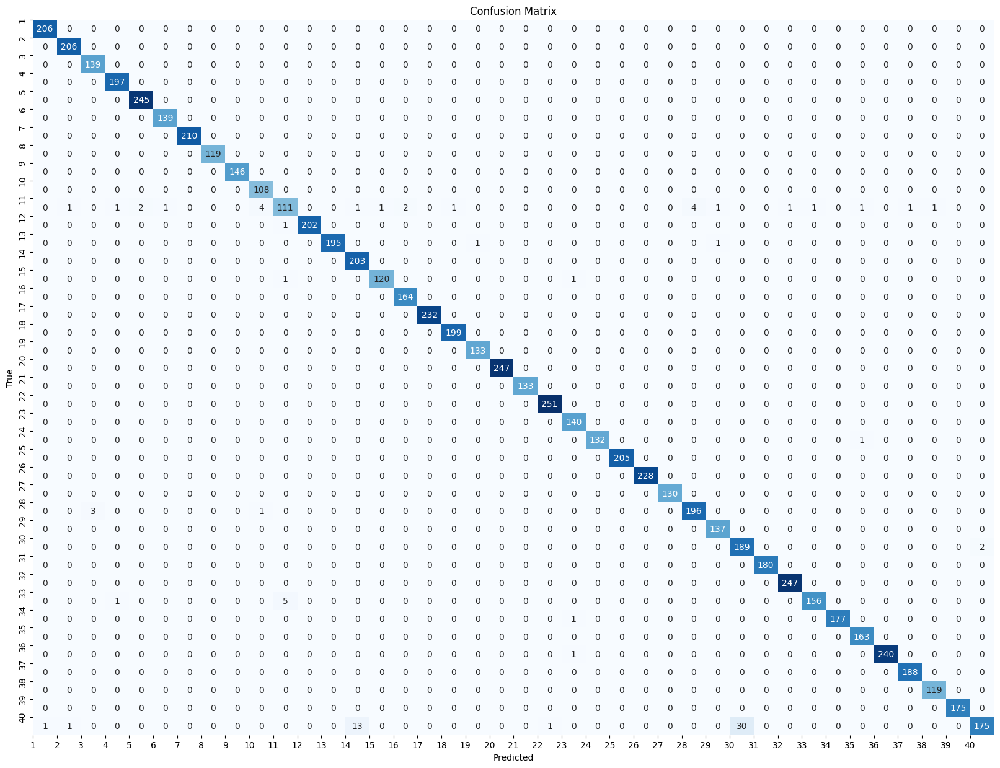

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       206
           1       0.99      1.00      1.00       206
           2       0.98      1.00      0.99       139
           3       0.99      1.00      0.99       197
           4       0.99      1.00      1.00       245
           5       0.99      1.00      1.00       139
           6       1.00      1.00      1.00       210
           7       1.00      1.00      1.00       119
           8       1.00      1.00      1.00       146
           9       0.96      1.00      0.98       108
          10       0.94      0.82      0.88       135
          11       1.00      1.00      1.00       203
          12       1.00      0.99      0.99       197
          13       0.94      1.00      0.97       203
          14       0.99      0.98      0.99       122
          15       0.99      1.00      0.99       164
          16       1.00      1.00      1.00       232
    

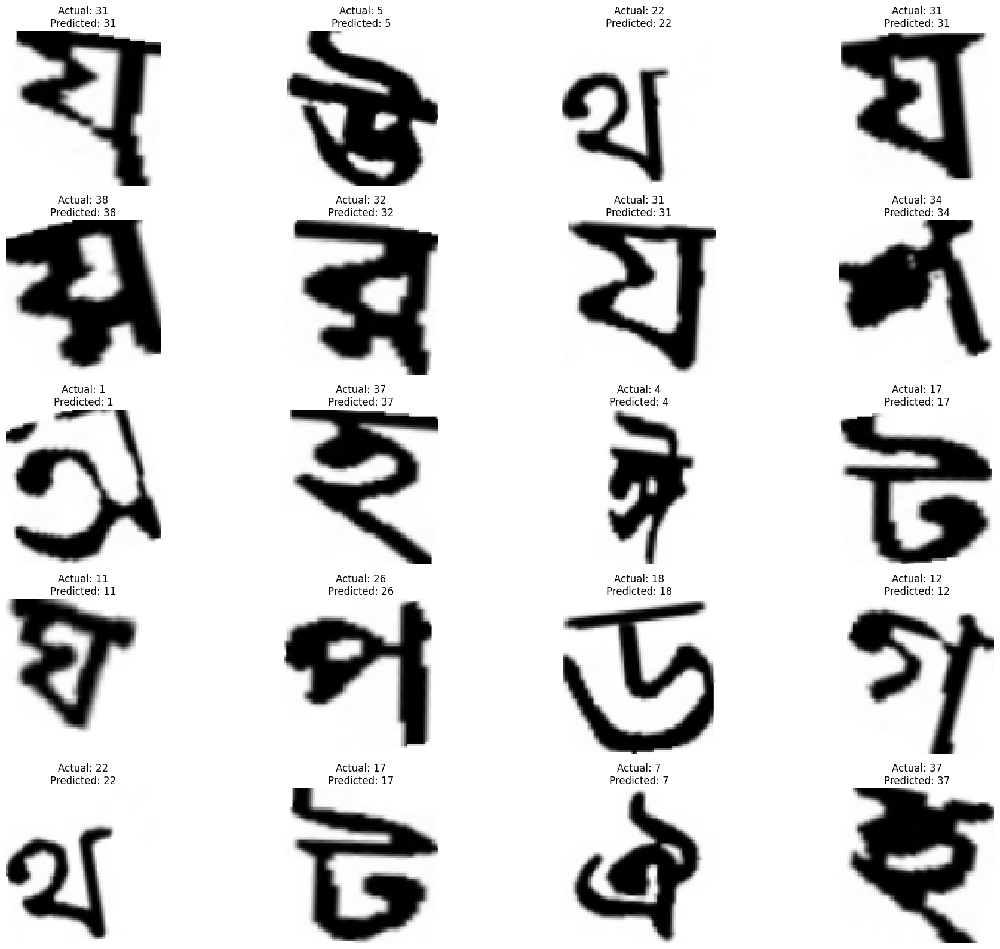

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2

def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder) - 1  
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80)) 
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=1)

num_classes = 40  
y_train_encoded = to_categorical(y_train, num_classes)
y_test_encoded = to_categorical(y_test, num_classes)

cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

base_model = VGG19(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output) 
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

merged_model = concatenate([cnn_output, vgg_output])

output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer= Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

history = model.fit([x_train, x_train], y_train_encoded,
                    batch_size=16,  
                    epochs=10,  
                    validation_split=0.2,
                    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)])

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

predictions = model.predict([x_test, x_test])
predicted_classes = np.argmax(predictions, axis=1)

f1 = f1_score(y_test, predicted_classes, average='macro')
print("F1 Score:", f1)

cm = confusion_matrix(y_test, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(num_classes), np.arange(1, num_classes + 1))  
plt.yticks(np.arange(num_classes), np.arange(1, num_classes + 1)) 
plt.show()


report = classification_report(y_test, predicted_classes)
print("Classification Report:")
print(report)

def display_sample_images_with_predictions(images, actual_labels, predicted_labels, class_names, num_samples=20, num_rows=5):
    plt.figure(figsize=(20, 16))
    for i in range(num_samples):
        plt.subplot(num_rows, num_samples // num_rows, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

class_names = [str(i) for i in range(1, 41)] 
display_sample_images_with_predictions(x_test, y_test, predicted_classes, class_names)

# adam 32

Epoch 1/10
893/893 [==============================] - 276s 308ms/step - loss: 3.7746 - accuracy: 0.9119 - val_loss: 0.4837 - val_accuracy: 0.9818
Epoch 2/10
893/893 [==============================] - 275s 308ms/step - loss: 0.4108 - accuracy: 0.9891 - val_loss: 0.4315 - val_accuracy: 0.9842
Epoch 3/10
893/893 [==============================] - 275s 308ms/step - loss: 0.3907 - accuracy: 0.9872 - val_loss: 0.4102 - val_accuracy: 0.9854
Epoch 4/10
893/893 [==============================] - 275s 308ms/step - loss: 0.3699 - accuracy: 0.9886 - val_loss: 0.3743 - val_accuracy: 0.9904
Epoch 5/10
893/893 [==============================] - 275s 308ms/step - loss: 0.3275 - accuracy: 0.9910 - val_loss: 0.3352 - val_accuracy: 0.9889
Epoch 6/10
893/893 [==============================] - 275s 308ms/step - loss: 0.2729 - accuracy: 0.9940 - val_loss: 0.3117 - val_accuracy: 0.9779
Epoch 7/10
893/893 [==============================] - 276s 309ms/step - loss: 0.2799 - accuracy: 0.9890 - val_loss: 0.3038 -

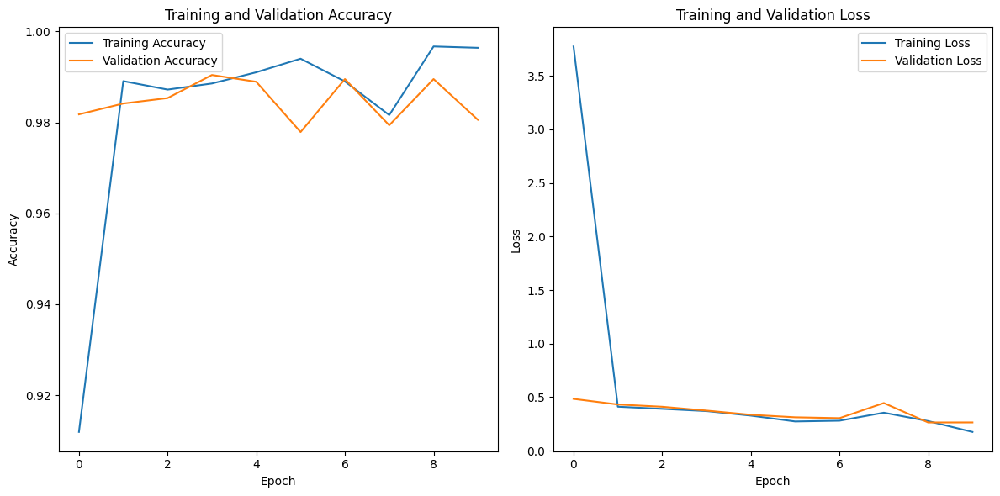

225/225 [==============================] - 109s 485ms/step
F1 Score: 0.9836761023999842


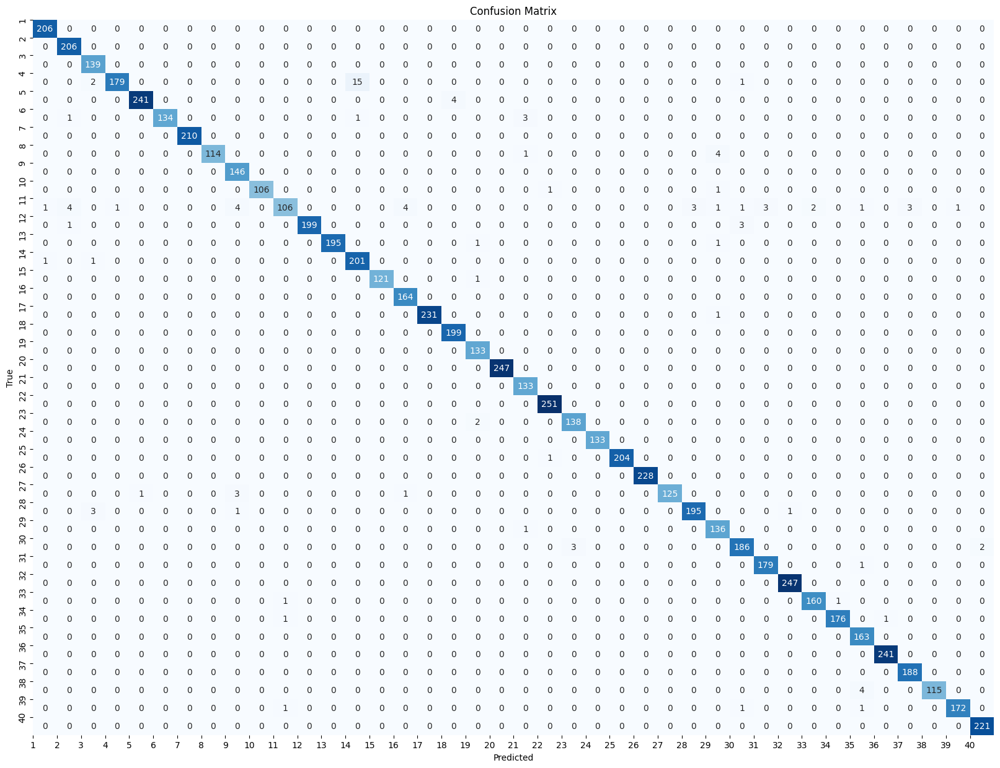

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       206
           1       0.97      1.00      0.99       206
           2       0.96      1.00      0.98       139
           3       0.99      0.91      0.95       197
           4       1.00      0.98      0.99       245
           5       1.00      0.96      0.98       139
           6       1.00      1.00      1.00       210
           7       1.00      0.96      0.98       119
           8       0.95      1.00      0.97       146
           9       1.00      0.98      0.99       108
          10       0.97      0.79      0.87       135
          11       1.00      0.98      0.99       203
          12       1.00      0.99      0.99       197
          13       0.93      0.99      0.96       203
          14       1.00      0.99      1.00       122
          15       0.97      1.00      0.98       164
          16       1.00      1.00      1.00       232
    

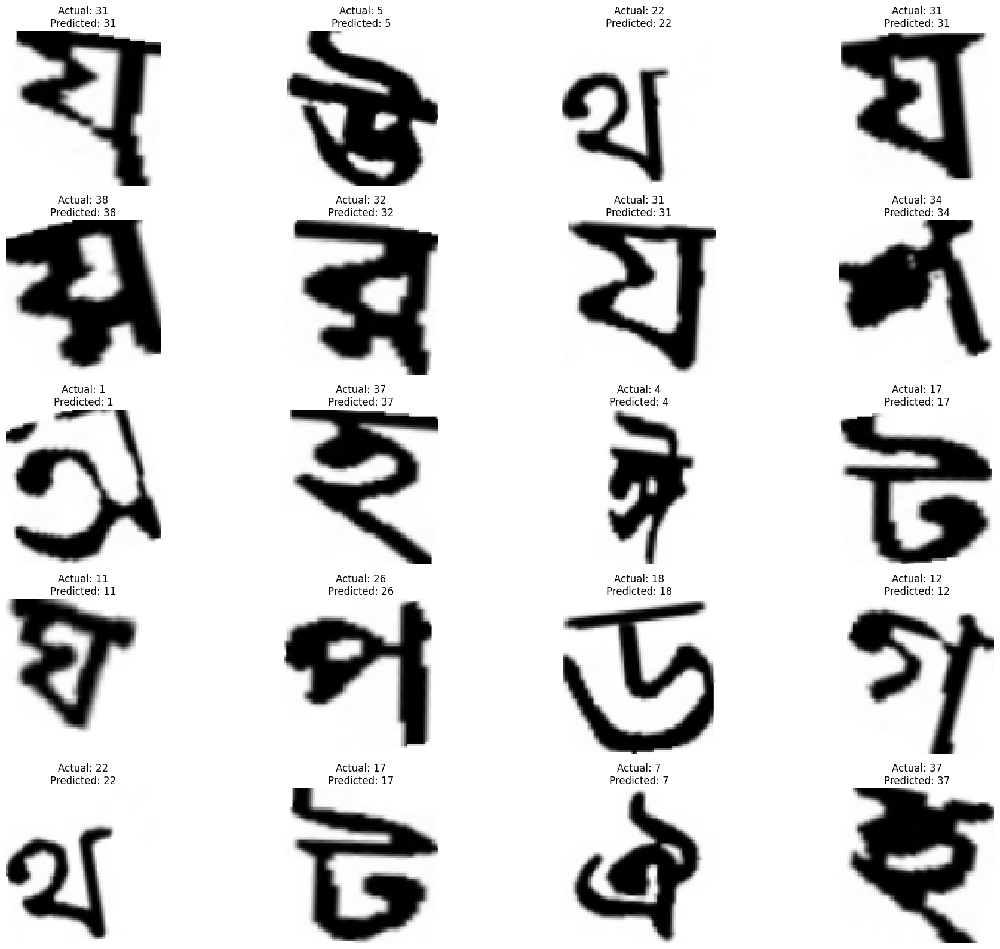

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2

def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder) - 1  
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80)) 
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=1)

num_classes = 40  
y_train_encoded = to_categorical(y_train, num_classes)
y_test_encoded = to_categorical(y_test, num_classes)

cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

base_model = VGG19(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output) 
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

merged_model = concatenate([cnn_output, vgg_output])

output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer= Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

history = model.fit([x_train, x_train], y_train_encoded,
                    batch_size=32,  
                    epochs=10,  
                    validation_split=0.2,
                    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)])

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

predictions = model.predict([x_test, x_test])
predicted_classes = np.argmax(predictions, axis=1)

f1 = f1_score(y_test, predicted_classes, average='macro')
print("F1 Score:", f1)

cm = confusion_matrix(y_test, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(num_classes), np.arange(1, num_classes + 1)) 
plt.yticks(np.arange(num_classes), np.arange(1, num_classes + 1))  
plt.show()

report = classification_report(y_test, predicted_classes)
print("Classification Report:")
print(report)
def display_sample_images_with_predictions(images, actual_labels, predicted_labels, class_names, num_samples=20, num_rows=5):
    plt.figure(figsize=(20, 16))
    for i in range(num_samples):
        plt.subplot(num_rows, num_samples // num_rows, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

class_names = [str(i) for i in range(1, 41)]  
display_sample_images_with_predictions(x_test, y_test, predicted_classes, class_names)

# adam 64

Epoch 1/10
210/210 [==============================] - 271s 1s/step - loss: 8.2839 - accuracy: 0.8565 - val_loss: 0.4858 - val_accuracy: 0.9916
Epoch 2/10
210/210 [==============================] - 270s 1s/step - loss: 0.4100 - accuracy: 0.9955 - val_loss: 0.4028 - val_accuracy: 0.9946
Epoch 3/10
210/210 [==============================] - 268s 1s/step - loss: 0.3575 - accuracy: 0.9973 - val_loss: 0.3747 - val_accuracy: 0.9901
Epoch 4/10
210/210 [==============================] - 269s 1s/step - loss: 0.3188 - accuracy: 0.9987 - val_loss: 0.3476 - val_accuracy: 0.9940
Epoch 5/10
210/210 [==============================] - 268s 1s/step - loss: 0.3030 - accuracy: 0.9954 - val_loss: 0.3753 - val_accuracy: 0.9812
Epoch 6/10
210/210 [==============================] - 268s 1s/step - loss: 0.3592 - accuracy: 0.9861 - val_loss: 0.4234 - val_accuracy: 0.9821
Epoch 7/10
210/210 [==============================] - 267s 1s/step - loss: 0.3371 - accuracy: 0.9951 - val_loss: 0.4060 - val_accuracy: 0.9806

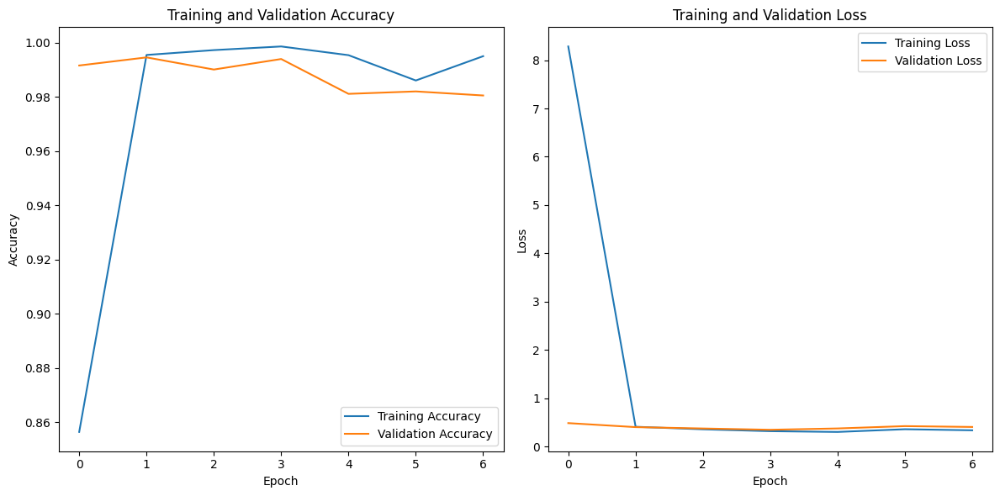

225/225 [==============================] - 108s 481ms/step
F1 Score: 0.9951044418697148


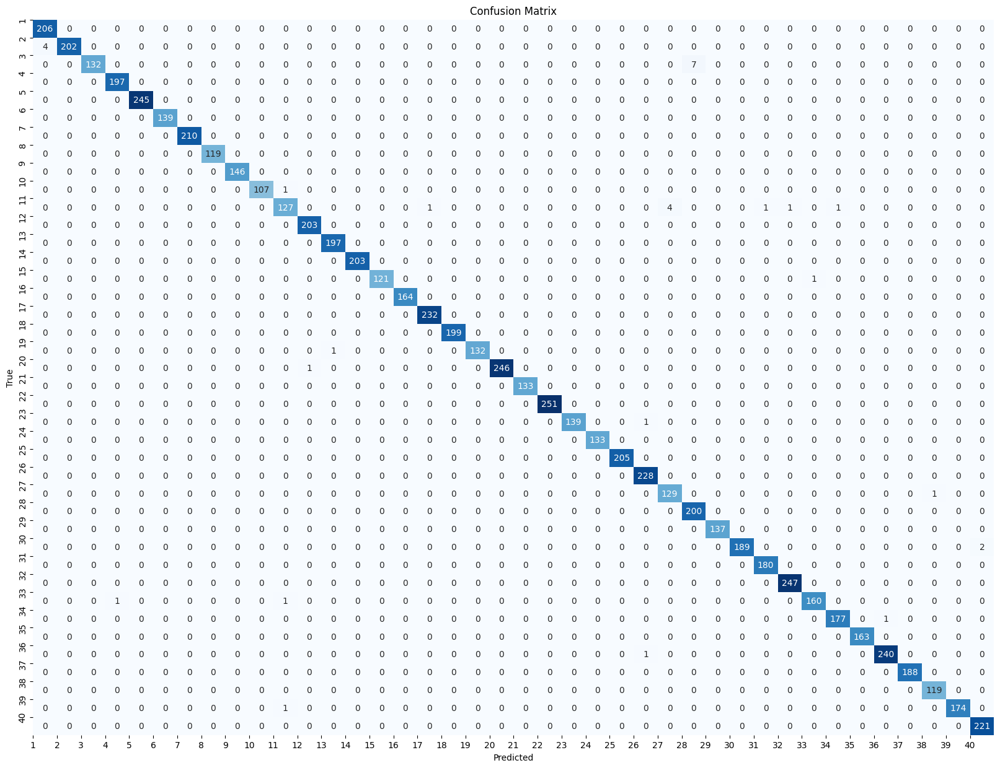

Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       206
           1       1.00      0.98      0.99       206
           2       1.00      0.95      0.97       139
           3       0.99      1.00      1.00       197
           4       1.00      1.00      1.00       245
           5       1.00      1.00      1.00       139
           6       1.00      1.00      1.00       210
           7       1.00      1.00      1.00       119
           8       1.00      1.00      1.00       146
           9       1.00      0.99      1.00       108
          10       0.98      0.94      0.96       135
          11       1.00      1.00      1.00       203
          12       0.99      1.00      1.00       197
          13       1.00      1.00      1.00       203
          14       1.00      0.99      1.00       122
          15       1.00      1.00      1.00       164
          16       1.00      1.00      1.00       232
    

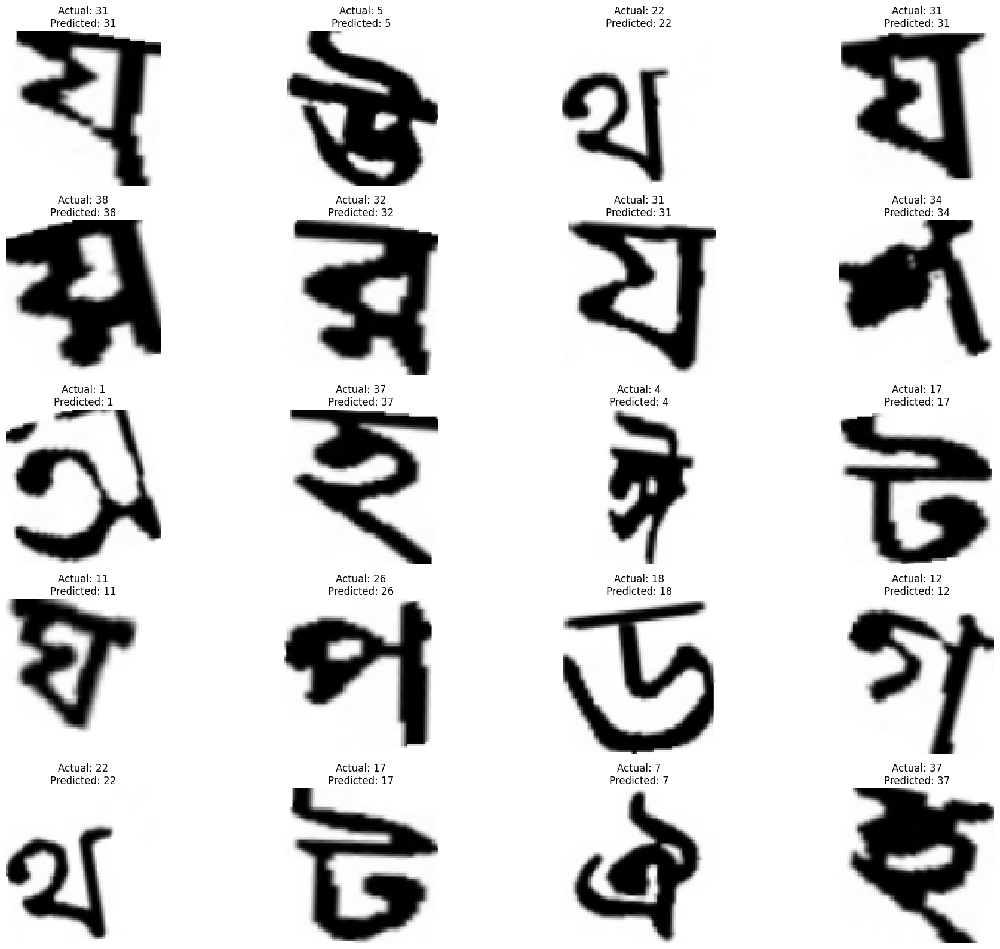

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2

def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder) - 1 
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=1)

num_classes = 40  
y_train_encoded = to_categorical(y_train, num_classes)
y_test_encoded = to_categorical(y_test, num_classes)

cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

base_model = VGG19(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

merged_model = concatenate([cnn_output, vgg_output])

output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer= Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

history = model.fit([x_train, x_train], y_train_encoded,
                    batch_size=64,  
                    epochs=10, 
                    validation_split=0.2,
                    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)])

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

predictions = model.predict([x_test, x_test])
predicted_classes = np.argmax(predictions, axis=1)

f1 = f1_score(y_test, predicted_classes, average='macro')
print("F1 Score:", f1)
cm = confusion_matrix(y_test, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(num_classes), np.arange(1, num_classes + 1)) 
plt.yticks(np.arange(num_classes), np.arange(1, num_classes + 1)) 
plt.show()

report = classification_report(y_test, predicted_classes)
print("Classification Report:")
print(report)
def display_sample_images_with_predictions(images, actual_labels, predicted_labels, class_names, num_samples=20, num_rows=5):
    plt.figure(figsize=(20, 16))
    for i in range(num_samples):
        plt.subplot(num_rows, num_samples // num_rows, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

class_names = [str(i) for i in range(1, 41)]  
display_sample_images_with_predictions(x_test, y_test, predicted_classes, class_names)

# adam 128

Epoch 1/10
105/105 [==============================] - 271s 3s/step - loss: 15.5847 - accuracy: 0.6892 - val_loss: 0.5636 - val_accuracy: 0.9812
Epoch 2/10
105/105 [==============================] - 269s 3s/step - loss: 0.4592 - accuracy: 0.9940 - val_loss: 0.4554 - val_accuracy: 0.9907
Epoch 3/10
105/105 [==============================] - 269s 3s/step - loss: 0.3874 - accuracy: 0.9978 - val_loss: 0.4104 - val_accuracy: 0.9889
Epoch 4/10
105/105 [==============================] - 269s 3s/step - loss: 0.3477 - accuracy: 0.9987 - val_loss: 0.3796 - val_accuracy: 0.9889
Epoch 5/10
105/105 [==============================] - 269s 3s/step - loss: 0.3241 - accuracy: 0.9987 - val_loss: 0.3514 - val_accuracy: 0.9937
Epoch 6/10
105/105 [==============================] - 270s 3s/step - loss: 0.3045 - accuracy: 0.9988 - val_loss: 0.3346 - val_accuracy: 0.9931
Epoch 7/10
105/105 [==============================] - 269s 3s/step - loss: 0.2863 - accuracy: 0.9992 - val_loss: 0.3316 - val_accuracy: 0.991

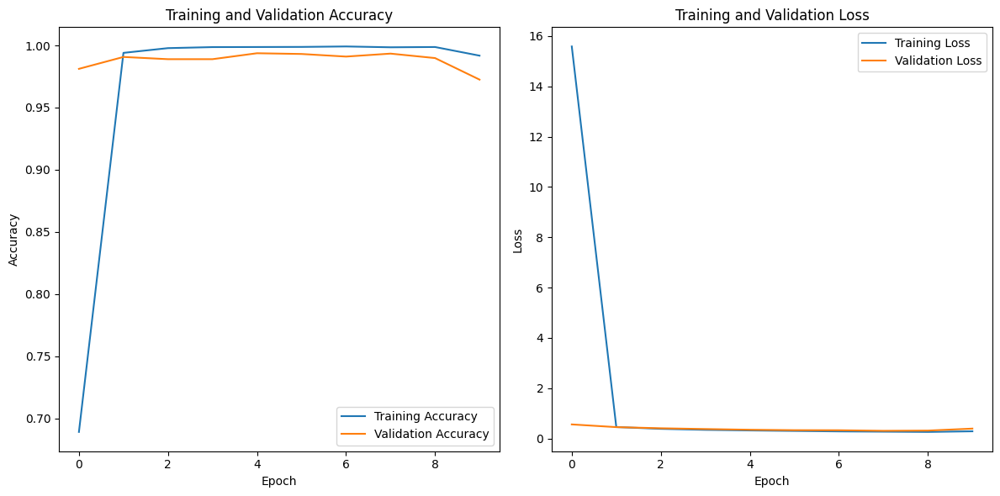

225/225 [==============================] - 109s 482ms/step
F1 Score: 0.9697856915712805


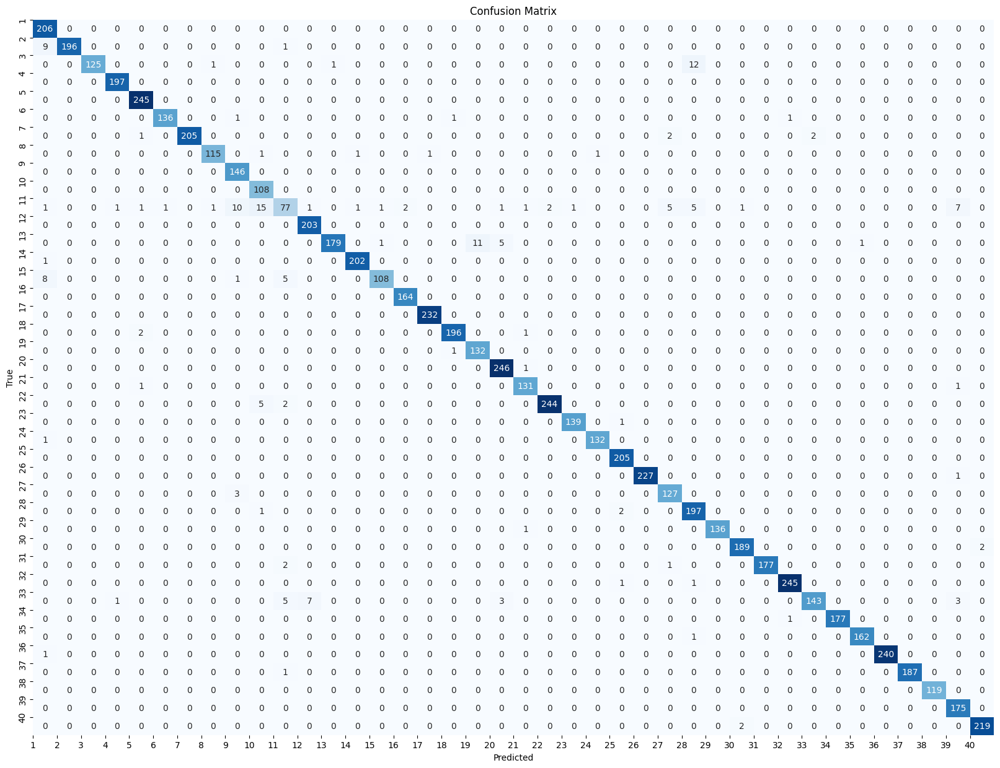

Classification Report:
              precision    recall  f1-score   support

           0       0.91      1.00      0.95       206
           1       1.00      0.95      0.98       206
           2       1.00      0.90      0.95       139
           3       0.99      1.00      0.99       197
           4       0.98      1.00      0.99       245
           5       0.99      0.98      0.99       139
           6       1.00      0.98      0.99       210
           7       0.98      0.97      0.97       119
           8       0.91      1.00      0.95       146
           9       0.83      1.00      0.91       108
          10       0.83      0.57      0.68       135
          11       0.96      1.00      0.98       203
          12       0.99      0.91      0.95       197
          13       0.99      1.00      0.99       203
          14       0.98      0.89      0.93       122
          15       0.99      1.00      0.99       164
          16       1.00      1.00      1.00       232
    

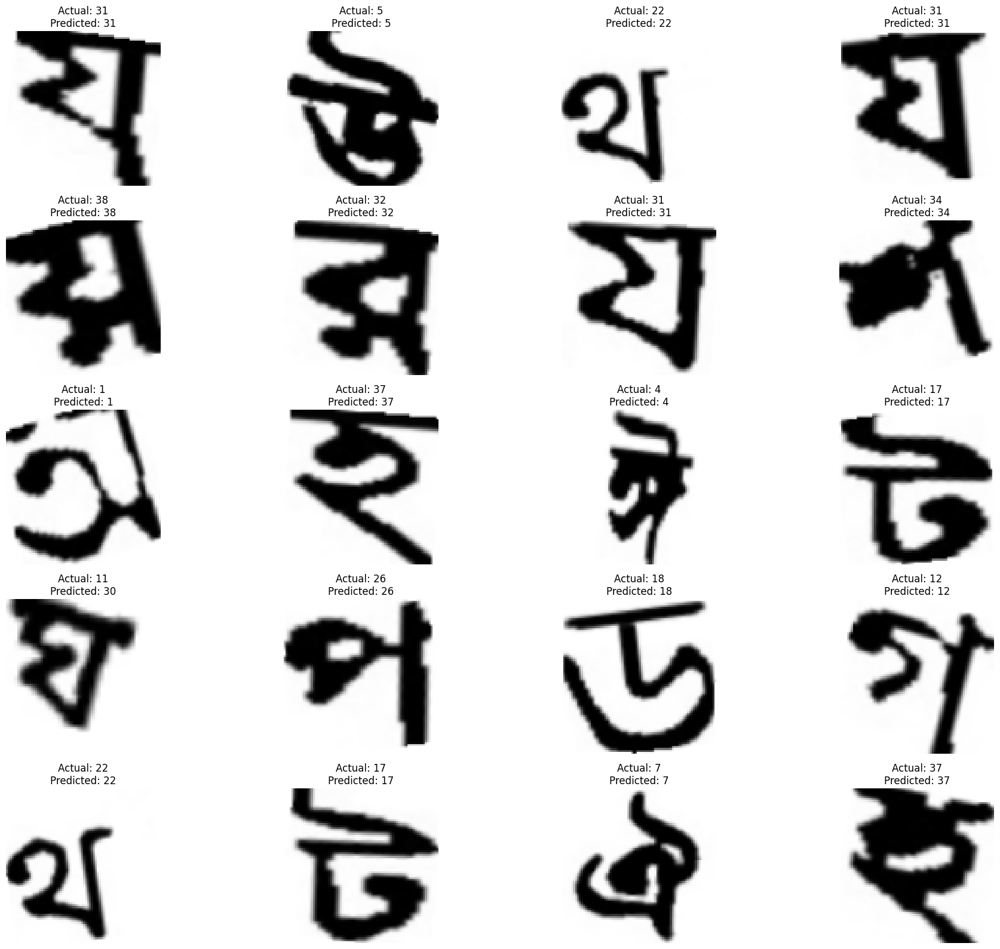

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2

def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder) - 1  
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80)) 
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=1)

num_classes = 40  
y_train_encoded = to_categorical(y_train, num_classes)
y_test_encoded = to_categorical(y_test, num_classes)

cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

base_model = VGG19(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

merged_model = concatenate([cnn_output, vgg_output])

output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer= Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

history = model.fit([x_train, x_train], y_train_encoded,
                    batch_size=128,  
                    epochs=10,  
                    validation_split=0.2,
                    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)])

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

predictions = model.predict([x_test, x_test])
predicted_classes = np.argmax(predictions, axis=1)

f1 = f1_score(y_test, predicted_classes, average='macro')
print("F1 Score:", f1)

cm = confusion_matrix(y_test, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(num_classes), np.arange(1, num_classes + 1))  
plt.yticks(np.arange(num_classes), np.arange(1, num_classes + 1)) 
plt.show()

report = classification_report(y_test, predicted_classes)
print("Classification Report:")
print(report)
def display_sample_images_with_predictions(images, actual_labels, predicted_labels, class_names, num_samples=20, num_rows=5):
    plt.figure(figsize=(20, 16))
    for i in range(num_samples):
        plt.subplot(num_rows, num_samples // num_rows, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

class_names = [str(i) for i in range(1, 41)]  
display_sample_images_with_predictions(x_test, y_test, predicted_classes, class_names)

# **SGD bt size 16**

80134624/80134624 [==============================] - 3s 0us/step
Epoch 1/10
837/837 [==============================] - 28s 27ms/step - loss: 118875889864164769792.0000 - accuracy: 0.0725 - val_loss: 117607044649618243584.0000 - val_accuracy: 0.1183
Epoch 2/10
837/837 [==============================] - 21s 25ms/step - loss: 115663240033105608704.0000 - accuracy: 0.1450 - val_loss: 113734749414544637952.0000 - val_accuracy: 0.1667
Epoch 3/10
837/837 [==============================] - 21s 25ms/step - loss: 111854822025559277568.0000 - accuracy: 0.1903 - val_loss: 109990032712665137152.0000 - val_accuracy: 0.2088
Epoch 4/10
837/837 [==============================] - 21s 25ms/step - loss: 108171968245904965632.0000 - accuracy: 0.2157 - val_loss: 106368259002957037568.0000 - val_accuracy: 0.2241
Epoch 5/10
837/837 [==============================] - 21s 25ms/step - loss: 104610421385119924224.0000 - accuracy: 0.2228 - val_loss: 102866481594257899520.0000 - val_accuracy: 0.2307
Epoch 6/10
837/

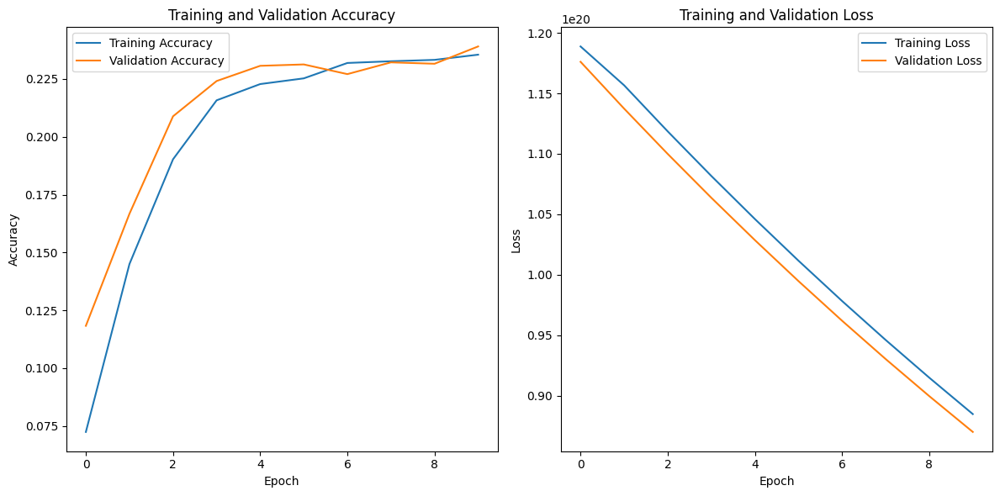

225/225 [==============================] - 8s 31ms/step
F1 Score: 0.0966914326495443


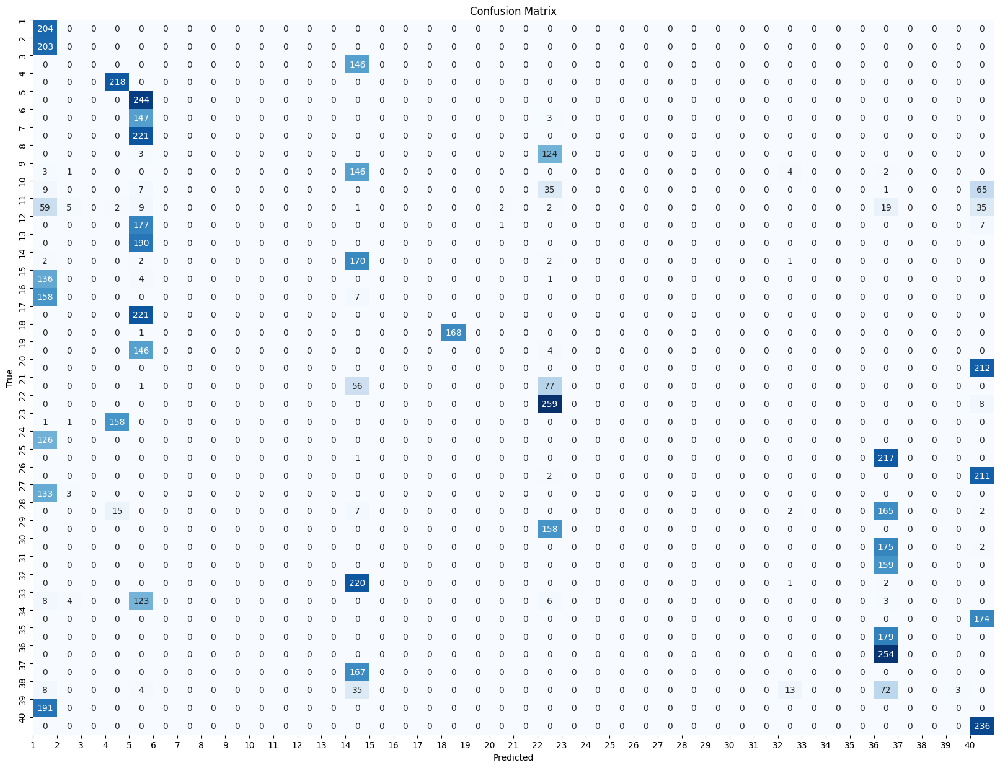

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

           0       0.16      1.00      0.28       204
           1       0.00      0.00      0.00       203
           2       0.00      0.00      0.00       146
           3       0.55      1.00      0.71       218
           4       0.16      1.00      0.28       244
           5       0.00      0.00      0.00       150
           6       0.00      0.00      0.00       221
           7       0.00      0.00      0.00       127
           8       0.00      0.00      0.00       156
           9       0.00      0.00      0.00       117
          10       0.00      0.00      0.00       134
          11       0.00      0.00      0.00       185
          12       0.00      0.00      0.00       190
          13       0.18      0.96      0.30       177
          14       0.00      0.00      0.00       141
          15       0.00      0.00      0.00       165
          16       0.00      0.00      0.00       221
    

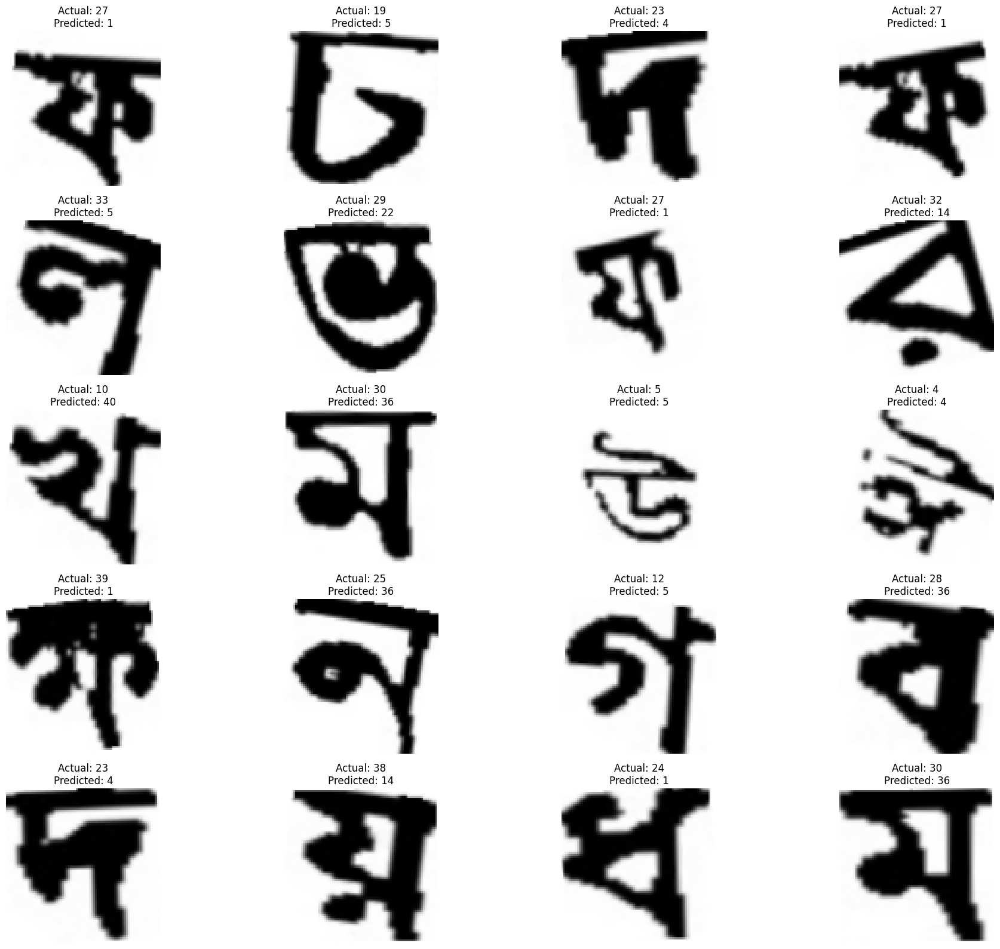

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import SGD
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2
t
def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder) - 1  
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=1)


num_classes = 40  
y_train_encoded = to_categorical(y_train, num_classes)
y_test_encoded = to_categorical(y_test, num_classes)

cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

base_model = VGG19(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

merged_model = concatenate([cnn_output, vgg_output])

output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer= SGD(), loss='categorical_crossentropy', metrics=['accuracy'])

history = model.fit([x_train, x_train], y_train_encoded,
                    batch_size=16,  
                    epochs=10,  
                    validation_split=0.2,
                    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)])

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

predictions = model.predict([x_test, x_test])
predicted_classes = np.argmax(predictions, axis=1)

f1 = f1_score(y_test, predicted_classes, average='macro')
print("F1 Score:", f1)

cm = confusion_matrix(y_test, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(num_classes), np.arange(1, num_classes + 1))  
plt.yticks(np.arange(num_classes), np.arange(1, num_classes + 1))  
plt.show()

report = classification_report(y_test, predicted_classes)
print("Classification Report:")
print(report)
def display_sample_images_with_predictions(images, actual_labels, predicted_labels, class_names, num_samples=20, num_rows=5):
    plt.figure(figsize=(20, 16))
    for i in range(num_samples):
        plt.subplot(num_rows, num_samples // num_rows, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

class_names = [str(i) for i in range(1, 41)] 
display_sample_images_with_predictions(x_test, y_test, predicted_classes, class_names)

# SGD batch size 32

Epoch 1/10
419/419 [==============================] - 20s 44ms/step - loss: nan - accuracy: 0.0296 - val_loss: nan - val_accuracy: 0.0317
Epoch 2/10
419/419 [==============================] - 17s 40ms/step - loss: nan - accuracy: 0.0299 - val_loss: nan - val_accuracy: 0.0317
Epoch 3/10
419/419 [==============================] - 17s 40ms/step - loss: nan - accuracy: 0.0299 - val_loss: nan - val_accuracy: 0.0317


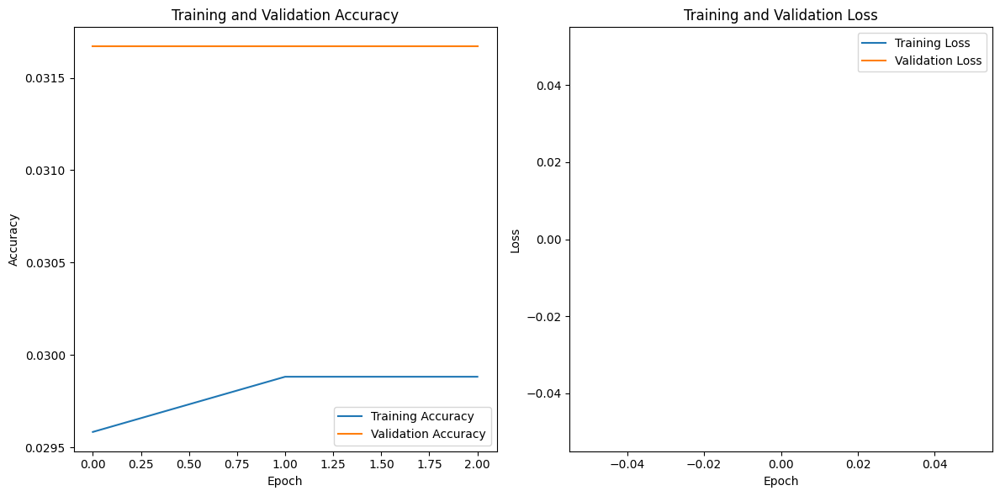

225/225 [==============================] - 6s 28ms/step
F1 Score: 0.0013828633405639913


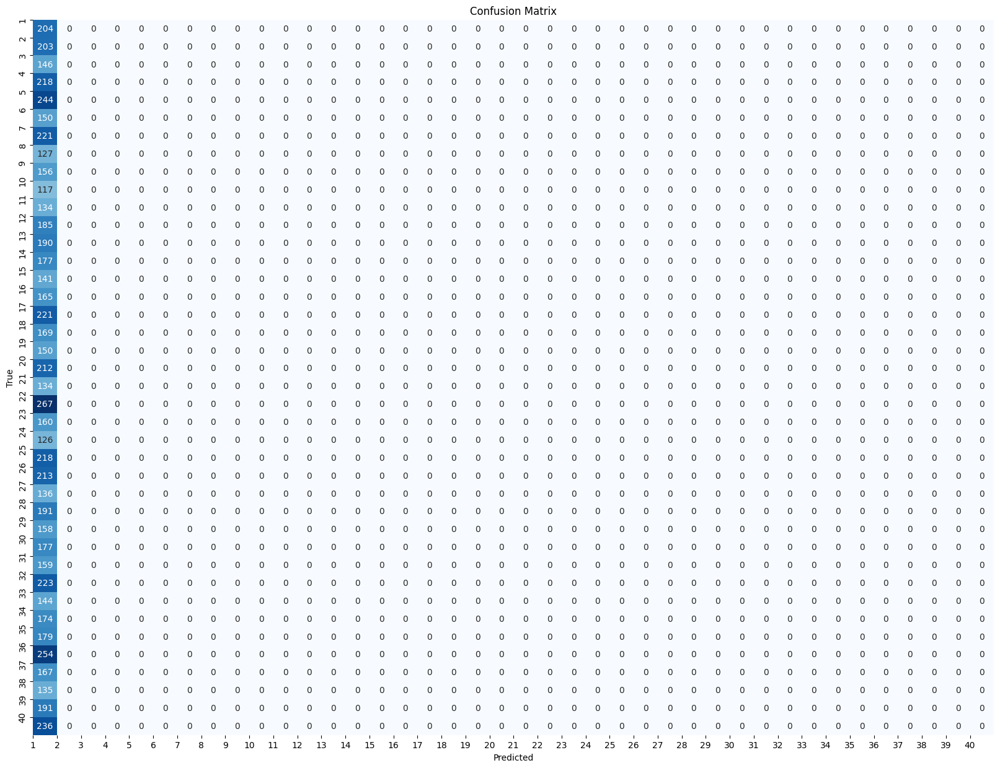

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

           0       0.03      1.00      0.06       204
           1       0.00      0.00      0.00       203
           2       0.00      0.00      0.00       146
           3       0.00      0.00      0.00       218
           4       0.00      0.00      0.00       244
           5       0.00      0.00      0.00       150
           6       0.00      0.00      0.00       221
           7       0.00      0.00      0.00       127
           8       0.00      0.00      0.00       156
           9       0.00      0.00      0.00       117
          10       0.00      0.00      0.00       134
          11       0.00      0.00      0.00       185
          12       0.00      0.00      0.00       190
          13       0.00      0.00      0.00       177
          14       0.00      0.00      0.00       141
          15       0.00      0.00      0.00       165
          16       0.00      0.00      0.00       221
    

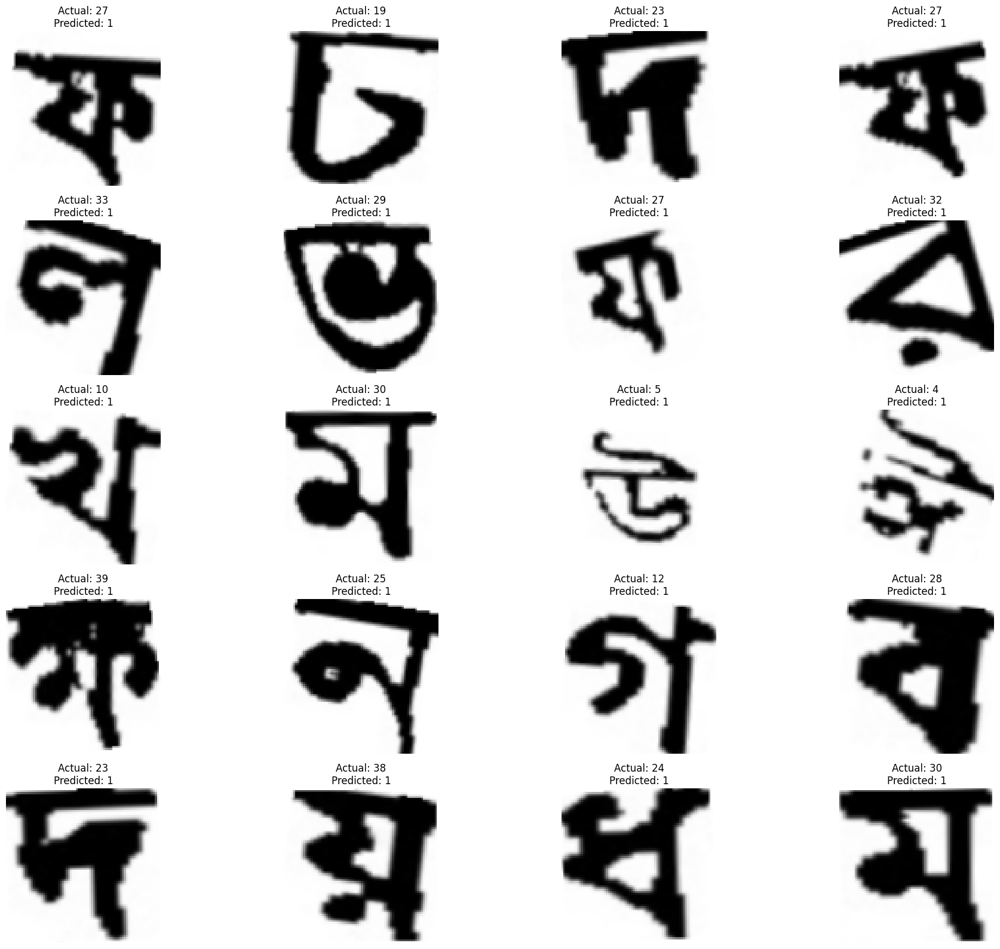

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import SGD
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2

def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder) - 1  # Adjust labels to start from 0
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  # Resize to VGG-19 input size
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=1)

num_classes = 40  
y_train_encoded = to_categorical(y_train, num_classes)
y_test_encoded = to_categorical(y_test, num_classes)

cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

base_model = VGG19(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

merged_model = concatenate([cnn_output, vgg_output])

output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer= SGD(), loss='categorical_crossentropy', metrics=['accuracy'])

history = model.fit([x_train, x_train], y_train_encoded,
                    batch_size=32,  
                    epochs=10,  
                    validation_split=0.2,
                    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)])

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

predictions = model.predict([x_test, x_test])
predicted_classes = np.argmax(predictions, axis=1)

f1 = f1_score(y_test, predicted_classes, average='macro')
print("F1 Score:", f1)

cm = confusion_matrix(y_test, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(num_classes), np.arange(1, num_classes + 1))  
plt.yticks(np.arange(num_classes), np.arange(1, num_classes + 1))  
plt.show()

report = classification_report(y_test, predicted_classes)
print("Classification Report:")
print(report)
def display_sample_images_with_predictions(images, actual_labels, predicted_labels, class_names, num_samples=20, num_rows=5):
    plt.figure(figsize=(20, 16))
    for i in range(num_samples):
        plt.subplot(num_rows, num_samples // num_rows, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

class_names = [str(i) for i in range(1, 41)]  
display_sample_images_with_predictions(x_test, y_test, predicted_classes, class_names)

# **Sgd batch size 64**

Epoch 1/10
210/210 [==============================] - 19s 73ms/step - loss: 27970.9258 - accuracy: 0.0471 - val_loss: 27885.3125 - val_accuracy: 0.0843
Epoch 2/10
210/210 [==============================] - 15s 70ms/step - loss: 27769.5527 - accuracy: 0.0940 - val_loss: 27652.0488 - val_accuracy: 0.1380
Epoch 3/10
210/210 [==============================] - 14s 68ms/step - loss: 27537.2715 - accuracy: 0.1372 - val_loss: 27420.7461 - val_accuracy: 0.1601
Epoch 4/10
210/210 [==============================] - 14s 68ms/step - loss: 27306.9297 - accuracy: 0.1556 - val_loss: 27191.3770 - val_accuracy: 0.1757
Epoch 5/10
210/210 [==============================] - 14s 68ms/step - loss: 27078.5039 - accuracy: 0.1689 - val_loss: 26963.9395 - val_accuracy: 0.1790
Epoch 6/10
210/210 [==============================] - 14s 68ms/step - loss: 26852.0020 - accuracy: 0.1794 - val_loss: 26738.3887 - val_accuracy: 0.1817
Epoch 7/10
210/210 [==============================] - 14s 69ms/step - loss: 26627.3926 -

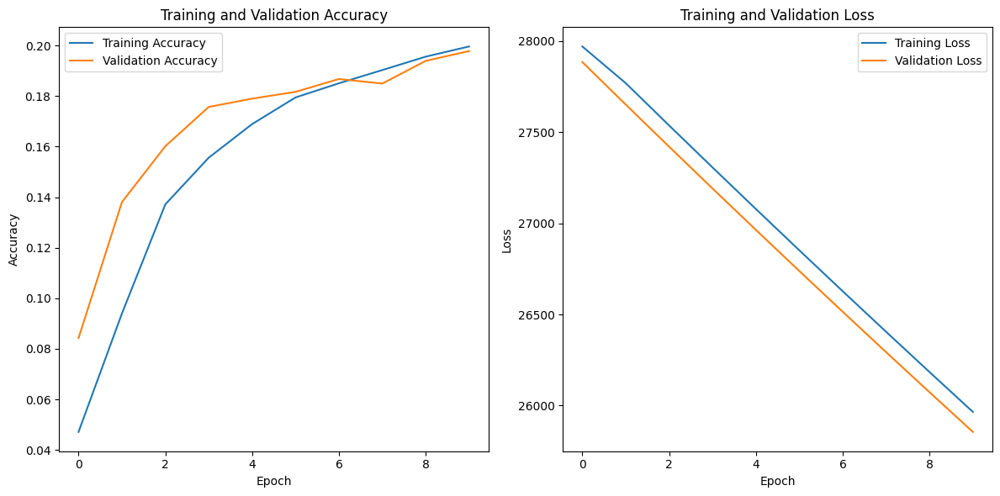

225/225 [==============================] - 6s 28ms/step
F1 Score: 0.07121586266215968


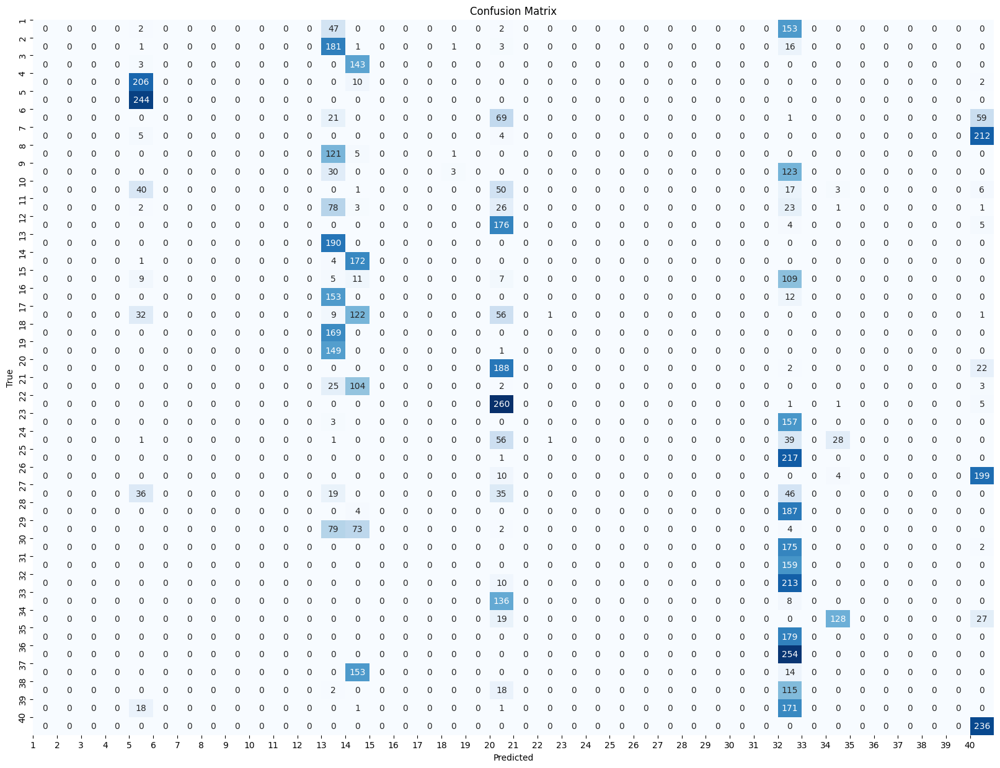

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       204
           1       0.00      0.00      0.00       203
           2       0.00      0.00      0.00       146
           3       0.00      0.00      0.00       218
           4       0.41      1.00      0.58       244
           5       0.00      0.00      0.00       150
           6       0.00      0.00      0.00       221
           7       0.00      0.00      0.00       127
           8       0.00      0.00      0.00       156
           9       0.00      0.00      0.00       117
          10       0.00      0.00      0.00       134
          11       0.00      0.00      0.00       185
          12       0.15      1.00      0.26       190
          13       0.21      0.97      0.35       177
          14       0.00      0.00      0.00       141
          15       0.00      0.00      0.00       165
          16       0.00      0.00      0.00       221
    

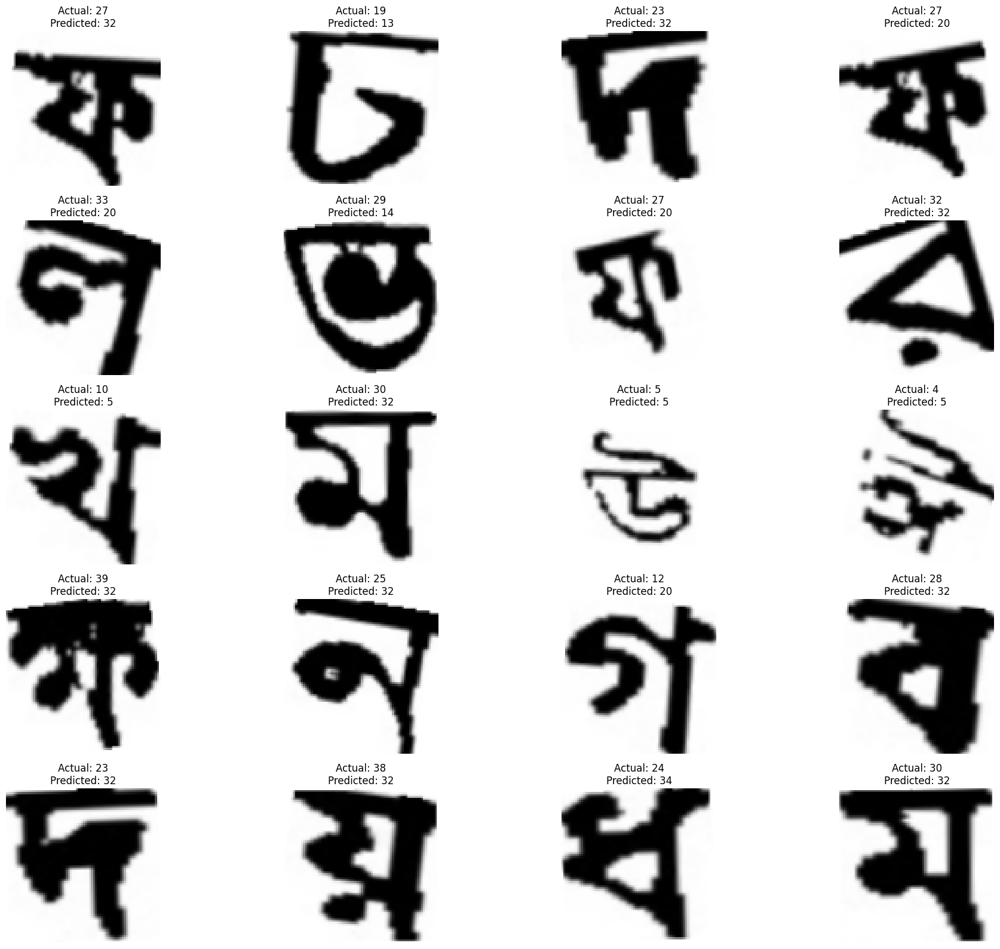

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import SGD
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2

def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder) - 1 
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=1)

num_classes = 40  
y_train_encoded = to_categorical(y_train, num_classes)
y_test_encoded = to_categorical(y_test, num_classes)

cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

base_model = VGG19(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

merged_model = concatenate([cnn_output, vgg_output])

output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer= SGD(), loss='categorical_crossentropy', metrics=['accuracy'])

history = model.fit([x_train, x_train], y_train_encoded,
                    batch_size=64,  
                    epochs=10,  
                    validation_split=0.2,
                    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)])

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

predictions = model.predict([x_test, x_test])
predicted_classes = np.argmax(predictions, axis=1)

f1 = f1_score(y_test, predicted_classes, average='macro')
print("F1 Score:", f1)

cm = confusion_matrix(y_test, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(num_classes), np.arange(1, num_classes + 1)) 
plt.yticks(np.arange(num_classes), np.arange(1, num_classes + 1))  
plt.show()

report = classification_report(y_test, predicted_classes)
print("Classification Report:")
print(report)
def display_sample_images_with_predictions(images, actual_labels, predicted_labels, class_names, num_samples=20, num_rows=5):
    plt.figure(figsize=(20, 16))
    for i in range(num_samples):
        plt.subplot(num_rows, num_samples // num_rows, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

class_names = [str(i) for i in range(1, 41)]  
display_sample_images_with_predictions(x_test, y_test, predicted_classes, class_names)

## **Sgd batch size 128**

80134624/80134624 [==============================] - 0s 0us/step
Epoch 1/10
105/105 [==============================] - 405s 4s/step - loss: 691861068568398314823619706880.0000 - accuracy: 0.0431 - val_loss: 725129724871964472825329221632.0000 - val_accuracy: 0.0729
Epoch 2/10
105/105 [==============================] - 398s 4s/step - loss: 723629750161277621676812533760.0000 - accuracy: 0.0659 - val_loss: 722090107572134665508500799488.0000 - val_accuracy: 0.0884
Epoch 3/10
105/105 [==============================] - 399s 4s/step - loss: 720595195238317450619653193728.0000 - accuracy: 0.0805 - val_loss: 719063108435547085883683373056.0000 - val_accuracy: 0.1040
Epoch 4/10
105/105 [==============================] - 401s 4s/step - loss: 717576205235284817913118195712.0000 - accuracy: 0.1194 - val_loss: 716050314177339978151668744192.0000 - val_accuracy: 0.1592
Epoch 5/10
105/105 [==============================] - 400s 4s/step - loss: 714568775585402250098066325504.0000 - accuracy: 0.1381 -

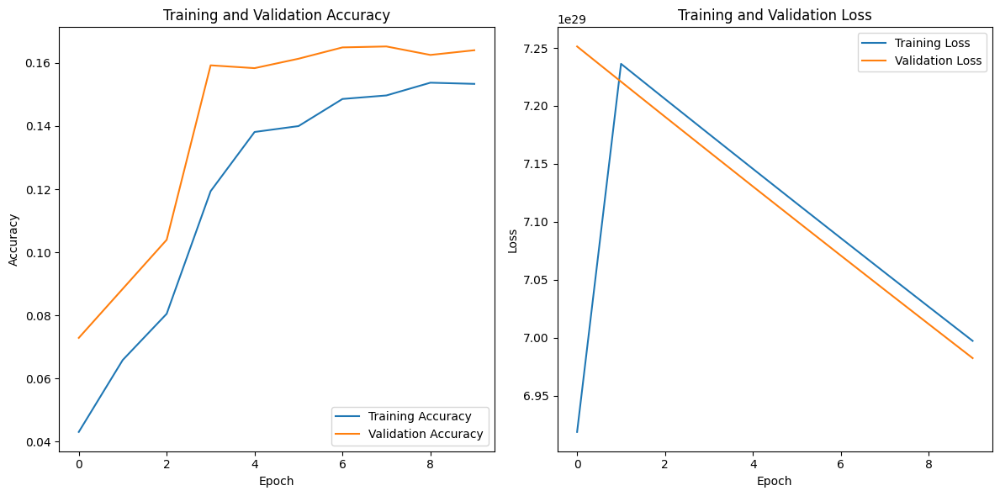

225/225 [==============================] - 160s 709ms/step
F1 Score: 0.05369120036512668


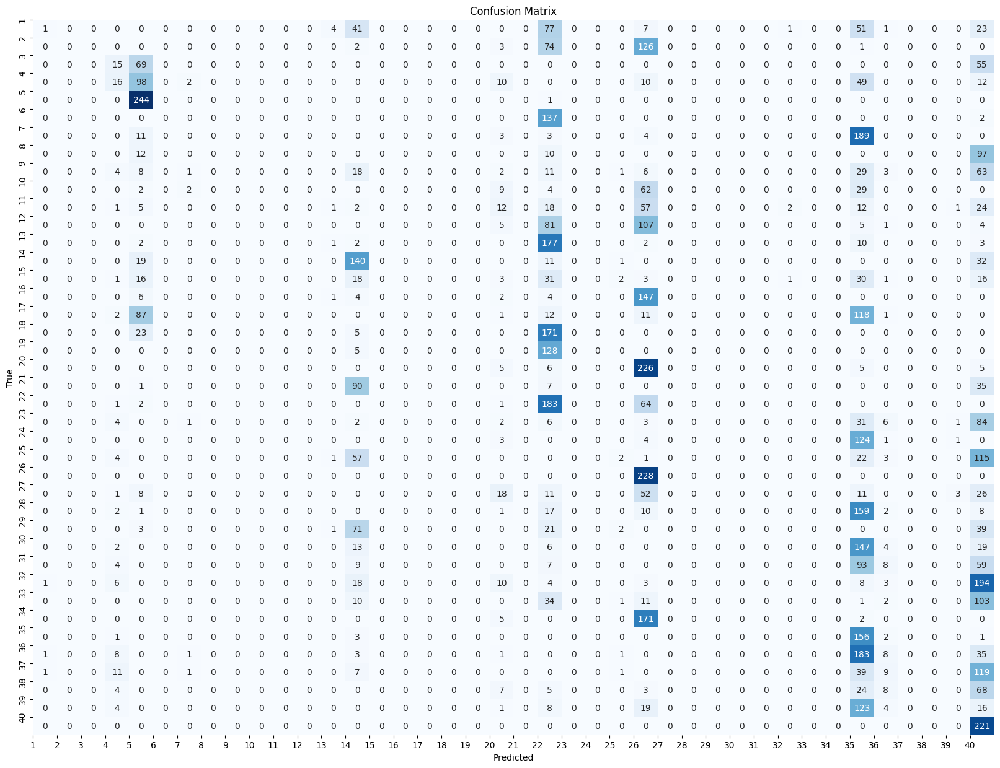

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report:
              precision    recall  f1-score   support

           0       0.25      0.00      0.01       206
           1       0.00      0.00      0.00       206
           2       0.00      0.00      0.00       139
           3       0.18      0.08      0.11       197
           4       0.40      1.00      0.57       245
           5       0.00      0.00      0.00       139
           6       0.00      0.00      0.00       210
           7       0.00      0.00      0.00       119
           8       0.00      0.00      0.00       146
           9       0.00      0.00      0.00       108
          10       0.00      0.00      0.00       135
          11       0.00      0.00      0.00       203
          12       0.11      0.01      0.01       197
          13       0.27      0.69      0.39       203
          14       0.00      0.00      0.00       122
          15       0.00      0.00      0.00       164
          16       0.00      0.00      0.00       232
    

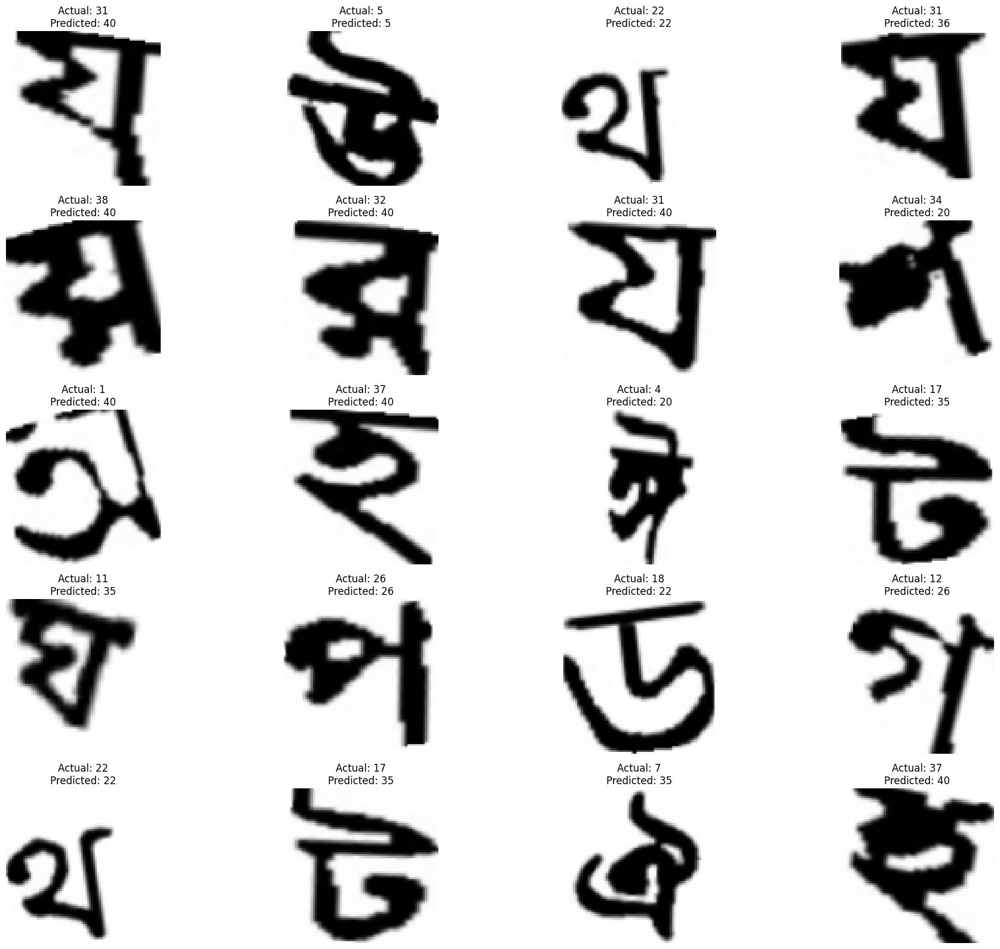

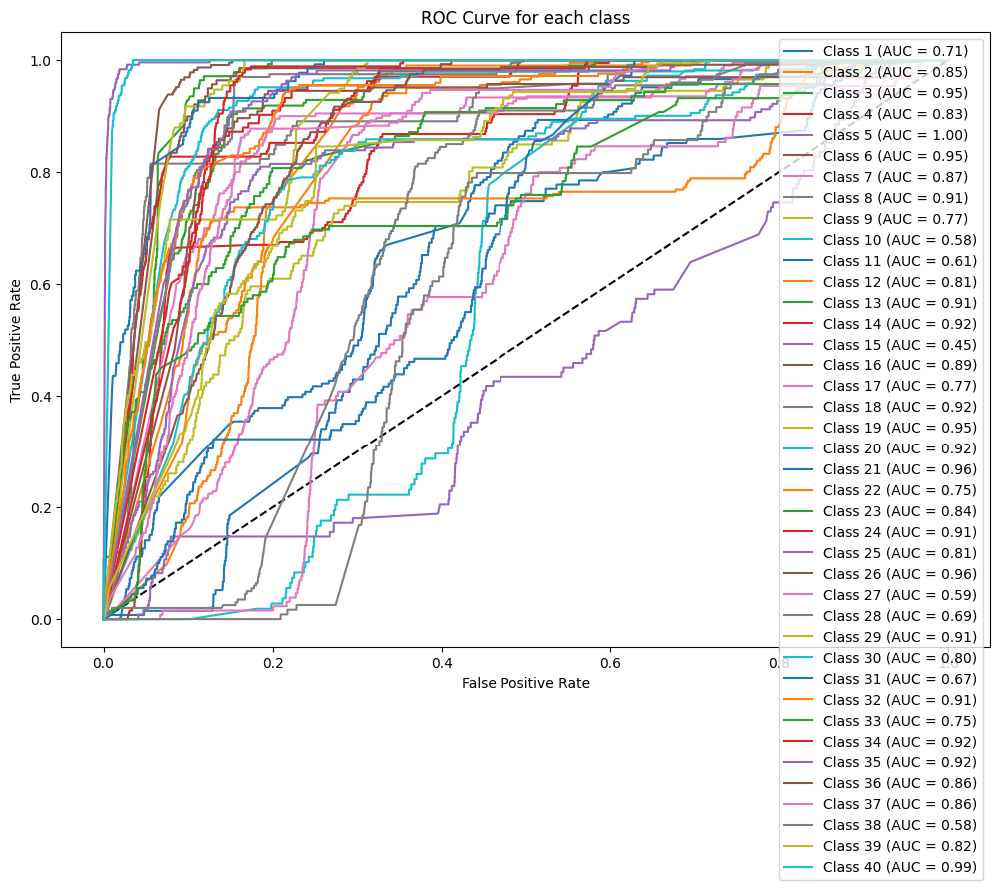

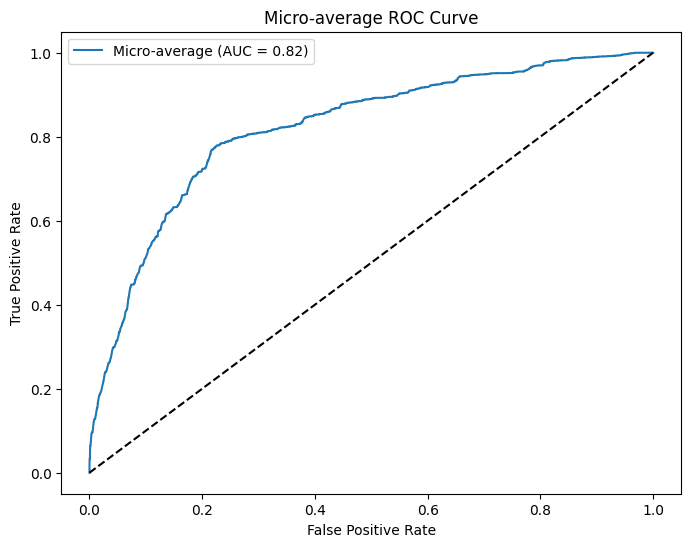

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import SGD
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2

def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder) - 1 
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=1)

num_classes = 40  
y_train_encoded = to_categorical(y_train, num_classes)
y_test_encoded = to_categorical(y_test, num_classes)

cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

base_model = VGG19(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

merged_model = concatenate([cnn_output, vgg_output])

output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer= SGD(), loss='categorical_crossentropy', metrics=['accuracy'])

history = model.fit([x_train, x_train], y_train_encoded,
                    batch_size=128, 
                    epochs=10,  
                    validation_split=0.2,
                    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)])

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

predictions = model.predict([x_test, x_test])
predicted_classes = np.argmax(predictions, axis=1)

f1 = f1_score(y_test, predicted_classes, average='macro')
print("F1 Score:", f1)

cm = confusion_matrix(y_test, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(num_classes), np.arange(1, num_classes + 1)) 
plt.yticks(np.arange(num_classes), np.arange(1, num_classes + 1)) 
plt.show()


report = classification_report(y_test, predicted_classes)
print("Classification Report:")
print(report)

def display_sample_images_with_predictions(images, actual_labels, predicted_labels, class_names, num_samples=20, num_rows=5):
    plt.figure(figsize=(20, 16))
    for i in range(num_samples):
        plt.subplot(num_rows, num_samples // num_rows, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

class_names = [str(i) for i in range(1, 41)]  
display_sample_images_with_predictions(x_test, y_test, predicted_classes, class_names)
from sklearn.metrics import roc_curve, auc


fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_encoded[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])


fpr_micro, tpr_micro, _ = roc_curve(y_test_encoded.ravel(), predictions.ravel())
roc_auc_micro = auc(fpr_micro, tpr_micro)


plt.figure(figsize=(12, 8))
plt.plot([0, 1], [0, 1], 'k--')
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i+1} (AUC = {roc_auc[i]:.2f})')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for each class')
plt.legend(loc="best")
plt.show()


plt.figure(figsize=(8, 6))
plt.plot(fpr_micro, tpr_micro, label='Micro-average (AUC = {0:0.2f})'.format(roc_auc_micro))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-average ROC Curve')
plt.legend(loc="best")
plt.show()


# Rmsprop batch size 16

Epoch 1/10
837/837 [==============================] - 24s 27ms/step - loss: 3.9868 - accuracy: 0.9068 - val_loss: 0.2523 - val_accuracy: 0.9644
Epoch 2/10
837/837 [==============================] - 22s 26ms/step - loss: 0.1610 - accuracy: 0.9813 - val_loss: 0.1342 - val_accuracy: 0.9803
Epoch 3/10
837/837 [==============================] - 21s 25ms/step - loss: 0.1108 - accuracy: 0.9883 - val_loss: 0.0921 - val_accuracy: 0.9851
Epoch 4/10
837/837 [==============================] - 21s 25ms/step - loss: 0.0877 - accuracy: 0.9880 - val_loss: 0.1320 - val_accuracy: 0.9758
Epoch 5/10
837/837 [==============================] - 21s 26ms/step - loss: 0.0812 - accuracy: 0.9892 - val_loss: 0.1054 - val_accuracy: 0.9809
Epoch 6/10
837/837 [==============================] - 22s 26ms/step - loss: 0.0791 - accuracy: 0.9892 - val_loss: 0.0686 - val_accuracy: 0.9904
Epoch 7/10
837/837 [==============================] - 21s 25ms/step - loss: 0.0727 - accuracy: 0.9907 - val_loss: 0.0693 - val_accuracy:

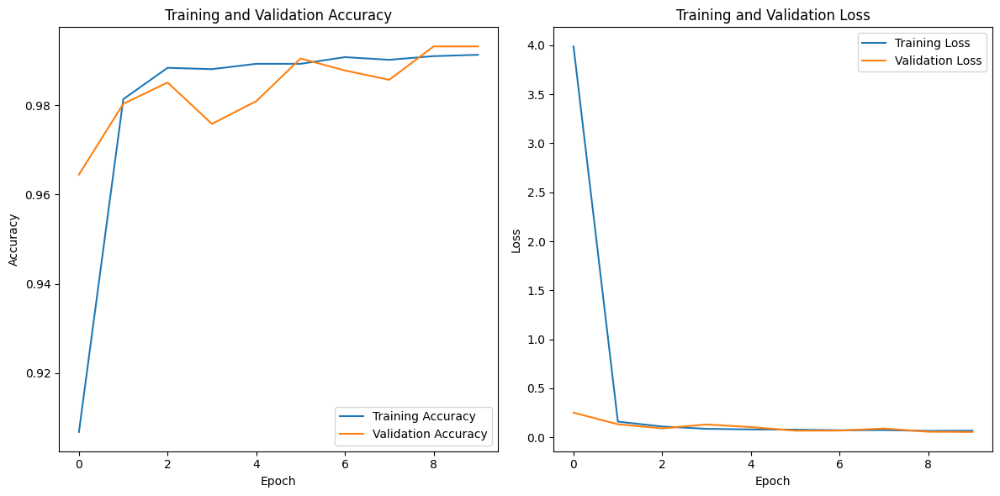

225/225 [==============================] - 7s 30ms/step
F1 Score: 0.9941085845915272


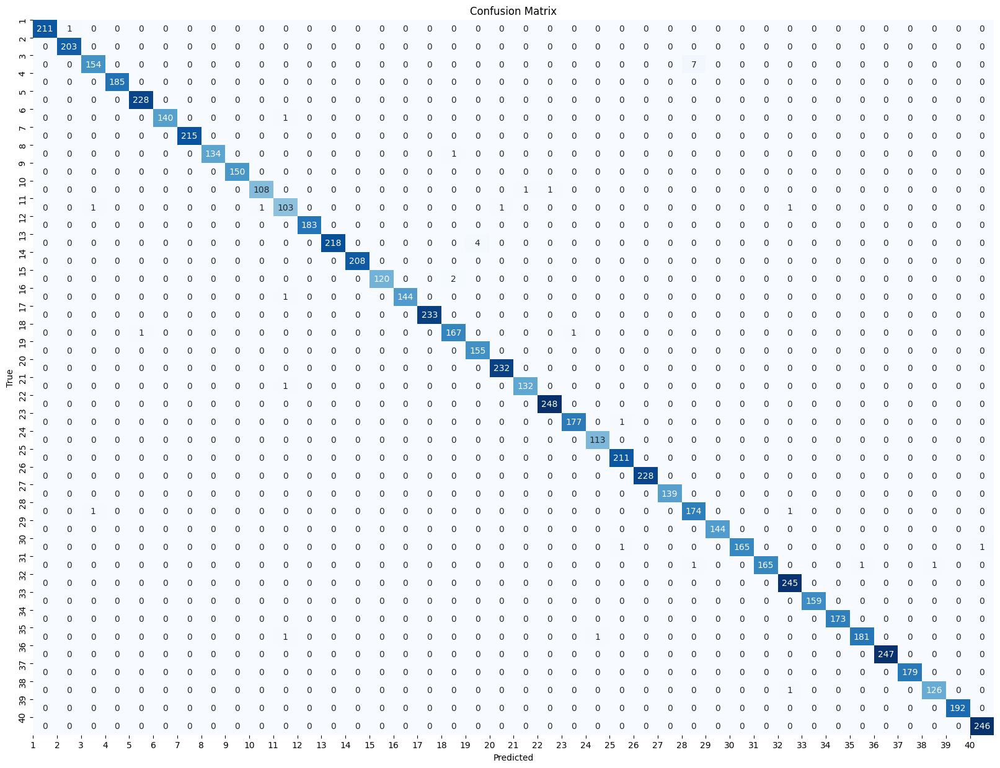

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       212
           1       1.00      1.00      1.00       203
           2       0.99      0.96      0.97       161
           3       1.00      1.00      1.00       185
           4       1.00      1.00      1.00       228
           5       1.00      0.99      1.00       141
           6       1.00      1.00      1.00       215
           7       1.00      0.99      1.00       135
           8       1.00      1.00      1.00       150
           9       0.99      0.98      0.99       110
          10       0.96      0.96      0.96       107
          11       1.00      1.00      1.00       183
          12       1.00      0.98      0.99       222
          13       1.00      1.00      1.00       208
          14       1.00      0.98      0.99       122
          15       1.00      0.99      1.00       145
          16       1.00      1.00      1.00       233
    

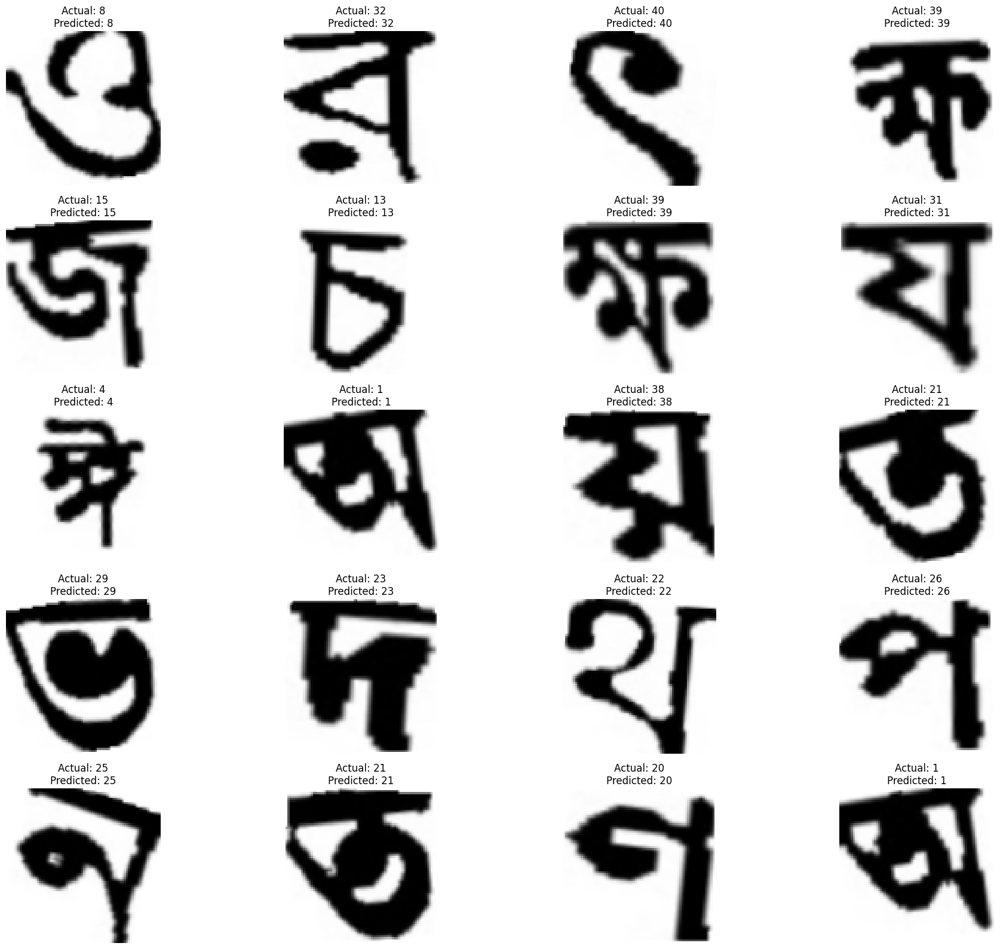

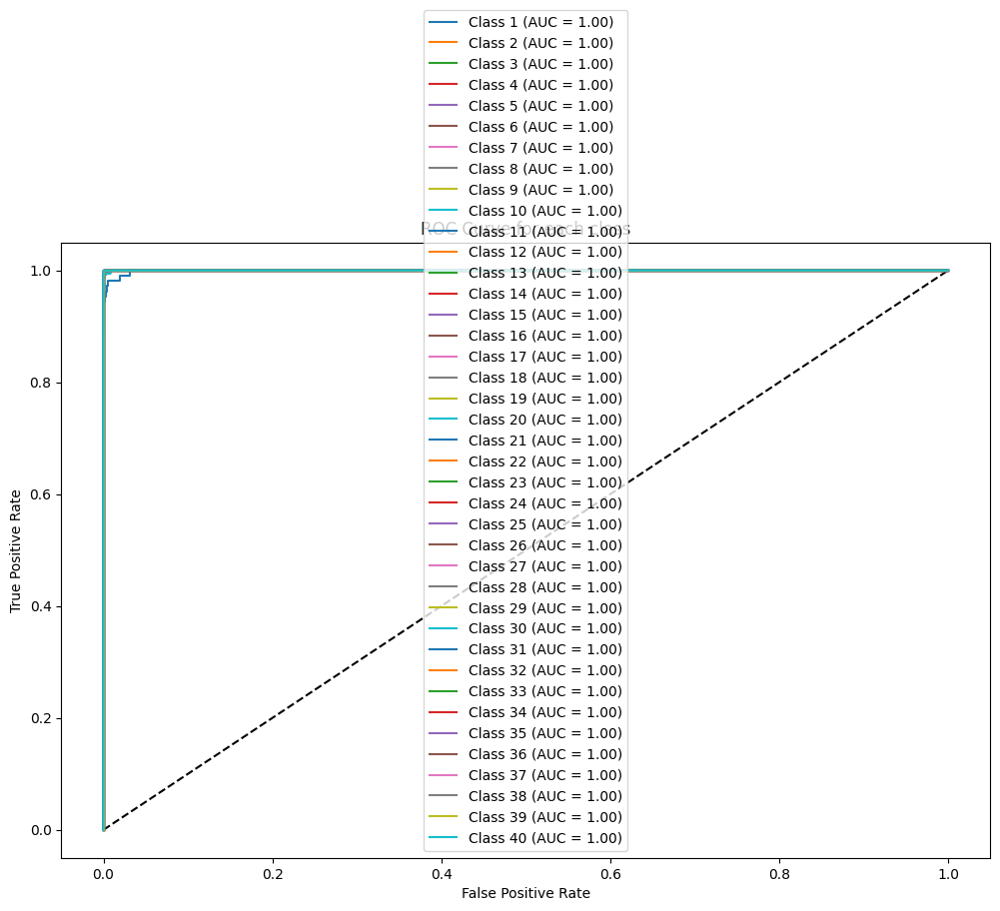

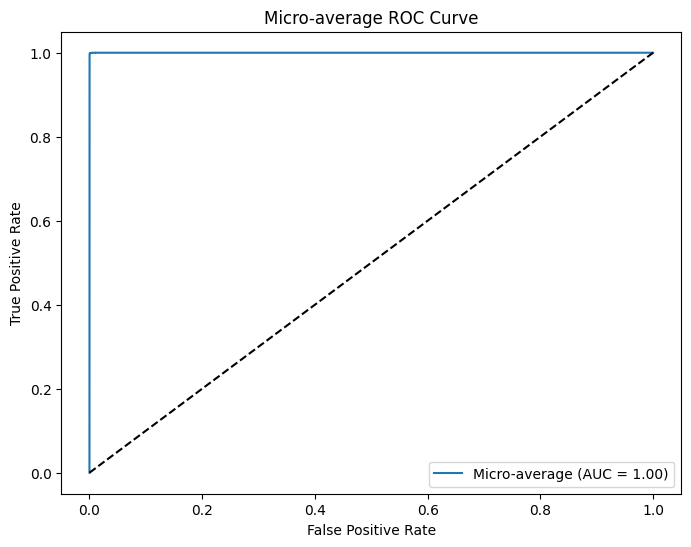

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import RMSprop
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2


def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder) - 1
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)


x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=1)


num_classes = 40  
y_train_encoded = to_categorical(y_train, num_classes)
y_test_encoded = to_categorical(y_test, num_classes)

# Define CNN model
cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

base_model = VGG19(weights='imagenet', include_top=False, input_shape=(80, 80, 3))


vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)


merged_model = concatenate([cnn_output, vgg_output])


output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)


for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer= RMSprop(), loss='categorical_crossentropy', metrics=['accuracy'])


history = model.fit([x_train, x_train], y_train_encoded,
                    batch_size=16,  
                    epochs=10,  
                    validation_split=0.2,
                    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)])


plt.figure(figsize=(12, 6))


plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


predictions = model.predict([x_test, x_test])
predicted_classes = np.argmax(predictions, axis=1)


f1 = f1_score(y_test, predicted_classes, average='macro')
print("F1 Score:", f1)


cm = confusion_matrix(y_test, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(num_classes), np.arange(1, num_classes + 1))  
plt.yticks(np.arange(num_classes), np.arange(1, num_classes + 1))  
plt.show()

report = classification_report(y_test, predicted_classes)
print("Classification Report:")
print(report)

def display_sample_images_with_predictions(images, actual_labels, predicted_labels, class_names, num_samples=20, num_rows=5):
    plt.figure(figsize=(20, 16))
    for i in range(num_samples):
        plt.subplot(num_rows, num_samples // num_rows, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()


class_names = [str(i) for i in range(1, 41)]  
display_sample_images_with_predictions(x_test, y_test, predicted_classes, class_names)
from sklearn.metrics import roc_curve, auc

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_encoded[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr_micro, tpr_micro, _ = roc_curve(y_test_encoded.ravel(), predictions.ravel())
roc_auc_micro = auc(fpr_micro, tpr_micro)

plt.figure(figsize=(12, 8))
plt.plot([0, 1], [0, 1], 'k--')
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i+1} (AUC = {roc_auc[i]:.2f})')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for each class')
plt.legend(loc="best")
plt.show()

plt.figure(figsize=(8, 6))
plt.plot(fpr_micro, tpr_micro, label='Micro-average (AUC = {0:0.2f})'.format(roc_auc_micro))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-average ROC Curve')
plt.legend(loc="best")
plt.show()


# Rmsprop 32

80134624/80134624 [==============================] - 0s 0us/step
Epoch 1/10
419/419 [==============================] - 26s 45ms/step - loss: 5.8265 - accuracy: 0.8983 - val_loss: 0.2571 - val_accuracy: 0.9788
Epoch 2/10
419/419 [==============================] - 16s 39ms/step - loss: 0.1840 - accuracy: 0.9843 - val_loss: 0.2031 - val_accuracy: 0.9767
Epoch 3/10
419/419 [==============================] - 17s 40ms/step - loss: 0.1735 - accuracy: 0.9876 - val_loss: 0.1006 - val_accuracy: 0.9913
Epoch 4/10
419/419 [==============================] - 17s 41ms/step - loss: 0.0787 - accuracy: 0.9926 - val_loss: 0.0912 - val_accuracy: 0.9913
Epoch 5/10
419/419 [==============================] - 17s 41ms/step - loss: 0.0662 - accuracy: 0.9931 - val_loss: 0.0921 - val_accuracy: 0.9904
Epoch 6/10
419/419 [==============================] - 17s 41ms/step - loss: 0.0566 - accuracy: 0.9938 - val_loss: 0.0647 - val_accuracy: 0.9946
Epoch 7/10
419/419 [==============================] - 17s 40ms/step - l

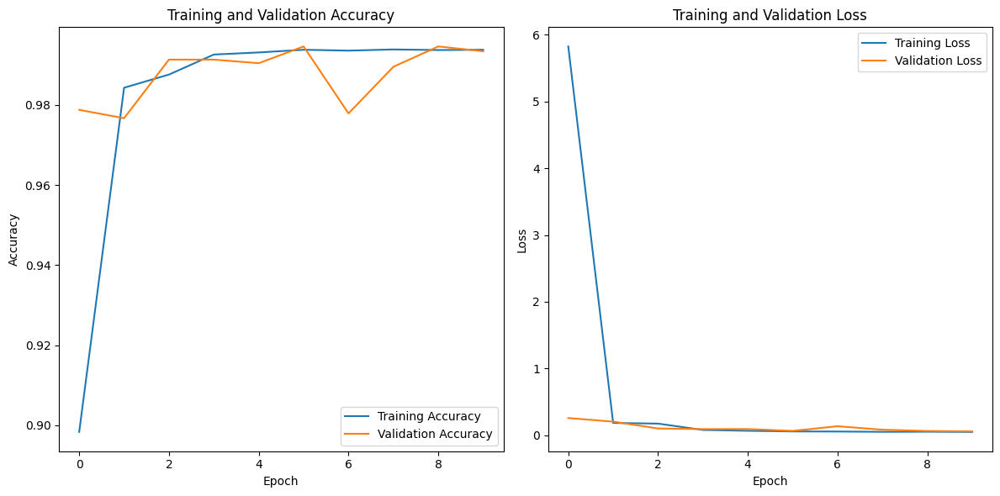

225/225 [==============================] - 7s 32ms/step
F1 Score: 0.9911104569027737


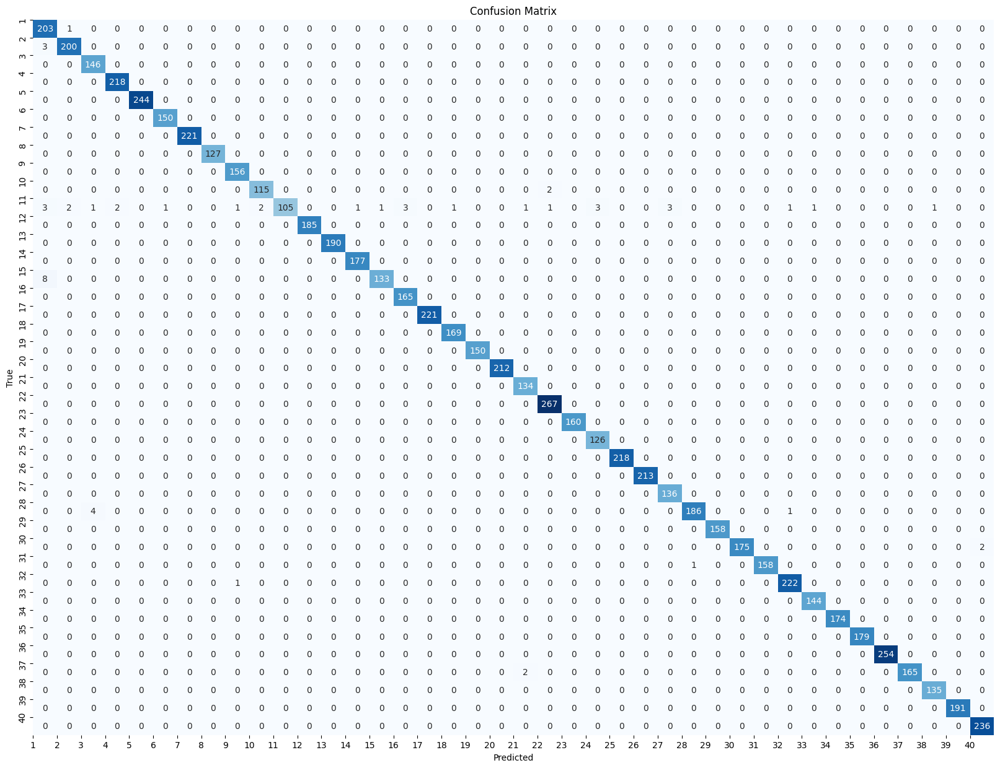

Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.96       204
           1       0.99      0.99      0.99       203
           2       0.97      1.00      0.98       146
           3       0.99      1.00      1.00       218
           4       1.00      1.00      1.00       244
           5       0.99      1.00      1.00       150
           6       1.00      1.00      1.00       221
           7       1.00      1.00      1.00       127
           8       0.99      1.00      0.99       156
           9       0.98      0.98      0.98       117
          10       1.00      0.78      0.88       134
          11       1.00      1.00      1.00       185
          12       1.00      1.00      1.00       190
          13       0.99      1.00      1.00       177
          14       0.99      0.94      0.97       141
          15       0.98      1.00      0.99       165
          16       1.00      1.00      1.00       221
    

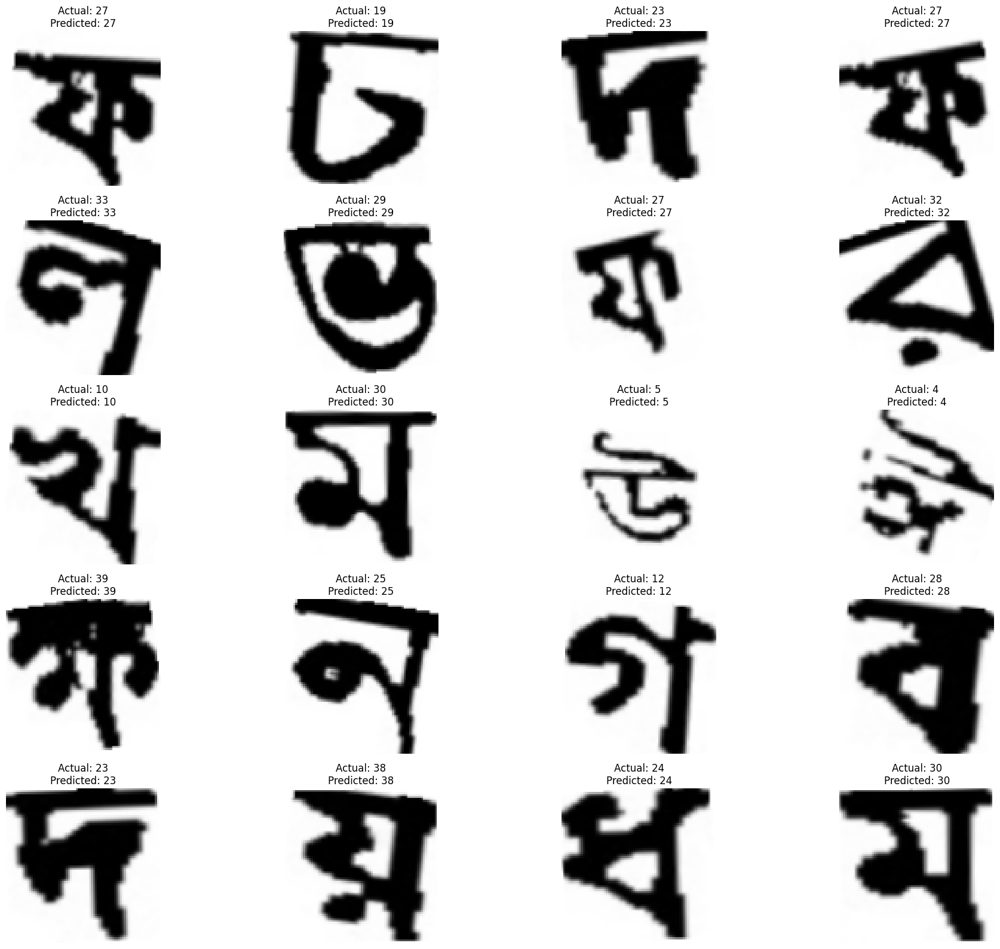

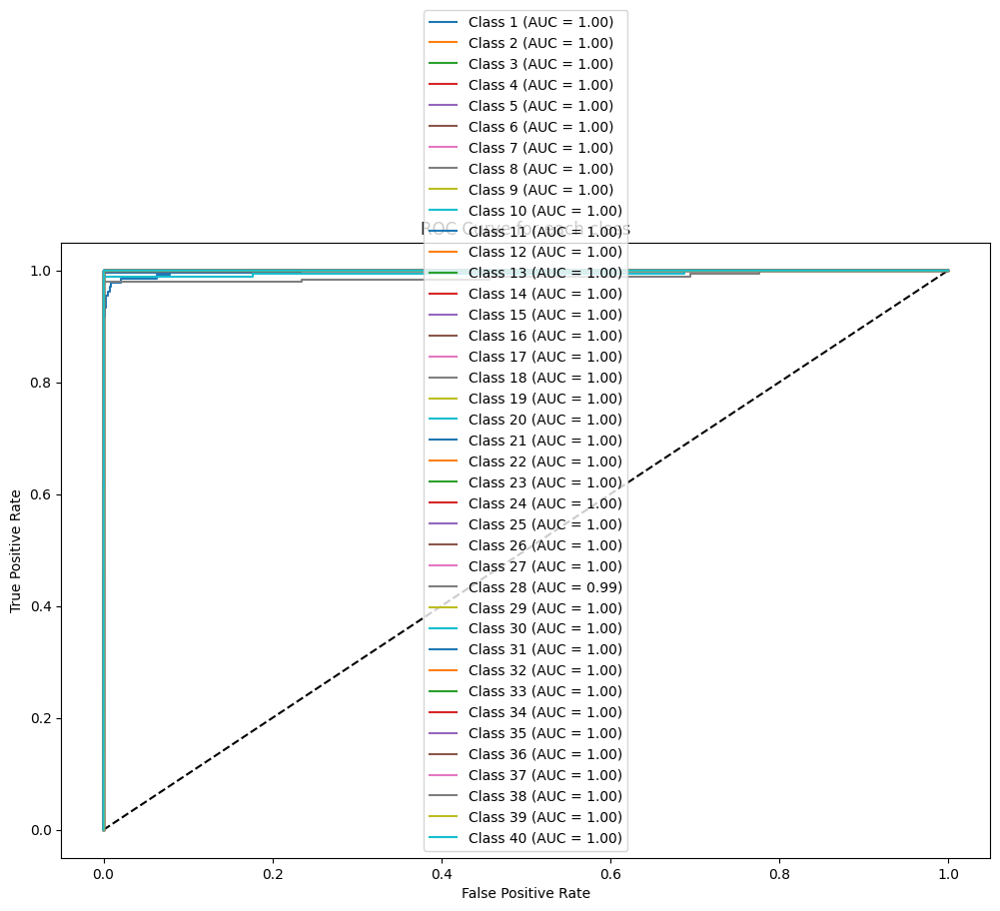

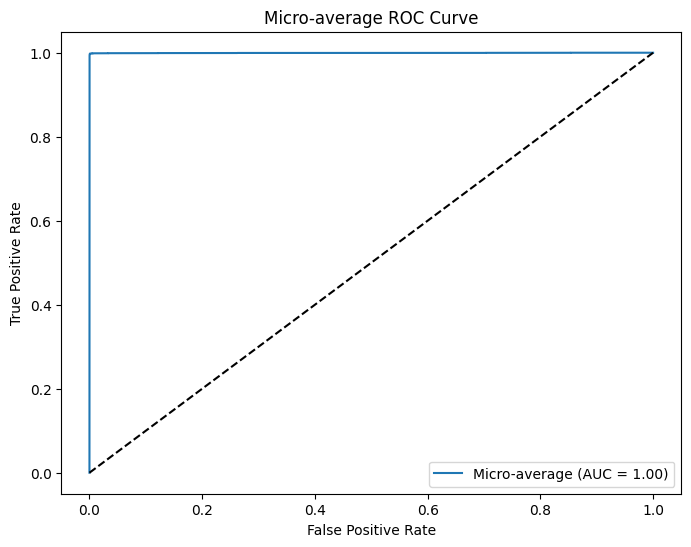

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import RMSprop
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2

def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder) - 1  
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels


dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=1)

num_classes = 40  
y_train_encoded = to_categorical(y_train, num_classes)
y_test_encoded = to_categorical(y_test, num_classes)

cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

base_model = VGG19(weights='imagenet', include_top=False, input_shape=(80, 80, 3))


vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)


merged_model = concatenate([cnn_output, vgg_output])

output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer= RMSprop(), loss='categorical_crossentropy', metrics=['accuracy'])


history = model.fit([x_train, x_train], y_train_encoded,
                    batch_size=32,  
                    epochs=10,  
                    validation_split=0.2,
                    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)])


plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
 
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

predictions = model.predict([x_test, x_test])
predicted_classes = np.argmax(predictions, axis=1)


f1 = f1_score(y_test, predicted_classes, average='macro')
print("F1 Score:", f1)

cm = confusion_matrix(y_test, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(num_classes), np.arange(1, num_classes + 1))  
plt.yticks(np.arange(num_classes), np.arange(1, num_classes + 1))  
plt.show()

report = classification_report(y_test, predicted_classes)
print("Classification Report:")
print(report)

def display_sample_images_with_predictions(images, actual_labels, predicted_labels, class_names, num_samples=20, num_rows=5):
    plt.figure(figsize=(20, 16))
    for i in range(num_samples):
        plt.subplot(num_rows, num_samples // num_rows, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()


class_names = [str(i) for i in range(1, 41)]  
display_sample_images_with_predictions(x_test, y_test, predicted_classes, class_names)
from sklearn.metrics import roc_curve, auc

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_encoded[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])


fpr_micro, tpr_micro, _ = roc_curve(y_test_encoded.ravel(), predictions.ravel())
roc_auc_micro = auc(fpr_micro, tpr_micro)


plt.figure(figsize=(12, 8))
plt.plot([0, 1], [0, 1], 'k--')
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i+1} (AUC = {roc_auc[i]:.2f})')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for each class')
plt.legend(loc="best")
plt.show()


plt.figure(figsize=(8, 6))
plt.plot(fpr_micro, tpr_micro, label='Micro-average (AUC = {0:0.2f})'.format(roc_auc_micro))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-average ROC Curve')
plt.legend(loc="best")
plt.show()


# Rmsprop 64

Epoch 1/10
210/210 [==============================] - 20s 74ms/step - loss: 11.0224 - accuracy: 0.8487 - val_loss: 0.4827 - val_accuracy: 0.9618
Epoch 2/10
210/210 [==============================] - 16s 74ms/step - loss: 0.2379 - accuracy: 0.9862 - val_loss: 0.1514 - val_accuracy: 0.9922
Epoch 3/10
210/210 [==============================] - 15s 71ms/step - loss: 0.1229 - accuracy: 0.9924 - val_loss: 0.1334 - val_accuracy: 0.9863
Epoch 4/10
210/210 [==============================] - 15s 69ms/step - loss: 0.0868 - accuracy: 0.9940 - val_loss: 0.0953 - val_accuracy: 0.9919
Epoch 5/10
210/210 [==============================] - 14s 69ms/step - loss: 0.0726 - accuracy: 0.9948 - val_loss: 0.1153 - val_accuracy: 0.9872
Epoch 6/10
210/210 [==============================] - 14s 69ms/step - loss: 0.0597 - accuracy: 0.9954 - val_loss: 0.0751 - val_accuracy: 0.9928
Epoch 7/10
210/210 [==============================] - 15s 70ms/step - loss: 0.0509 - accuracy: 0.9961 - val_loss: 0.0738 - val_accuracy

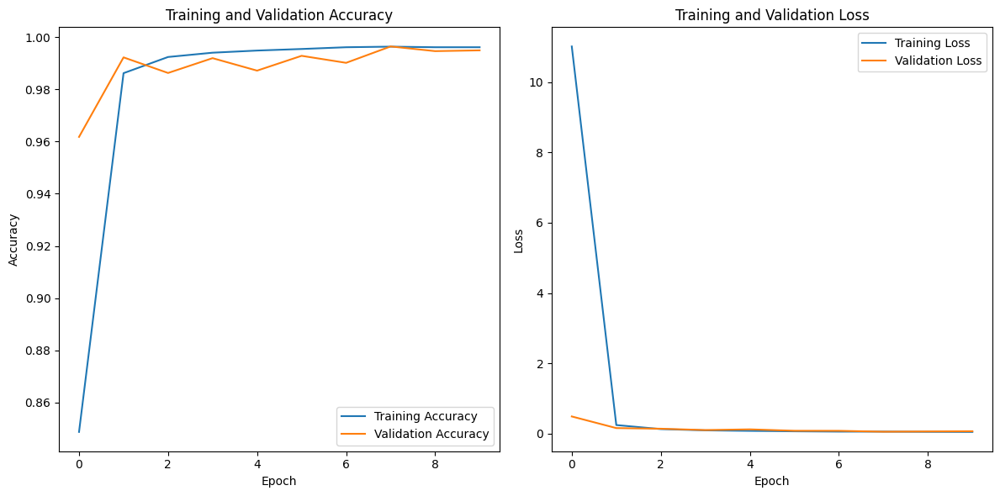

225/225 [==============================] - 7s 29ms/step
F1 Score: 0.9934745088029885


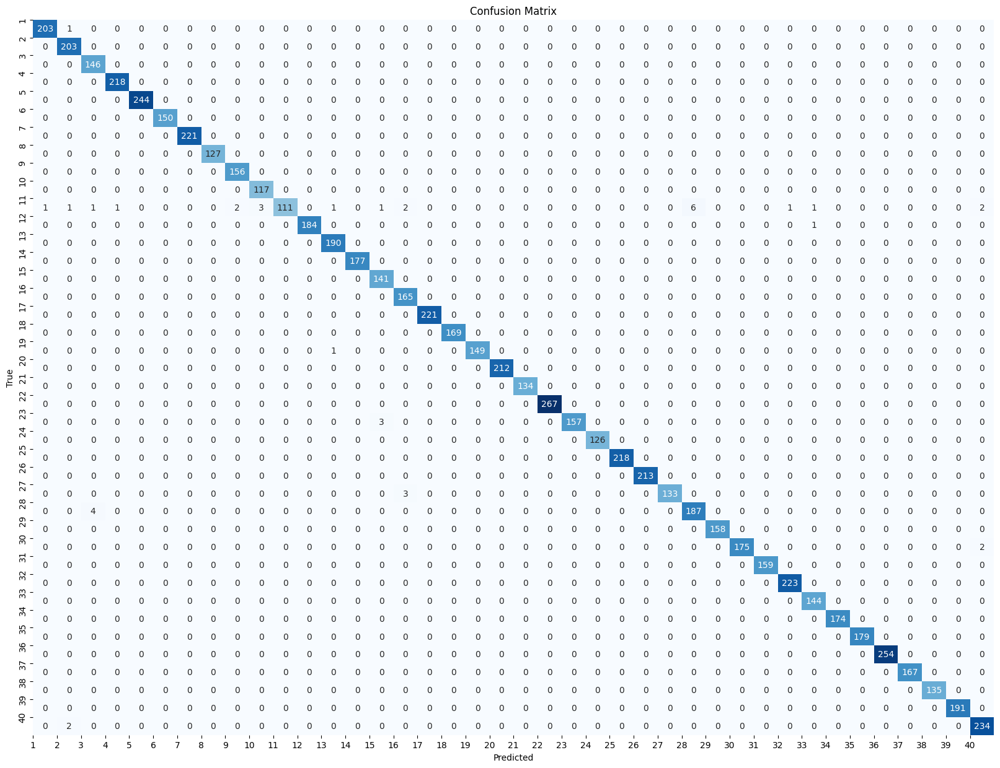

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       204
           1       0.98      1.00      0.99       203
           2       0.97      1.00      0.98       146
           3       1.00      1.00      1.00       218
           4       1.00      1.00      1.00       244
           5       1.00      1.00      1.00       150
           6       1.00      1.00      1.00       221
           7       1.00      1.00      1.00       127
           8       0.99      1.00      0.99       156
           9       0.97      1.00      0.99       117
          10       1.00      0.83      0.91       134
          11       1.00      0.99      1.00       185
          12       0.99      1.00      0.99       190
          13       1.00      1.00      1.00       177
          14       0.97      1.00      0.99       141
          15       0.97      1.00      0.99       165
          16       1.00      1.00      1.00       221
    

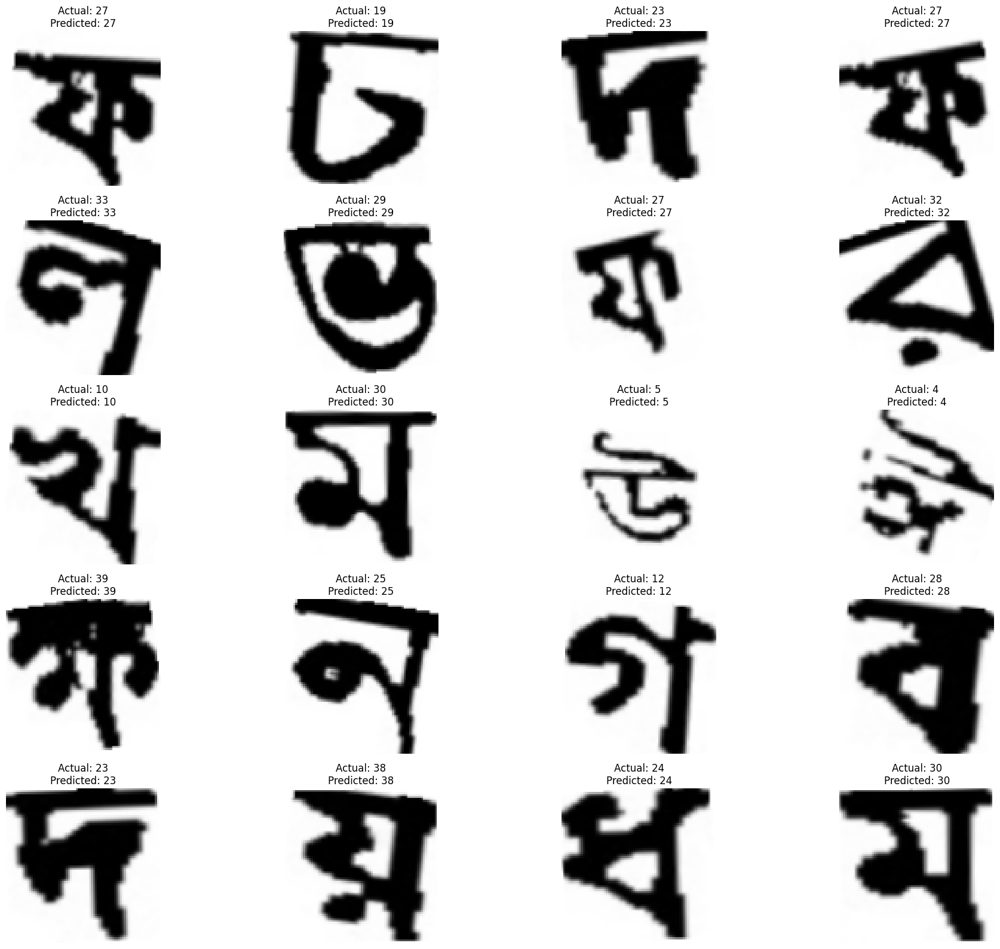

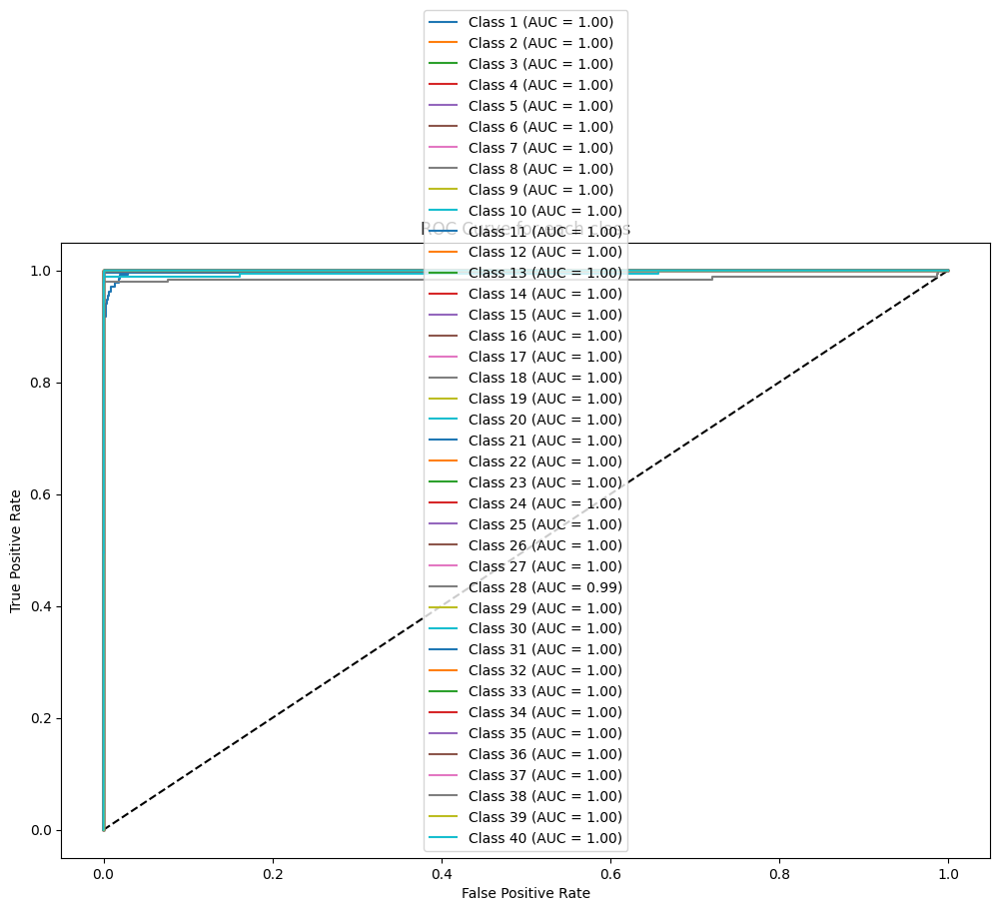

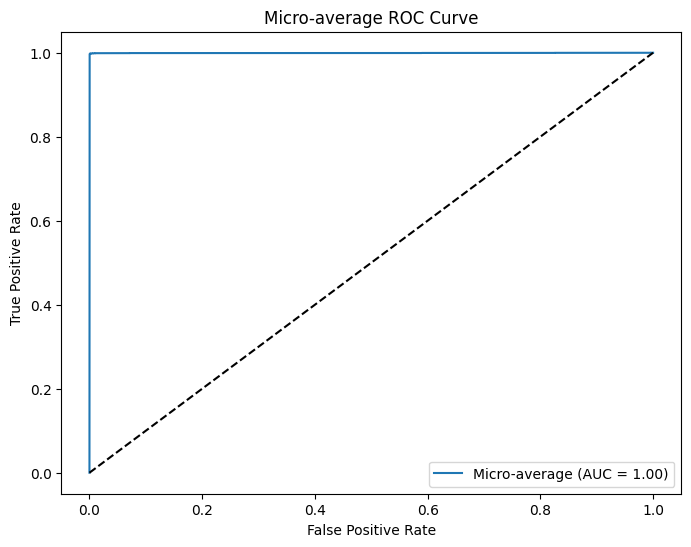

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import RMSprop
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2

def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder) - 1 
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels


dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=1)


num_classes = 40 
y_train_encoded = to_categorical(y_train, num_classes)
y_test_encoded = to_categorical(y_test, num_classes)


cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)


base_model = VGG19(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output) 
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)


merged_model = concatenate([cnn_output, vgg_output])


output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer= RMSprop(), loss='categorical_crossentropy', metrics=['accuracy'])


history = model.fit([x_train, x_train], y_train_encoded,
                    batch_size=64,  
                    epochs=10, 
                    validation_split=0.2,
                    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)])

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


predictions = model.predict([x_test, x_test])
predicted_classes = np.argmax(predictions, axis=1)

f1 = f1_score(y_test, predicted_classes, average='macro')
print("F1 Score:", f1)

cm = confusion_matrix(y_test, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(num_classes), np.arange(1, num_classes + 1))  
plt.yticks(np.arange(num_classes), np.arange(1, num_classes + 1))  
plt.show()


report = classification_report(y_test, predicted_classes)
print("Classification Report:")
print(report)

def display_sample_images_with_predictions(images, actual_labels, predicted_labels, class_names, num_samples=20, num_rows=5):
    plt.figure(figsize=(20, 16))
    for i in range(num_samples):
        plt.subplot(num_rows, num_samples // num_rows, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()


class_names = [str(i) for i in range(1, 41)]  
display_sample_images_with_predictions(x_test, y_test, predicted_classes, class_names)
from sklearn.metrics import roc_curve, auc

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_encoded[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr_micro, tpr_micro, _ = roc_curve(y_test_encoded.ravel(), predictions.ravel())
roc_auc_micro = auc(fpr_micro, tpr_micro)


plt.figure(figsize=(12, 8))
plt.plot([0, 1], [0, 1], 'k--')
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i+1} (AUC = {roc_auc[i]:.2f})')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for each class')
plt.legend(loc="best")
plt.show()


plt.figure(figsize=(8, 6))
plt.plot(fpr_micro, tpr_micro, label='Micro-average (AUC = {0:0.2f})'.format(roc_auc_micro))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-average ROC Curve')
plt.legend(loc="best")
plt.show()


# Rmsprop 128

Epoch 1/10
105/105 [==============================] - 25s 178ms/step - loss: 33.4675 - accuracy: 0.8170 - val_loss: 0.6495 - val_accuracy: 0.9863
Epoch 2/10
105/105 [==============================] - 14s 135ms/step - loss: 0.4765 - accuracy: 0.9870 - val_loss: 0.3003 - val_accuracy: 0.9928
Epoch 3/10
105/105 [==============================] - 14s 131ms/step - loss: 0.2227 - accuracy: 0.9930 - val_loss: 0.1860 - val_accuracy: 0.9916
Epoch 4/10
105/105 [==============================] - 14s 130ms/step - loss: 0.1272 - accuracy: 0.9941 - val_loss: 0.1351 - val_accuracy: 0.9889
Epoch 5/10
105/105 [==============================] - 14s 131ms/step - loss: 0.0851 - accuracy: 0.9965 - val_loss: 0.1007 - val_accuracy: 0.9928
Epoch 6/10
105/105 [==============================] - 14s 133ms/step - loss: 0.0723 - accuracy: 0.9964 - val_loss: 0.0905 - val_accuracy: 0.9898
Epoch 7/10
105/105 [==============================] - 14s 134ms/step - loss: 0.0595 - accuracy: 0.9961 - val_loss: 0.0824 - val_a

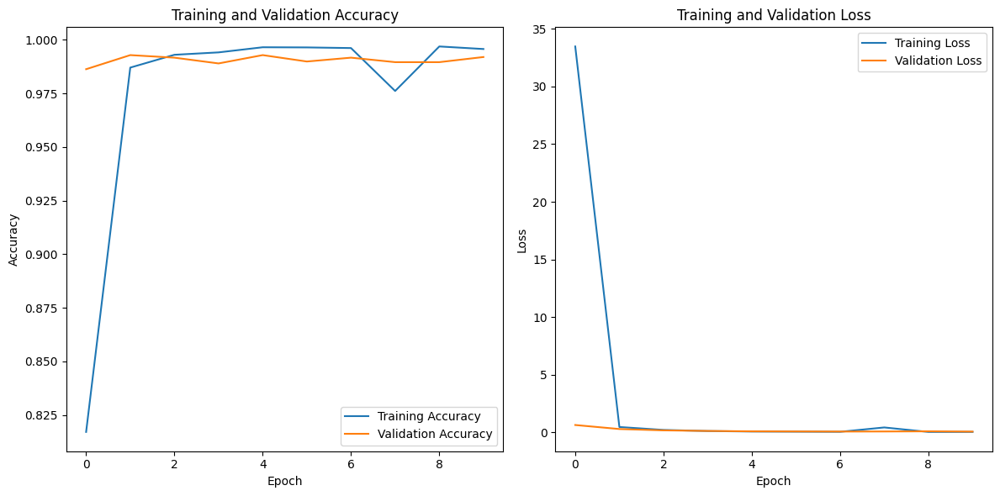

225/225 [==============================] - 7s 29ms/step
F1 Score: 0.9869632837104856


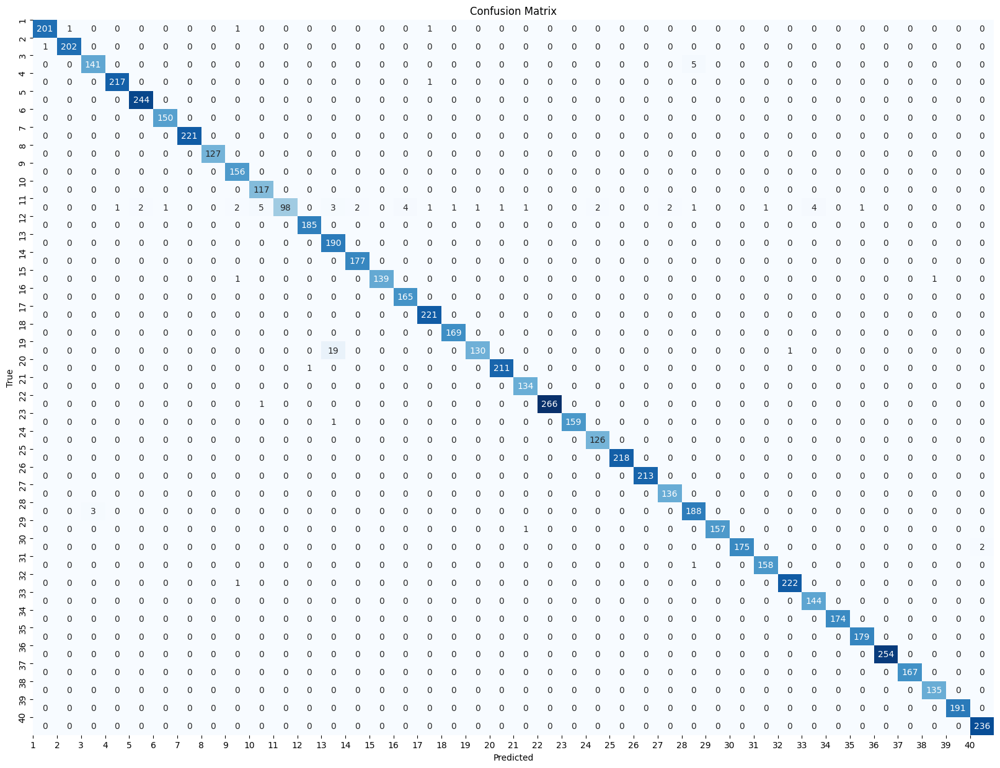

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99       204
           1       1.00      1.00      1.00       203
           2       0.98      0.97      0.97       146
           3       1.00      1.00      1.00       218
           4       0.99      1.00      1.00       244
           5       0.99      1.00      1.00       150
           6       1.00      1.00      1.00       221
           7       1.00      1.00      1.00       127
           8       0.97      1.00      0.98       156
           9       0.95      1.00      0.97       117
          10       1.00      0.73      0.84       134
          11       0.99      1.00      1.00       185
          12       0.89      1.00      0.94       190
          13       0.99      1.00      0.99       177
          14       1.00      0.99      0.99       141
          15       0.98      1.00      0.99       165
          16       0.99      1.00      0.99       221
    

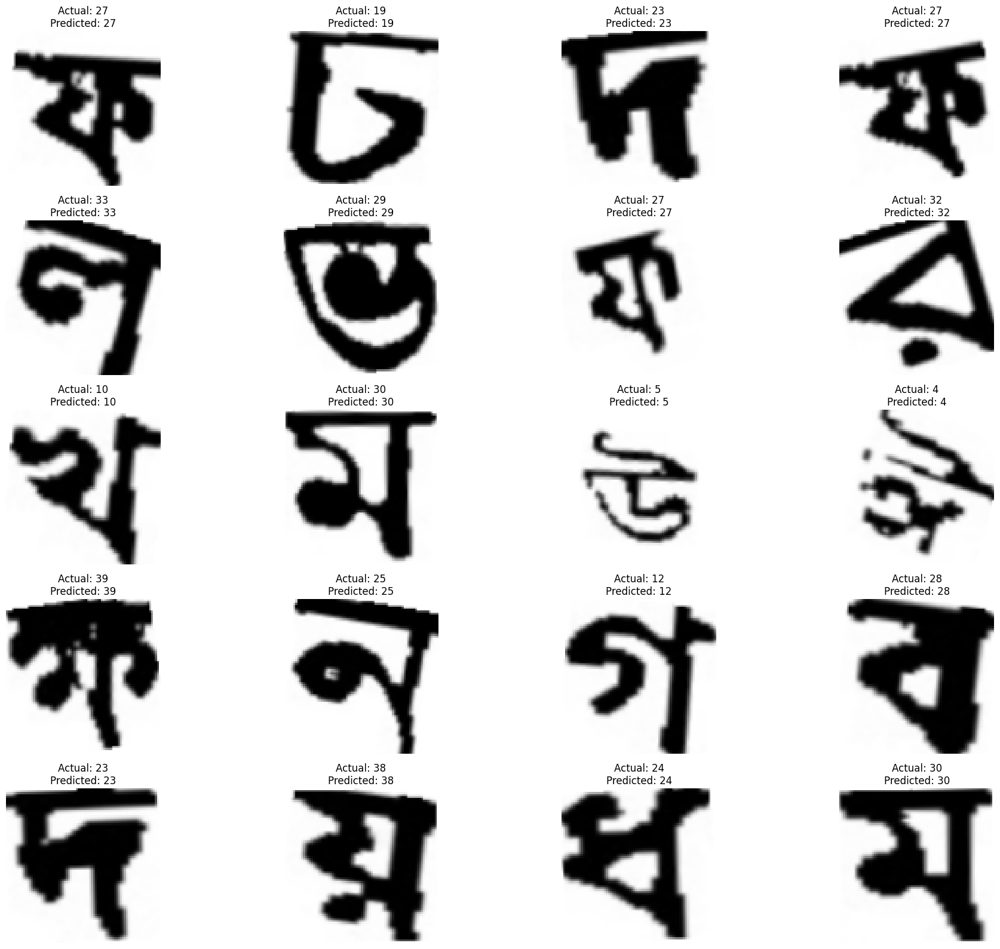

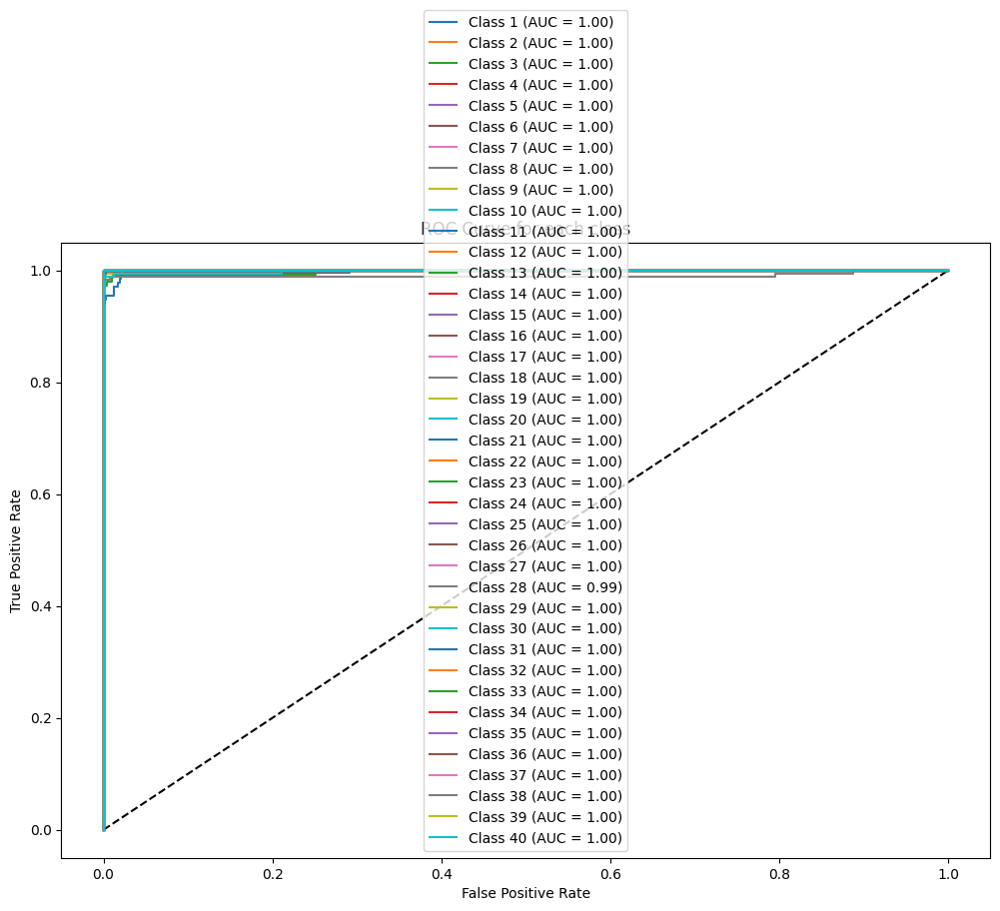

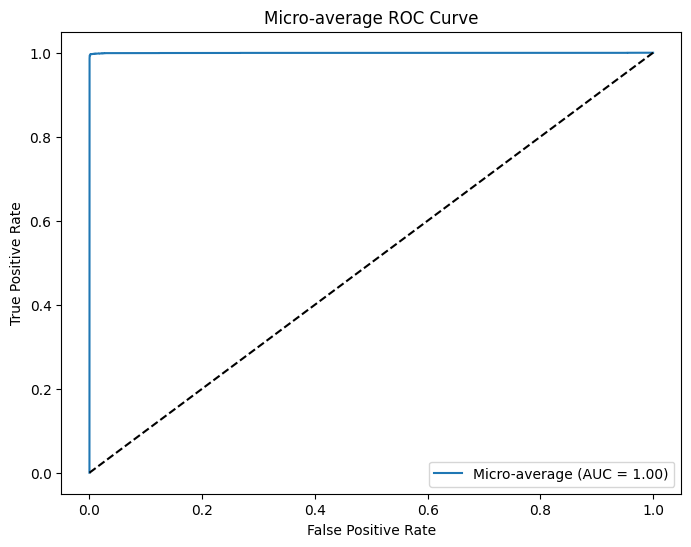

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import RMSprop
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2


def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder) - 1  
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels


dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=1)


num_classes = 40  
y_train_encoded = to_categorical(y_train, num_classes)
y_test_encoded = to_categorical(y_test, num_classes)


cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)


base_model = VGG19(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

merged_model = concatenate([cnn_output, vgg_output])


output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)


for layer in base_model.layers:
    layer.trainable = False


model.compile(optimizer= RMSprop(), loss='categorical_crossentropy', metrics=['accuracy'])


history = model.fit([x_train, x_train], y_train_encoded,
                    batch_size=128, 
                    epochs=10,  
                    validation_split=0.2,
                    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)])


plt.figure(figsize=(12, 6))


plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

predictions = model.predict([x_test, x_test])
predicted_classes = np.argmax(predictions, axis=1)

f1 = f1_score(y_test, predicted_classes, average='macro')
print("F1 Score:", f1)


cm = confusion_matrix(y_test, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(num_classes), np.arange(1, num_classes + 1))  # Adjust x-axis labels
plt.yticks(np.arange(num_classes), np.arange(1, num_classes + 1))  # Adjust y-axis labels
plt.show()


report = classification_report(y_test, predicted_classes)
print("Classification Report:")
print(report)

def display_sample_images_with_predictions(images, actual_labels, predicted_labels, class_names, num_samples=20, num_rows=5):
    plt.figure(figsize=(20, 16))
    for i in range(num_samples):
        plt.subplot(num_rows, num_samples // num_rows, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()


class_names = [str(i) for i in range(1, 41)] 
display_sample_images_with_predictions(x_test, y_test, predicted_classes, class_names)
from sklearn.metrics import roc_curve, auc


fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_encoded[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])


fpr_micro, tpr_micro, _ = roc_curve(y_test_encoded.ravel(), predictions.ravel())
roc_auc_micro = auc(fpr_micro, tpr_micro)


plt.figure(figsize=(12, 8))
plt.plot([0, 1], [0, 1], 'k--')
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i+1} (AUC = {roc_auc[i]:.2f})')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for each class')
plt.legend(loc="best")
plt.show()

plt.figure(figsize=(8, 6))
plt.plot(fpr_micro, tpr_micro, label='Micro-average (AUC = {0:0.2f})'.format(roc_auc_micro))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-average ROC Curve')
plt.legend(loc="best")
plt.show()


# ADAgrad bt 16

Epoch 1/10
837/837 [==============================] - 25s 29ms/step - loss: 2.9909 - accuracy: 0.9138 - val_loss: 0.1491 - val_accuracy: 0.9851
Epoch 2/10
837/837 [==============================] - 22s 27ms/step - loss: 0.1685 - accuracy: 0.9805 - val_loss: 0.0982 - val_accuracy: 0.9886
Epoch 3/10
837/837 [==============================] - 21s 26ms/step - loss: 0.1100 - accuracy: 0.9874 - val_loss: 0.1096 - val_accuracy: 0.9875
Epoch 4/10
837/837 [==============================] - 21s 25ms/step - loss: 0.0827 - accuracy: 0.9901 - val_loss: 0.1451 - val_accuracy: 0.9752
Epoch 5/10
837/837 [==============================] - 21s 26ms/step - loss: 0.0720 - accuracy: 0.9901 - val_loss: 0.1128 - val_accuracy: 0.9800


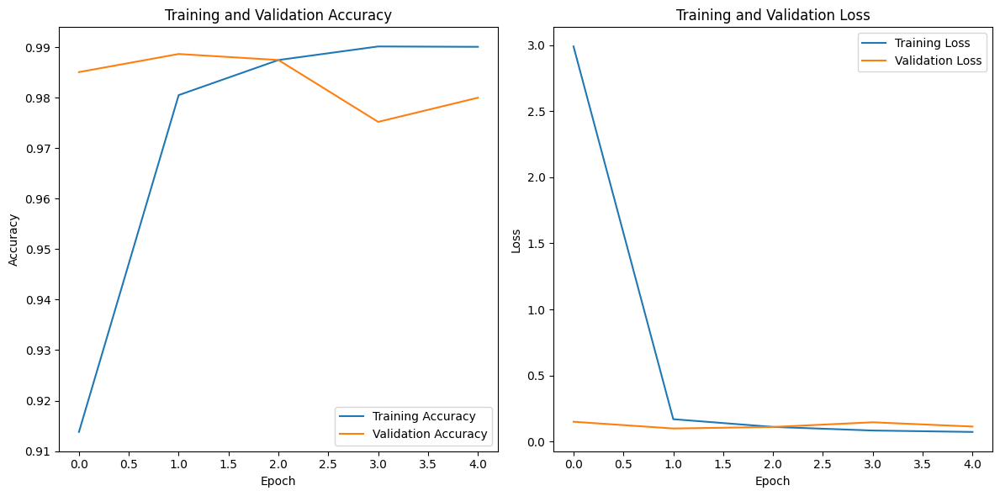

225/225 [==============================] - 9s 33ms/step
F1 Score: 0.9850302068834882


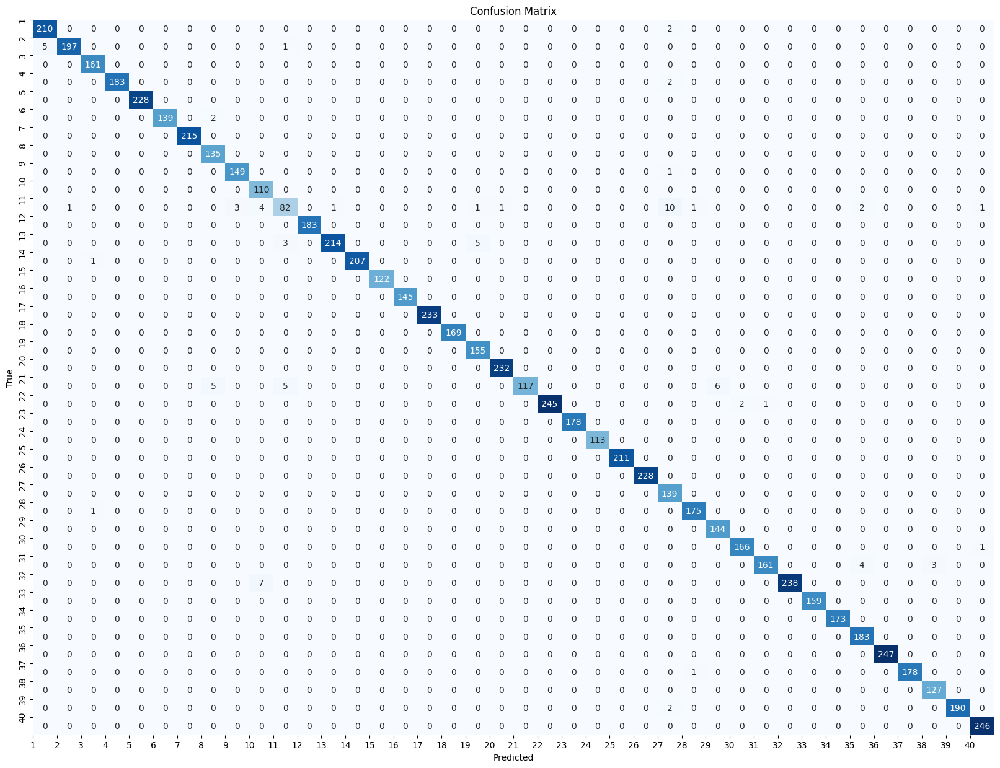

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.98       212
           1       0.99      0.97      0.98       203
           2       0.99      1.00      0.99       161
           3       1.00      0.99      0.99       185
           4       1.00      1.00      1.00       228
           5       1.00      0.99      0.99       141
           6       1.00      1.00      1.00       215
           7       0.95      1.00      0.97       135
           8       0.98      0.99      0.99       150
           9       0.91      1.00      0.95       110
          10       0.90      0.77      0.83       107
          11       1.00      1.00      1.00       183
          12       1.00      0.96      0.98       222
          13       1.00      1.00      1.00       208
          14       1.00      1.00      1.00       122
          15       1.00      1.00      1.00       145
          16       1.00      1.00      1.00       233
    

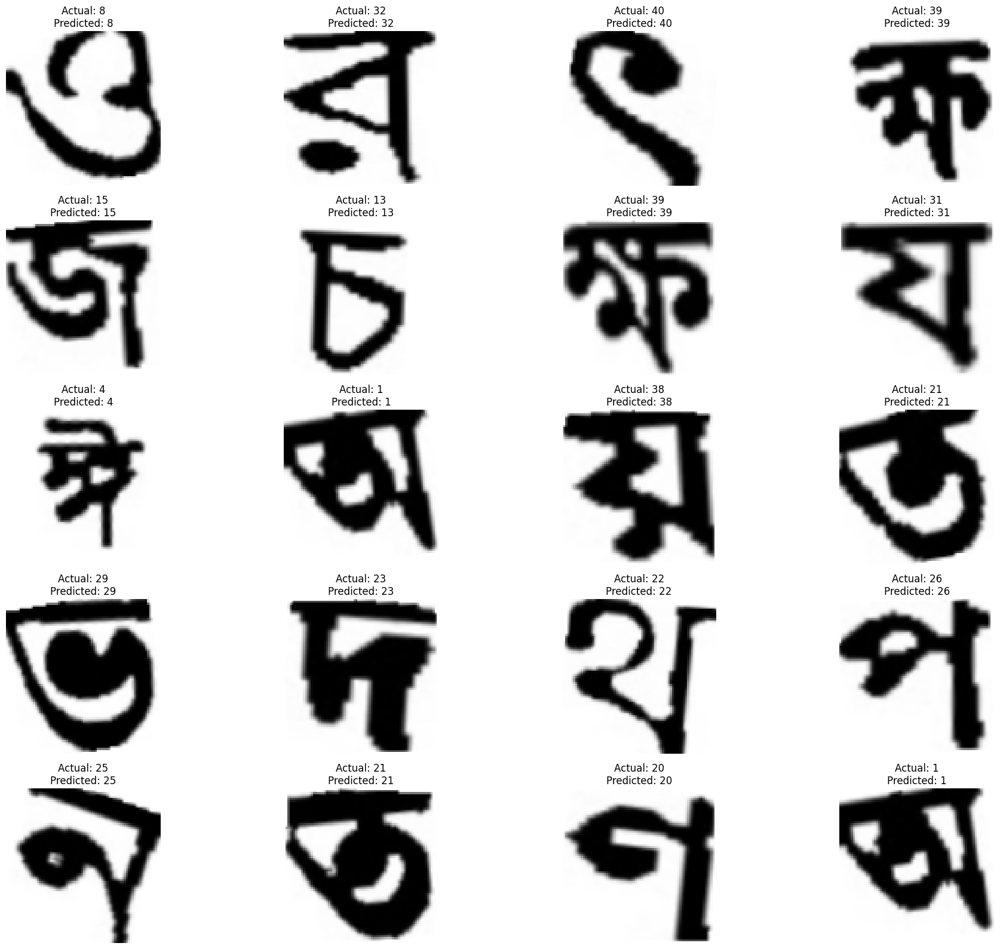

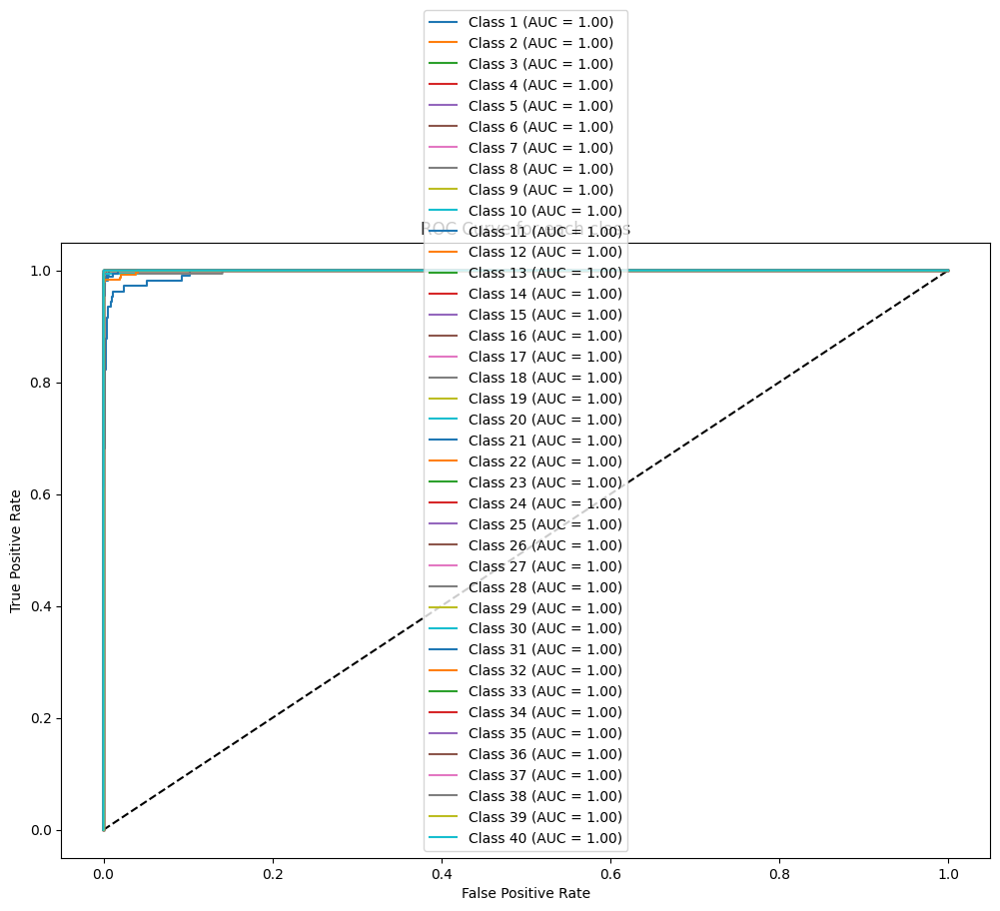

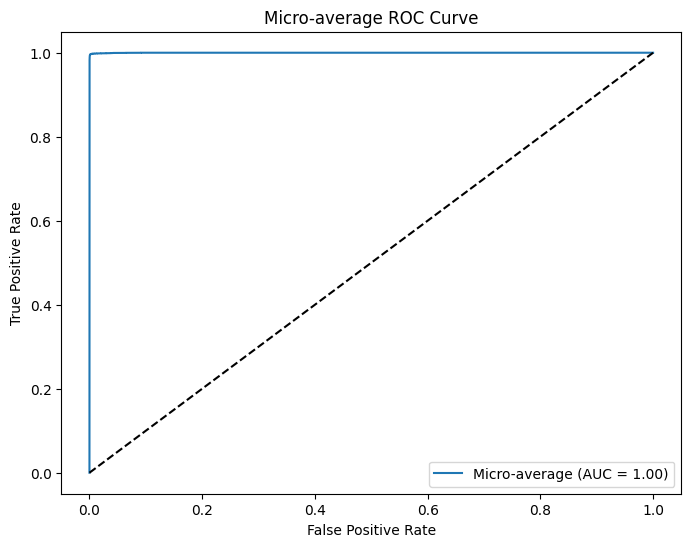

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import RMSprop
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2

def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder) - 1  
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels

dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)

x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=1)

num_classes = 40 
y_train_encoded = to_categorical(y_train, num_classes)
y_test_encoded = to_categorical(y_test, num_classes)

cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)

base_model = VGG19(weights='imagenet', include_top=False, input_shape=(80, 80, 3))

vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output) 
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)

merged_model = concatenate([cnn_output, vgg_output])

output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer= RMSprop(), loss='categorical_crossentropy', metrics=['accuracy'])

history = model.fit([x_train, x_train], y_train_encoded,
                    batch_size=16,  
                    epochs=10,  
                    validation_split=0.2,
                    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)])

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

predictions = model.predict([x_test, x_test])
predicted_classes = np.argmax(predictions, axis=1)

f1 = f1_score(y_test, predicted_classes, average='macro')
print("F1 Score:", f1)

cm = confusion_matrix(y_test, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(num_classes), np.arange(1, num_classes + 1))  
plt.yticks(np.arange(num_classes), np.arange(1, num_classes + 1))  
plt.show()


report = classification_report(y_test, predicted_classes)
print("Classification Report:")
print(report)
def display_sample_images_with_predictions(images, actual_labels, predicted_labels, class_names, num_samples=20, num_rows=5):
    plt.figure(figsize=(20, 16))
    for i in range(num_samples):
        plt.subplot(num_rows, num_samples // num_rows, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

class_names = [str(i) for i in range(1, 41)]  
display_sample_images_with_predictions(x_test, y_test, predicted_classes, class_names)
from sklearn.metrics import roc_curve, auc

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_encoded[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr_micro, tpr_micro, _ = roc_curve(y_test_encoded.ravel(), predictions.ravel())
roc_auc_micro = auc(fpr_micro, tpr_micro)


plt.figure(figsize=(12, 8))
plt.plot([0, 1], [0, 1], 'k--')
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i+1} (AUC = {roc_auc[i]:.2f})')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for each class')
plt.legend(loc="best")
plt.show()


plt.figure(figsize=(8, 6))
plt.plot(fpr_micro, tpr_micro, label='Micro-average (AUC = {0:0.2f})'.format(roc_auc_micro))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-average ROC Curve')
plt.legend(loc="best")
plt.show()


# ADAgrad 32

Epoch 1/10
419/419 [==============================] - 21s 46ms/step - loss: 4.5929 - accuracy: 0.9064 - val_loss: 0.3206 - val_accuracy: 0.9653
Epoch 2/10
419/419 [==============================] - 18s 44ms/step - loss: 0.1693 - accuracy: 0.9847 - val_loss: 0.1396 - val_accuracy: 0.9863
Epoch 3/10
419/419 [==============================] - 17s 42ms/step - loss: 0.1109 - accuracy: 0.9899 - val_loss: 0.0946 - val_accuracy: 0.9928
Epoch 4/10
419/419 [==============================] - 17s 41ms/step - loss: 0.0821 - accuracy: 0.9916 - val_loss: 0.0838 - val_accuracy: 0.9910
Epoch 5/10
419/419 [==============================] - 17s 41ms/step - loss: 0.0887 - accuracy: 0.9906 - val_loss: 0.1085 - val_accuracy: 0.9848
Epoch 6/10
419/419 [==============================] - 17s 42ms/step - loss: 0.0649 - accuracy: 0.9939 - val_loss: 0.0725 - val_accuracy: 0.9934
Epoch 7/10
419/419 [==============================] - 18s 42ms/step - loss: 0.0567 - accuracy: 0.9944 - val_loss: 0.1645 - val_accuracy:

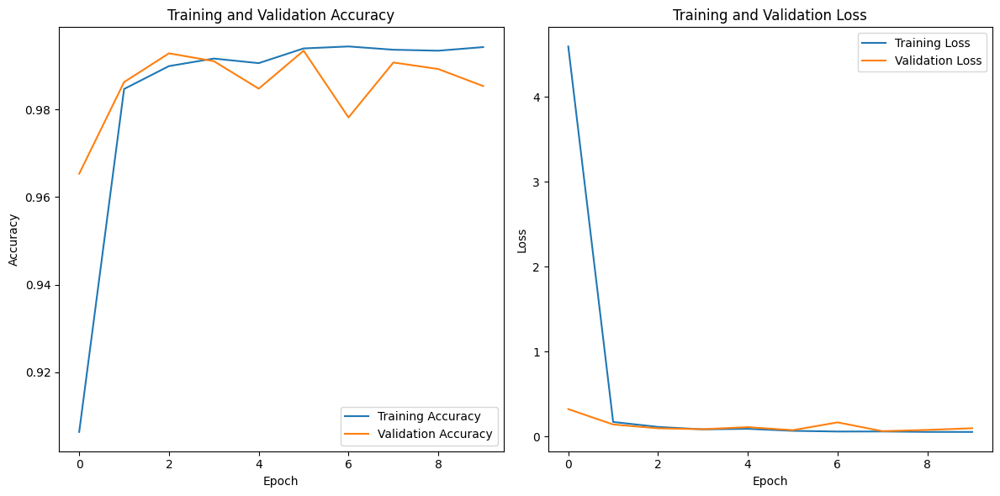

225/225 [==============================] - 7s 30ms/step
F1 Score: 0.9828076901048417


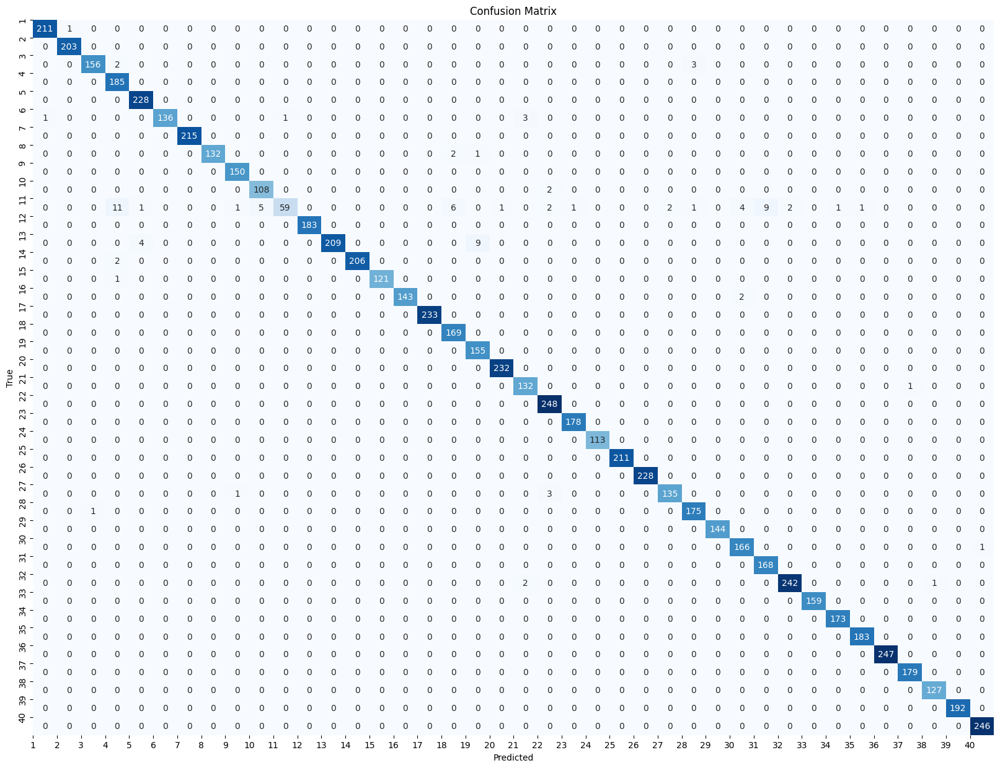

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       212
           1       1.00      1.00      1.00       203
           2       0.99      0.97      0.98       161
           3       0.92      1.00      0.96       185
           4       0.98      1.00      0.99       228
           5       1.00      0.96      0.98       141
           6       1.00      1.00      1.00       215
           7       1.00      0.98      0.99       135
           8       0.99      1.00      0.99       150
           9       0.96      0.98      0.97       110
          10       0.98      0.55      0.71       107
          11       1.00      1.00      1.00       183
          12       1.00      0.94      0.97       222
          13       1.00      0.99      1.00       208
          14       1.00      0.99      1.00       122
          15       1.00      0.99      0.99       145
          16       1.00      1.00      1.00       233
    

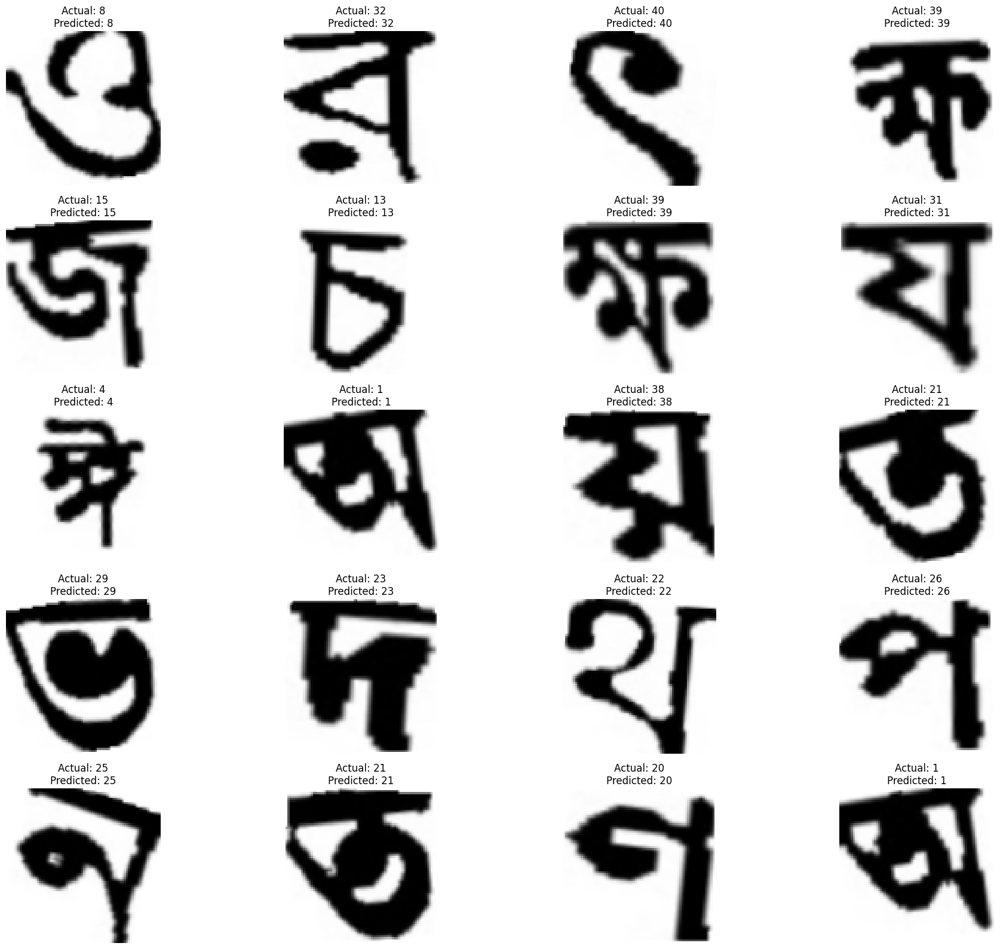

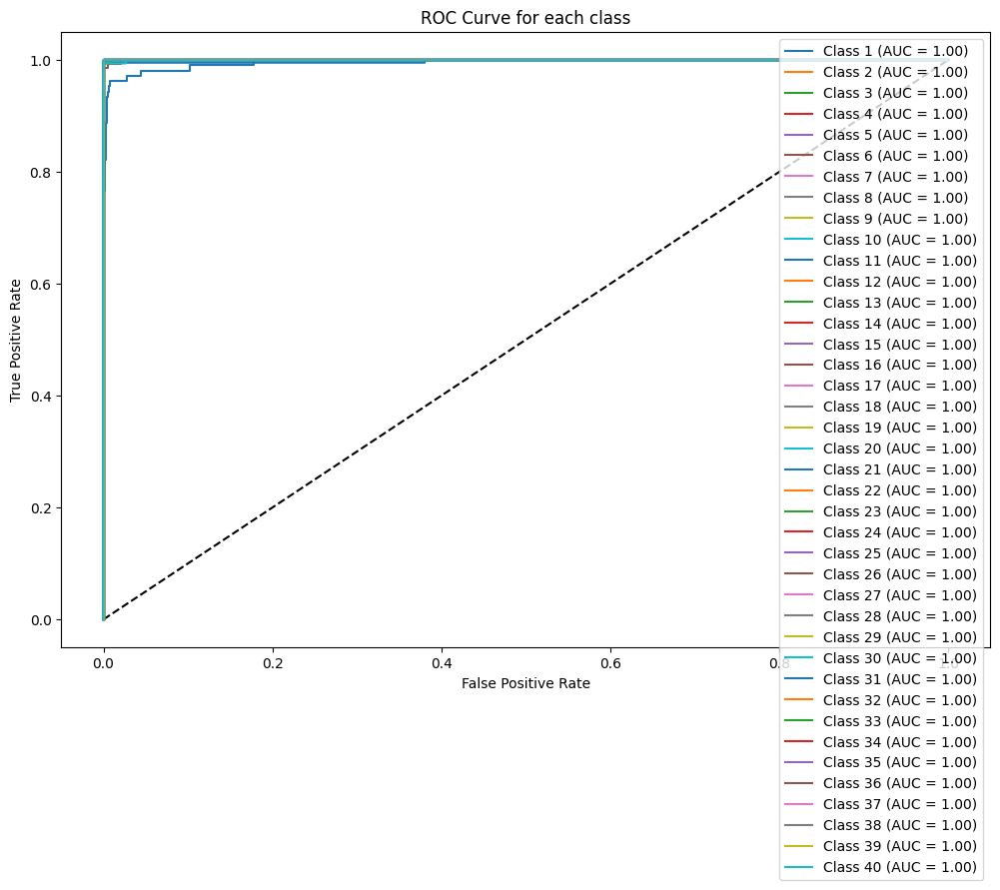

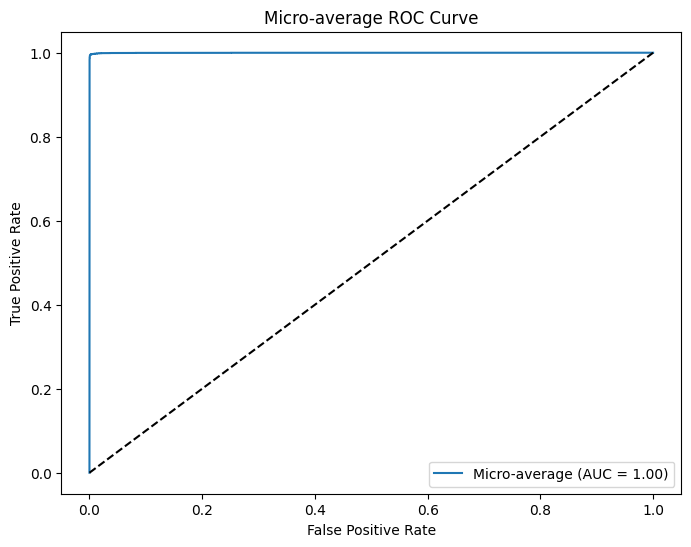

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import RMSprop
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2

def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder) - 1 
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels


dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)


x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=1)


num_classes = 40  
y_train_encoded = to_categorical(y_train, num_classes)
y_test_encoded = to_categorical(y_test, num_classes)

cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)


base_model = VGG19(weights='imagenet', include_top=False, input_shape=(80, 80, 3))


vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output) 
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)


merged_model = concatenate([cnn_output, vgg_output])

output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)


for layer in base_model.layers:
    layer.trainable = False


model.compile(optimizer= RMSprop(), loss='categorical_crossentropy', metrics=['accuracy'])


history = model.fit([x_train, x_train], y_train_encoded,
                    batch_size=32,  
                    epochs=10,  
                    validation_split=0.2,
                    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)])

plt.figure(figsize=(12, 6))


plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

predictions = model.predict([x_test, x_test])
predicted_classes = np.argmax(predictions, axis=1)


f1 = f1_score(y_test, predicted_classes, average='macro')
print("F1 Score:", f1)

cm = confusion_matrix(y_test, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(num_classes), np.arange(1, num_classes + 1))  
plt.yticks(np.arange(num_classes), np.arange(1, num_classes + 1))  
plt.show()


report = classification_report(y_test, predicted_classes)
print("Classification Report:")
print(report)

def display_sample_images_with_predictions(images, actual_labels, predicted_labels, class_names, num_samples=20, num_rows=5):
    plt.figure(figsize=(20, 16))
    for i in range(num_samples):
        plt.subplot(num_rows, num_samples // num_rows, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()


class_names = [str(i) for i in range(1, 41)]  
display_sample_images_with_predictions(x_test, y_test, predicted_classes, class_names)
from sklearn.metrics import roc_curve, auc

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_encoded[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])


fpr_micro, tpr_micro, _ = roc_curve(y_test_encoded.ravel(), predictions.ravel())
roc_auc_micro = auc(fpr_micro, tpr_micro)


plt.figure(figsize=(12, 8))
plt.plot([0, 1], [0, 1], 'k--')
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i+1} (AUC = {roc_auc[i]:.2f})')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for each class')
plt.legend(loc="best")
plt.show()


plt.figure(figsize=(8, 6))
plt.plot(fpr_micro, tpr_micro, label='Micro-average (AUC = {0:0.2f})'.format(roc_auc_micro))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-average ROC Curve')
plt.legend(loc="best")
plt.show()


# RMSprop Batch size 64

Epoch 1/10
210/210 [==============================] - 20s 76ms/step - loss: 4.5323 - accuracy: 0.8843 - val_loss: 0.3308 - val_accuracy: 0.9889
Epoch 2/10
210/210 [==============================] - 16s 76ms/step - loss: 0.2215 - accuracy: 0.9898 - val_loss: 0.1587 - val_accuracy: 0.9886
Epoch 3/10
210/210 [==============================] - 15s 74ms/step - loss: 0.2811 - accuracy: 0.9801 - val_loss: 0.1354 - val_accuracy: 0.9895
Epoch 4/10
210/210 [==============================] - 15s 71ms/step - loss: 0.0949 - accuracy: 0.9944 - val_loss: 0.1081 - val_accuracy: 0.9860
Epoch 5/10
210/210 [==============================] - 15s 71ms/step - loss: 0.0798 - accuracy: 0.9939 - val_loss: 0.0677 - val_accuracy: 0.9952
Epoch 6/10
210/210 [==============================] - 15s 72ms/step - loss: 0.0965 - accuracy: 0.9907 - val_loss: 0.0685 - val_accuracy: 0.9946
Epoch 7/10
210/210 [==============================] - 15s 74ms/step - loss: 0.0591 - accuracy: 0.9952 - val_loss: 0.0760 - val_accuracy:

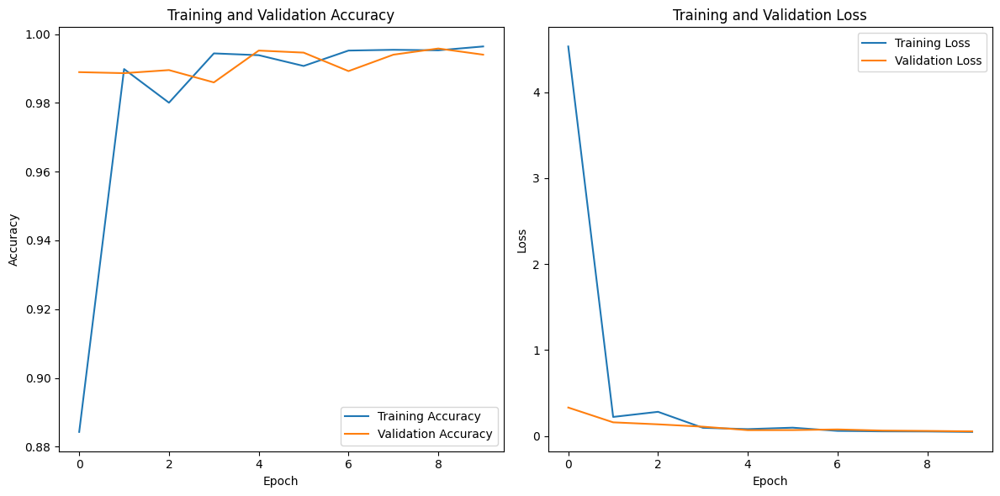

225/225 [==============================] - 7s 30ms/step
F1 Score: 0.9958789854497585


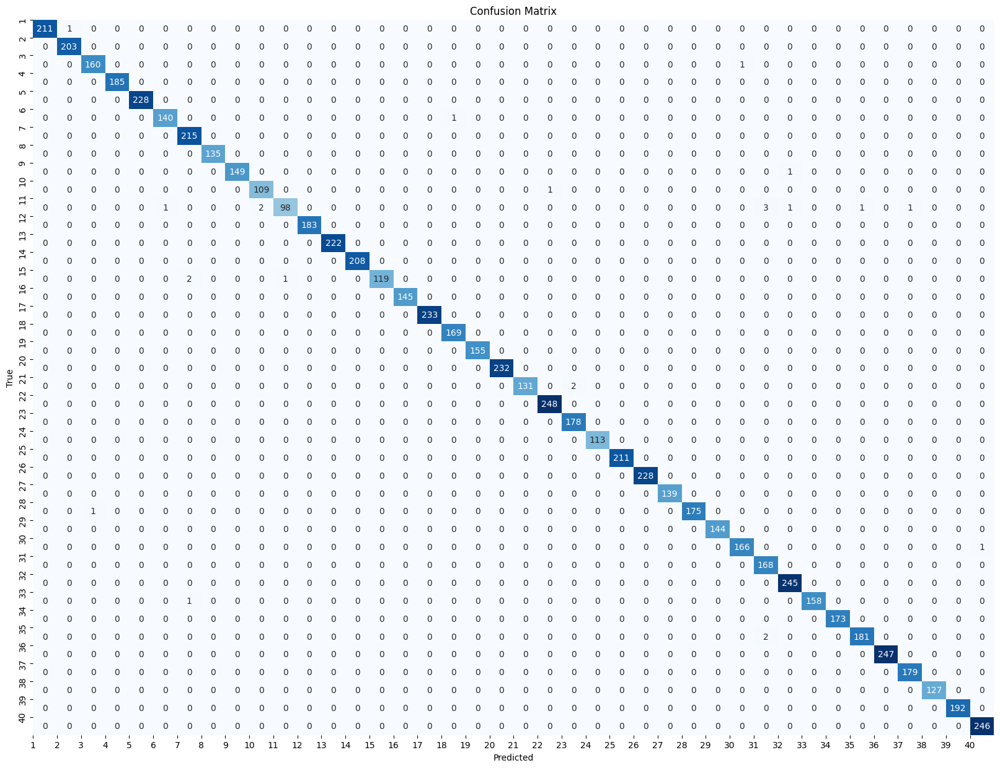

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       212
           1       1.00      1.00      1.00       203
           2       0.99      0.99      0.99       161
           3       1.00      1.00      1.00       185
           4       1.00      1.00      1.00       228
           5       0.99      0.99      0.99       141
           6       0.99      1.00      0.99       215
           7       1.00      1.00      1.00       135
           8       1.00      0.99      1.00       150
           9       0.98      0.99      0.99       110
          10       0.99      0.92      0.95       107
          11       1.00      1.00      1.00       183
          12       1.00      1.00      1.00       222
          13       1.00      1.00      1.00       208
          14       1.00      0.98      0.99       122
          15       1.00      1.00      1.00       145
          16       1.00      1.00      1.00       233
    

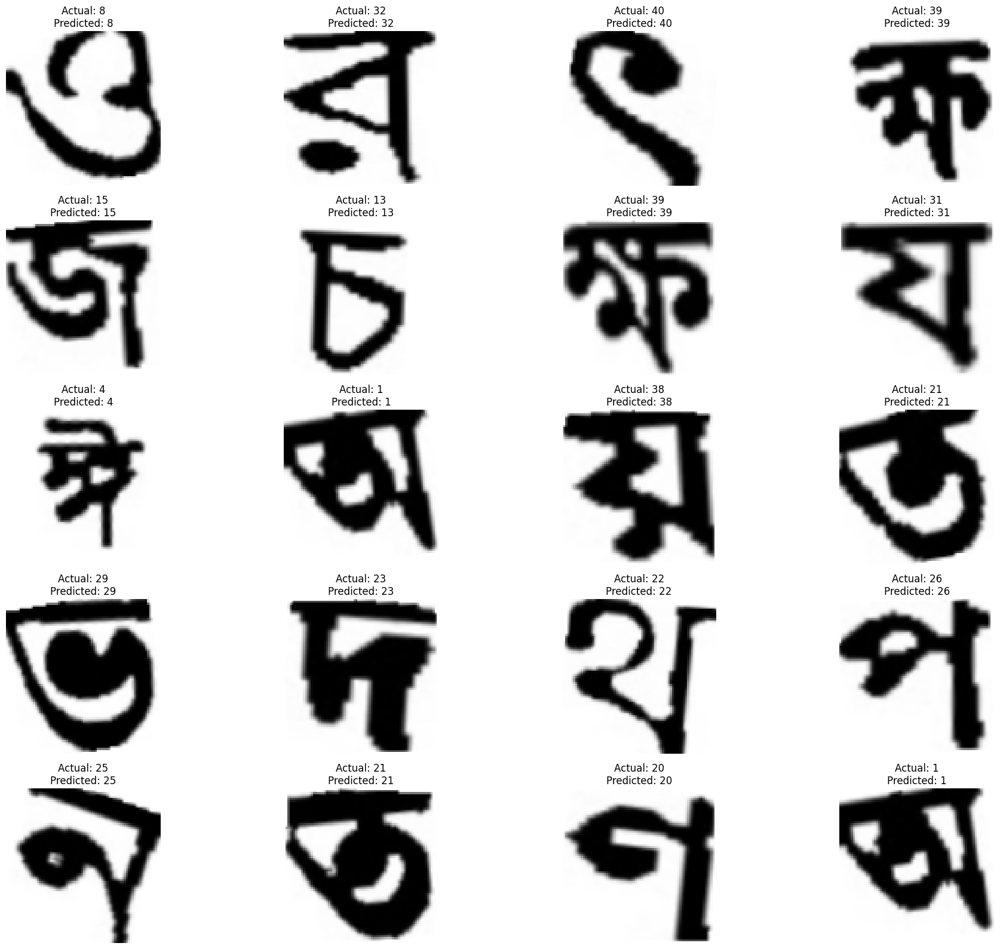

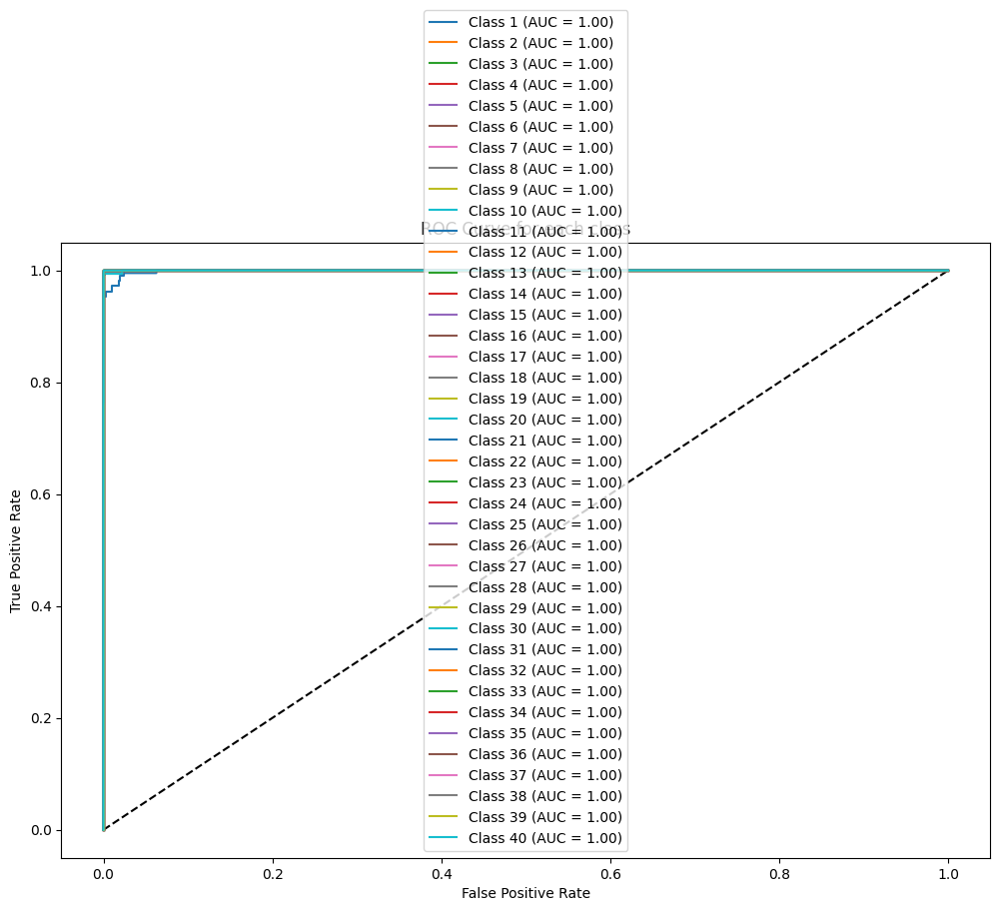

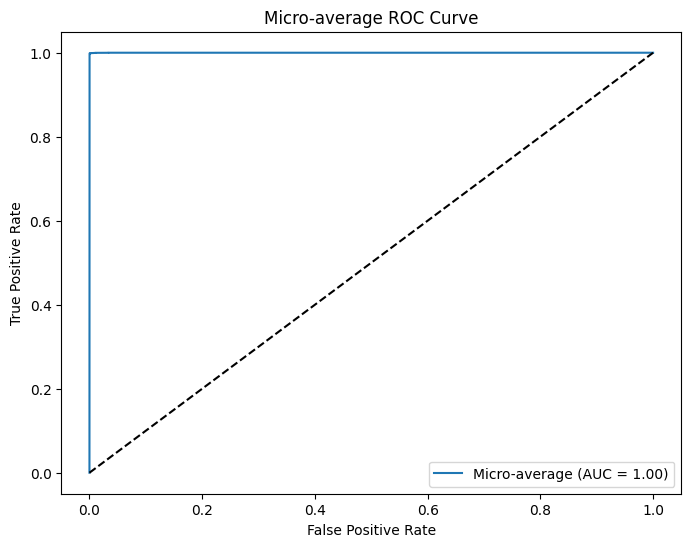

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import RMSprop
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2

def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder) - 1  
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80))  
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels


dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)


x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=1)


num_classes = 40  
y_train_encoded = to_categorical(y_train, num_classes)
y_test_encoded = to_categorical(y_test, num_classes)


cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)


base_model = VGG19(weights='imagenet', include_top=False, input_shape=(80, 80, 3))


vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)


merged_model = concatenate([cnn_output, vgg_output])


output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)


for layer in base_model.layers:
    layer.trainable = False


model.compile(optimizer=RMSprop(), loss='categorical_crossentropy', metrics=['accuracy'])


history = model.fit([x_train, x_train], y_train_encoded,
                    batch_size=64,  
                    epochs=10,  
                    validation_split=0.2)


plt.figure(figsize=(12, 6))


plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


predictions = model.predict([x_test, x_test])
predicted_classes = np.argmax(predictions, axis=1)


f1 = f1_score(y_test, predicted_classes, average='macro')
print("F1 Score:", f1)


cm = confusion_matrix(y_test, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(num_classes), np.arange(1, num_classes + 1))  
plt.yticks(np.arange(num_classes), np.arange(1, num_classes + 1))  
plt.show()


report = classification_report(y_test, predicted_classes)
print("Classification Report:")
print(report)


def display_sample_images_with_predictions(images, actual_labels, predicted_labels, class_names, num_samples=20, num_rows=5):
    plt.figure(figsize=(20, 16))
    for i in range(num_samples):
        plt.subplot(num_rows, num_samples // num_rows, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()


class_names = [str(i) for i in range(1, 41)]  
display_sample_images_with_predictions(x_test, y_test, predicted_classes, class_names)

from sklearn.metrics import roc_curve, auc


fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_encoded[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])


fpr_micro, tpr_micro, _ = roc_curve(y_test_encoded.ravel(), predictions.ravel())
roc_auc_micro = auc(fpr_micro, tpr_micro)


plt.figure(figsize=(12, 8))
plt.plot([0, 1], [0, 1], 'k--')
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i+1} (AUC = {roc_auc[i]:.2f})')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for each class')
plt.legend(loc="best")
plt.show()


plt.figure(figsize=(8, 6))
plt.plot(fpr_micro, tpr_micro, label='Micro-average (AUC = {0:0.2f})'.format(roc_auc_micro))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-average ROC Curve')
plt.legend(loc="best")
plt.show()


# adagrad batch size 128

Epoch 1/10
105/105 [==============================] - 26s 186ms/step - loss: 19.6510 - accuracy: 0.8289 - val_loss: 0.6481 - val_accuracy: 0.9857
Epoch 2/10
105/105 [==============================] - 15s 140ms/step - loss: 0.4714 - accuracy: 0.9868 - val_loss: 0.3159 - val_accuracy: 0.9922
Epoch 3/10
105/105 [==============================] - 14s 136ms/step - loss: 0.2458 - accuracy: 0.9904 - val_loss: 0.2248 - val_accuracy: 0.9803
Epoch 4/10
105/105 [==============================] - 14s 135ms/step - loss: 0.1503 - accuracy: 0.9945 - val_loss: 0.1165 - val_accuracy: 0.9949
Epoch 5/10
105/105 [==============================] - 14s 138ms/step - loss: 0.1008 - accuracy: 0.9950 - val_loss: 0.1500 - val_accuracy: 0.9812
Epoch 6/10
105/105 [==============================] - 15s 143ms/step - loss: 0.0851 - accuracy: 0.9942 - val_loss: 0.0878 - val_accuracy: 0.9937
Epoch 7/10
105/105 [==============================] - 15s 140ms/step - loss: 0.0851 - accuracy: 0.9944 - val_loss: 0.0679 - val_a

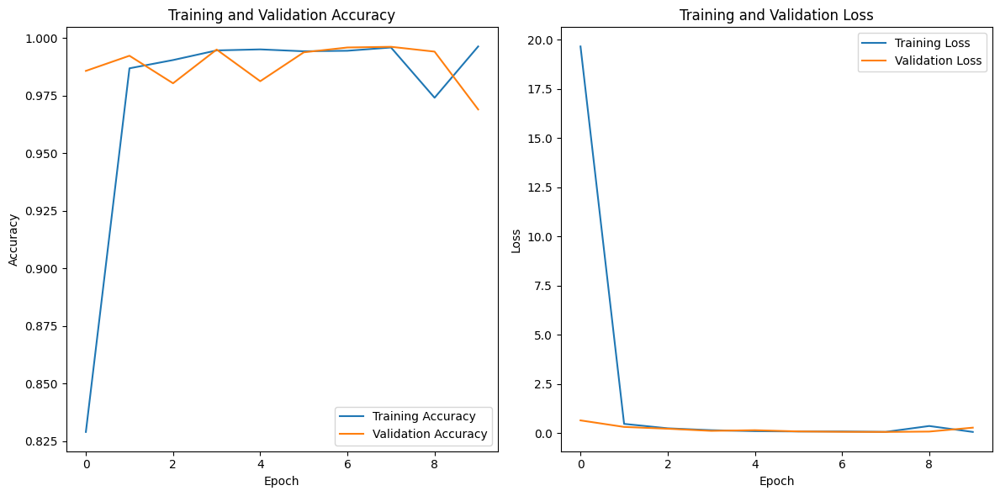

225/225 [==============================] - 7s 30ms/step
F1 Score: 0.9610677804891317


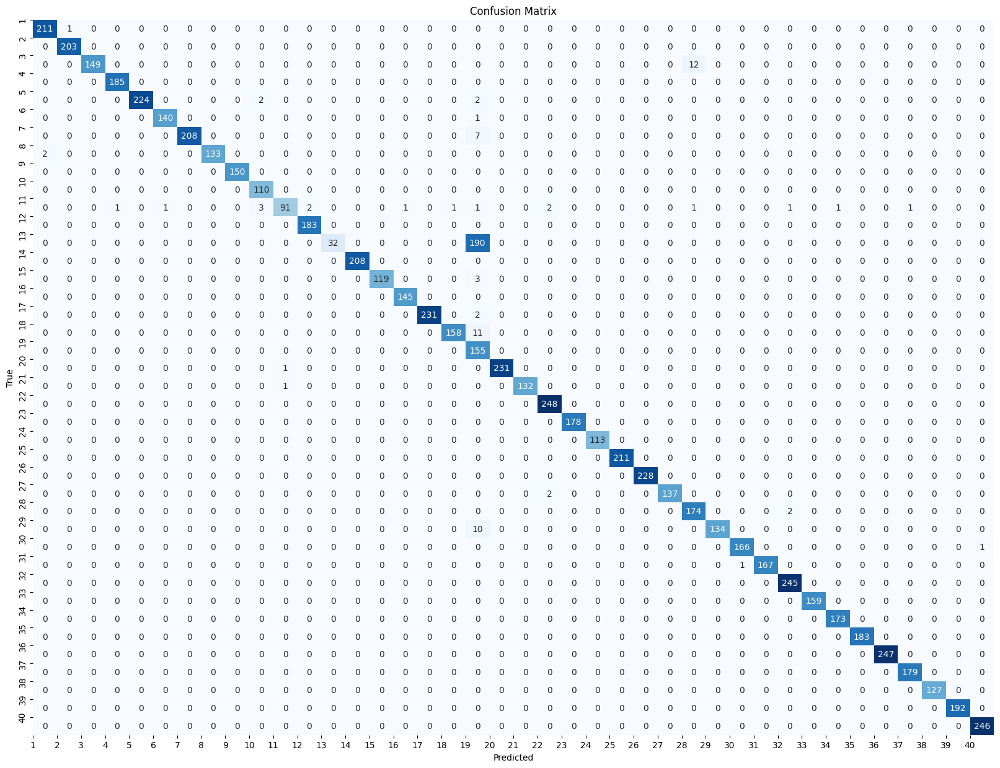

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99       212
           1       1.00      1.00      1.00       203
           2       1.00      0.93      0.96       161
           3       0.99      1.00      1.00       185
           4       1.00      0.98      0.99       228
           5       0.99      0.99      0.99       141
           6       1.00      0.97      0.98       215
           7       1.00      0.99      0.99       135
           8       1.00      1.00      1.00       150
           9       0.96      1.00      0.98       110
          10       0.98      0.85      0.91       107
          11       0.99      1.00      0.99       183
          12       1.00      0.14      0.25       222
          13       1.00      1.00      1.00       208
          14       1.00      0.98      0.99       122
          15       0.99      1.00      1.00       145
          16       1.00      0.99      1.00       233
    

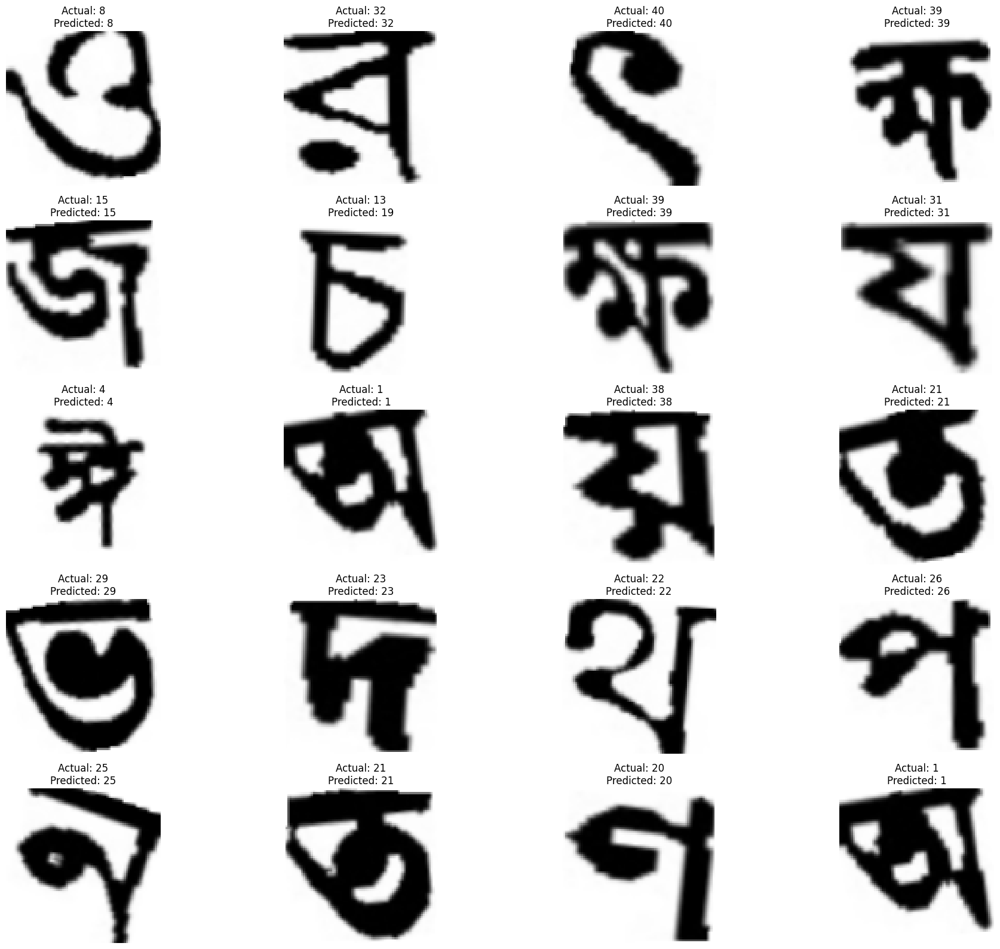

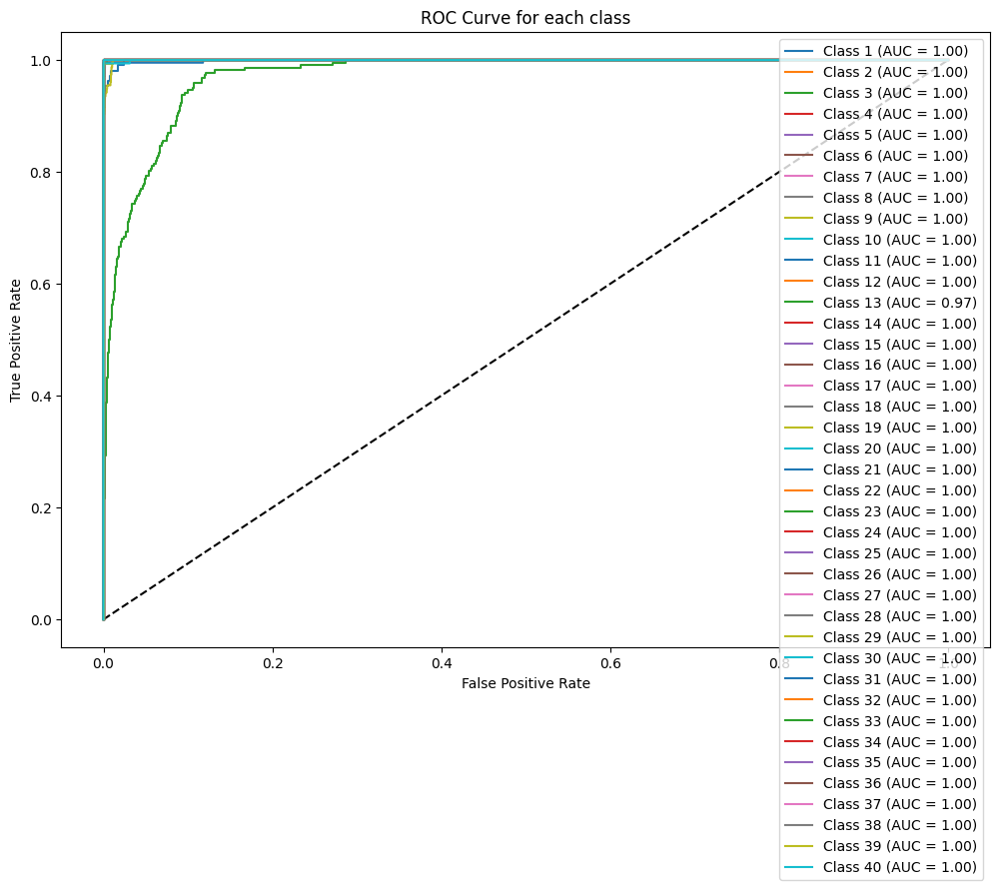

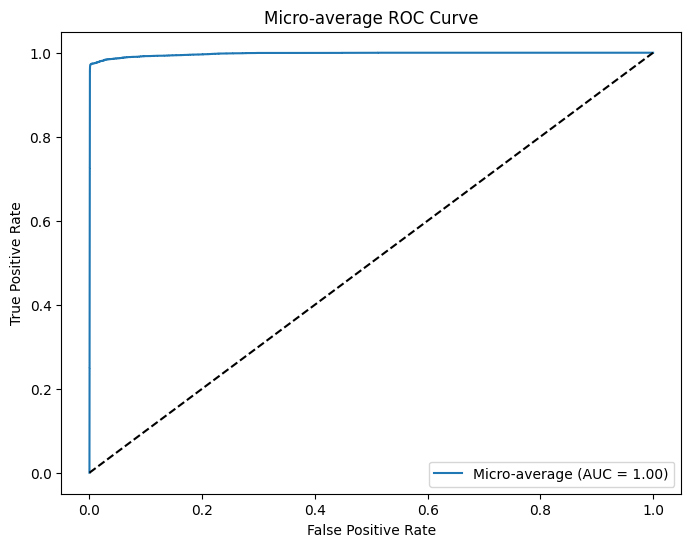

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras.applications import VGG19
from keras.models import Model
from keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Input, concatenate
from keras.optimizers import RMSprop
from keras.callbacks import EarlyStopping
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import seaborn as sns
from keras.regularizers import l2


def load_dataset(dataset_dir):
    images = []
    labels = []

    for class_folder in os.listdir(dataset_dir):
        label = int(class_folder) - 1  
        for image_name in os.listdir(os.path.join(dataset_dir, class_folder)):
            image = cv2.imread(os.path.join(dataset_dir, class_folder, image_name), cv2.IMREAD_COLOR)
            image = cv2.resize(image, (80, 80)) 
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
            images.append(image)
            labels.append(label)

    images = np.array(images)
    labels = np.array(labels)
    return images, labels


dataset_dir = '/content/class40'
images, labels = load_dataset(dataset_dir)


x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=1)


num_classes = 40  
y_train_encoded = to_categorical(y_train, num_classes)
y_test_encoded = to_categorical(y_test, num_classes)


cnn_input = Input(shape=(80, 80, 3))
cnn_layer1 = Conv2D(32, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_input)
cnn_layer2 = MaxPooling2D(pool_size=(2, 2))(cnn_layer1)
cnn_layer3 = Conv2D(64, kernel_size=(3, 3), activation='relu', kernel_regularizer=l2(0.001))(cnn_layer2)
cnn_layer4 = MaxPooling2D(pool_size=(2, 2))(cnn_layer3)
cnn_layer5 = Flatten()(cnn_layer4)
cnn_output = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(cnn_layer5)


base_model = VGG19(weights='imagenet', include_top=False, input_shape=(80, 80, 3))


vgg_output = Flatten()(base_model.output)
vgg_output = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(vgg_output)
vgg_output = Dropout(0.5)(vgg_output)  
vgg_output = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(vgg_output)


merged_model = concatenate([cnn_output, vgg_output])


output_layer = Dense(num_classes, activation='softmax', kernel_regularizer=l2(0.001))(merged_model)
model = Model(inputs=[cnn_input, base_model.input], outputs=output_layer)


for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer= RMSprop(), loss='categorical_crossentropy', metrics=['accuracy'])

history = model.fit([x_train, x_train], y_train_encoded,
                    batch_size=128, 
                    epochs=10, 
                    validation_split=0.2,
                    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)])


plt.figure(figsize=(12, 6))


plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


predictions = model.predict([x_test, x_test])
predicted_classes = np.argmax(predictions, axis=1)

f1 = f1_score(y_test, predicted_classes, average='macro')
print("F1 Score:", f1)


cm = confusion_matrix(y_test, predicted_classes)
plt.figure(figsize=(20, 15))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(np.arange(num_classes), np.arange(1, num_classes + 1)) 
plt.yticks(np.arange(num_classes), np.arange(1, num_classes + 1)) 
plt.show()

report = classification_report(y_test, predicted_classes)
print("Classification Report:")
print(report)

def display_sample_images_with_predictions(images, actual_labels, predicted_labels, class_names, num_samples=20, num_rows=5):
    plt.figure(figsize=(20, 16))
    for i in range(num_samples):
        plt.subplot(num_rows, num_samples // num_rows, i+1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_names[actual_labels[i]]}\nPredicted: {class_names[predicted_labels[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

class_names = [str(i) for i in range(1, 41)]  
display_sample_images_with_predictions(x_test, y_test, predicted_classes, class_names)
from sklearn.metrics import roc_curve, auc

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_encoded[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr_micro, tpr_micro, _ = roc_curve(y_test_encoded.ravel(), predictions.ravel())
roc_auc_micro = auc(fpr_micro, tpr_micro)


plt.figure(figsize=(12, 8))
plt.plot([0, 1], [0, 1], 'k--')
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i+1} (AUC = {roc_auc[i]:.2f})')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for each class')
plt.legend(loc="best")
plt.show()

plt.figure(figsize=(8, 6))
plt.plot(fpr_micro, tpr_micro, label='Micro-average (AUC = {0:0.2f})'.format(roc_auc_micro))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-average ROC Curve')
plt.legend(loc="best")
plt.show()
